# Transfomer(年齢予測)

## import ライブラリー

In [1]:
"""%%bash
python3 -m pip install --user torch
python3 -m pip install --user scikit-learn"""

'%%bash\npython3 -m pip install --user torch\npython3 -m pip install --user scikit-learn'

In [2]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold

from scipy.stats import pearsonr
from scipy.stats import norm

import torch
import torch.nn as nn

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.cuda.device_count()
#torch.set_default_tensor_type('torch.cuda.FloatTensor')

4

In [3]:
device

device(type='cuda')

## Data定義

In [4]:
%%time
#6分ぐらいかかる
df_aal = pd.read_csv('../02_data_analysis/roi_timeseries/timeseries_aal.csv')
df_ho = pd.read_csv('../02_data_analysis/roi_timeseries/timeseries_ho.csv')

#df_dynamic_aal = pd.read_csv('../02_data_analysis/dynamic_FC/dynamic_aal.csv')
#df_dynamic_ho = pd.read_csv('../02_data_analysis/dynamic_FC/dynamic_ho.csv')

df_subjects_info = pd.read_csv('../02_data_analysis/subjects_info/subjects_info.csv')

CPU times: user 3.28 s, sys: 173 ms, total: 3.46 s
Wall time: 3.46 s


In [5]:
def make_info_data(df = df_subjects_info,col = ['Age','Sex','やる気スコア(Apathy scale)']):
    subID = np.array(df.subID)
    subjects_info_list = []
    for ID in subID:
        data = np.array(df[df.subID == ID][col])[0]
        if 'Sex' in col:
            idx_sex = col.index('Sex')
            if data[idx_sex] == '男':
                data[idx_sex] = 0
            else:
                data[idx_sex] = 1
        
        subjects_info_list.append(data)
    subjects_info = np.array(subjects_info_list)
    
    if 'Age' in col:
        idx_age = col.index('Age')
    for i in range(len(col)):
        if i == idx_age:
            subjects_info[:,i] = (subjects_info[:,i] - \
                                  np.mean(subjects_info[:,i]))/np.std(subjects_info[:,i])
    return subjects_info.astype(np.float)

def make_data(df, subID = df_subjects_info.subID ,remove_list = ['time','subID']):
    data_list = []
    df_cols = list(df.columns)
    for r in remove_list:
        try:
            df_cols.remove(r)
        except:
            pass
    for ID in df_subjects_info.subID:
        data = df[df.subID == ID][df_cols]
        data = np.array(data)
        data_list.append(data)
    data = np.array(data_list)
    return data

In [6]:
%%time
data_label = make_info_data()
data_aal = make_data(df_aal)
data_ho = make_data(df_ho)

age_mean = df_subjects_info.Age.mean()
age_std = df_subjects_info.Age.std()

CPU times: user 10.1 s, sys: 28.2 ms, total: 10.2 s
Wall time: 10.1 s


In [7]:
data_label.shape
data_aal.shape
data_ho.shape

(615, 3)

(615, 140, 116)

(615, 140, 110)

In [8]:
#30秒ぐらいかかる
#data_dynamic_aal = make_data(df_dynamic_aal)
#data_dynamic_ho = make_data(df_dynamic_ho)

#data_dynamic_aal.shape
#data_dynamic_ho.shape

## Model作成

In [9]:
import math
class PositionalEncoding(nn.Module):

    def __init__(self, d_model: int, dropout: float = 0.1, max_len: int = 5000):
        super(PositionalEncoding, self).__init__()
        
        self.dropout = nn.Dropout(p=dropout)
        # Not a parameter
        self.register_buffer('pe', self._pe_table(d_model, max_len))

    def _pe_table(self, d_model: int, max_len: int) -> torch.Tensor:
        pos = torch.arange(0, max_len).unsqueeze(1)
        pe_denominator = torch.exp(
            torch.arange(0, d_model, 2) * math.log(10000) / d_model
        )

        pe = torch.zeros(max_len, d_model)
        pe[:, 0::2] = torch.sin(pos / pe_denominator)  # 偶数項にはsin
        pe[:, 1::2] = torch.cos(pos / pe_denominator)  # 奇数項にはcos

        pe = pe.unsqueeze(0)  # バッチに対応するため
        return pe

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.dropout(x + self.pe[:, :x.size(1)].clone().detach())

In [10]:
class Model(nn.Module):    
    def __init__(self,
                 input_dim,
                 d_model,
                 hidden_dim,
                 time_len,
                 nhead,
                 output_dim,
                 hidden_dim_transformer,
                 pos_drop,
                 trans_drop,
                 fc_drop
                ):
        super(Model, self).__init__()
        self.fc0  = nn.Linear(input_dim,d_model)
        self.pos  = PositionalEncoding(d_model = d_model,dropout=pos_drop)
        self.transformer_encoder_layer = nn.TransformerEncoderLayer(d_model,
                                                                    nhead,
                                                                    dropout=trans_drop,
                                                                    dim_feedforward=hidden_dim,
                                                                    batch_first=True)
        self.transformer_encoder       = nn.TransformerEncoder(self.transformer_encoder_layer,
                                                               num_layers=hidden_dim_transformer)
        self.fc_age1  = nn.Linear(d_model,1)
        self.fc_sex1  = nn.Linear(d_model,1)
        self.fc_age2  = nn.Linear(time_len,1)
        self.fc_sex2  = nn.Linear(time_len,1)
        self.drop  = nn.Dropout(fc_drop)
        self.time_len = time_len
        self.sigmoid = nn.Sigmoid()
        
    def forward(self,x):
        x = self.fc0(x)
        x = self.pos(x)
        x = self.transformer_encoder(x)
        age = self.fc_age1(x)
        sex = self.fc_sex1(x)
        
        age = self.drop(age)
        sex = self.drop(sex)
        
        age = torch.reshape(age, (-1, self.time_len))
        sex = torch.reshape(sex, (-1, self.time_len))
        
        age = self.fc_age2(age)
        sex = self.fc_sex2(sex)
        sex = self.sigmoid(sex)
        return age,sex

In [11]:
class MyDataset(torch.utils.data.Dataset):
    def __init__(self, data, label=None):
        self.data = data
        self.label = label
        self.test = label is None
        self.length = data.shape[0]
    def __len__(self):
        return self.length
    def __getitem__(self,idx):
        if self.test:
            data = torch.tensor(self.data[idx])
            return data
        else:
            data = torch.tensor(self.data[idx])
            label = torch.tensor(self.label[idx])
            return data, label

In [12]:
def compute_loss_age(y, t):
    criterion = nn.MSELoss()
    return criterion(y, t)

def compute_loss_sex(y, t):
    criterion = nn.BCELoss()
    return criterion(y, t)

def train_step(x,t,model,optimizer):
    model.train()
    preds_age,preds_sex = model(x)
    
    age = t[:,0:1].detach().clone()
    sex = t[:,1:].detach().clone()
    
    sex_0 = sex == 0
    sex_1 = sex == 1
    
    sex[sex_0] = 0.3
    sex[sex_1] = 0.7
    
    loss_age = compute_loss_age(preds_age, age)
    loss_sex = compute_loss_sex(preds_sex, sex)
    loss = 0 * loss_age + 1 * loss_sex

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    return loss, preds_age, preds_sex

def val_step(x,t,model):
    model.eval()
    preds_age,preds_sex = model(x)
    
    age = t[:,0:1].detach().clone()
    sex = t[:,1:].detach().clone()
    
    #sex_0 = sex == 0
    #sex_1 = sex == 1
    
    #sex[sex_0] = 0.3
    #sex[sex_1] = 0.7
    
    loss_age = compute_loss_age(preds_age, age)
    loss_sex = compute_loss_sex(preds_sex, sex)
    loss = 0 * loss_age + 1 * loss_sex
    
    return loss, preds_age, preds_sex

def test_step(x,model):
    model.eval()
    preds_age,preds_sex = model(x)
    return preds_age, preds_sex

def seed_worker(seed=0):
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

In [13]:
class EarlyStopping:
    '''
    早期終了 (early stopping)
    '''
    def __init__(self, patience=0, verbose=0, mode='loss'):
        self._step = 0
        self.patience = patience
        self.verbose = verbose
        
        self.mode = mode
        
        if self.mode == 'loss':
            self._loss = float('inf')
        elif self.mode == 'score':
            self._score = 0.
        else:
            raise Exception('error')

    def __call__(self, value):
        if self.mode == 'loss':
            if self._loss < value:
                self._step += 1
                if self._step > self.patience:
                    if self.verbose:
                        print('early stopping')
                    return True
            else:
                self._step = 0
                self._loss = value

            return False
        
        elif self.mode == 'score':
            if self._score > value:
                self._step += 1
                if self._step > self.patience:
                    if self.verbose:
                        print('early stopping')
                    return True
            else:
                self._step = 0
                self._score = value

            return False

In [14]:
def train_model(data,
                label,
                train_idx,
                test_idx,
                n_splits,
                epochs     = 750,
                d_model    = 128,
                hidden_dim = 512,
                nhead      = 32,
                hidden_dim_transformer = 2,
                pos_drop    = 0.1,
                trans_drop = 0.1,
                fc_drop = 0.1,
                title = ''
                ):
    
    epochs = epochs
    seed_worker()
    label = label[:,0:2]

    train_all = data[train_idx]
    test  = data[test_idx]
    
    train_label_all = label[train_idx]
    test_label  = label[test_idx]
    
    input_dim  = data.shape[2]
    time_len   = data.shape[1]
    output_dim = data_label.shape[1]
    d_model    = d_model
    hidden_dim = hidden_dim
    nhead      = nhead
    hidden_dim_transformer = hidden_dim_transformer
    pos_drop    = pos_drop
    trans_drop = trans_drop
    fc_drop = fc_drop
    
    test_dataset = MyDataset(test)
    test_dataloader = torch.utils.data.DataLoader(test_dataset,batch_size=32)
    
    kf = KFold(n_splits=n_splits,shuffle=False)
    test_pred_all = []
    test_pred_all_corrected = []
    
    model_path = '../02_data_analysis/model/model_.pth'
    if torch.cuda.device_count() > 1:
        batch_size = 32 * torch.cuda.device_count()
    else:
        batch_size = 32

    for n_fold, (train_index, val_index) in enumerate(kf.split(train_all)):
        save_epochs = 0
        
        train_loss_plot = []
        val_loss_plot = []
        
        train, train_label = train_all[train_index], train_label_all[train_index]
        val,   val_label   = train_all[val_index],   train_label_all[val_index]
        
        train_dataset    = MyDataset(train,train_label)
        train_dataloader = torch.utils.data.DataLoader(train_dataset,batch_size=batch_size,shuffle=True)

        val_dataset      = MyDataset(val,val_label)
        val_dataloader   = torch.utils.data.DataLoader(val_dataset,batch_size=batch_size)
        
        model = Model(input_dim = input_dim,
                      d_model  = d_model,
                      hidden_dim = hidden_dim,
                      time_len = time_len,
                      nhead = nhead,
                      output_dim = output_dim,
                      hidden_dim_transformer = hidden_dim_transformer,
                      pos_drop = pos_drop,
                      trans_drop = trans_drop,
                      fc_drop = fc_drop
                     )
        
        if torch.cuda.device_count() > 1:
            print("Let's use", torch.cuda.device_count(), "GPUs!")
            # dim = 0 [30, xxx] -> [10, ...], [10, ...], [10, ...] on 3 GPUs
            model = nn.DataParallel(model)

        model.to(device)
        
        optimizer = torch.optim.AdamW(model.parameters(),lr=1e-4)
        
        es = EarlyStopping(patience=200, verbose=1, mode='loss')
        best_val_loss = 1e5
        
        for epoch in range(epochs):
            train_loss = 0.
            val_loss = 0.

            for (x, t) in train_dataloader:
                x, t = x.to(device), t.to(device)
                x = x.float()
                t = t.float()
                loss, preds_age, preds_sex = train_step(x,t,model,optimizer)
                train_loss += loss.item()
            train_loss /= len(train_dataloader)
            
            for (x, t) in val_dataloader:
                x, t = x.to(device), t.to(device)
                x = x.float()
                t = t.float()
                loss, preds_age, preds_sex = val_step(x,t,model)
                val_loss += loss.item()
            val_loss /= len(val_dataloader)
            
            if (epoch+1) % 100 == 0:
                print(f'Kfold: {n_fold+1} ::: epoch: {epoch+1}, loss: {train_loss}, val loss: {val_loss}')
                
            #early stopping
            if epoch <=200:
                pass
            elif es(val_loss):
                break

            # modelの保存
            if epoch <=200:
                pass
            elif val_loss < best_val_loss:
                save_epochs = epoch+1
                best_val_loss = val_loss
                torch.save(model.state_dict(), model_path)
        
            train_loss_plot.append(train_loss)
            val_loss_plot.append(val_loss)
        
        model.load_state_dict(torch.load(model_path))
        print(f'save_epochs:{save_epochs}')
        print(f'best val loss:{best_val_loss}')
        
        train_loss_plot = np.array(train_loss_plot)
        val_loss_plot   = np.array(val_loss_plot)
        x               = np.linspace(0, len(train_loss_plot), len(train_loss_plot))
        
        plt.figure(figsize=(6, 4), dpi=80)
        plt.plot(x, train_loss_plot, label="train loss")
        plt.plot(x, val_loss_plot, label="val loss")
        plt.title('Loss Curves' + ' ' + title, fontsize=14)   # 図のタイトル
        plt.xlabel('Epochs',fontsize=14) # x軸のラベル
        plt.ylabel('MSELoss',fontsize=14) # y軸のラベル
        plt.legend(fontsize=10.5)
        plt.grid()
        plt.show()

        train_pred_age = []
        train_pred_sex = []
        train_label = []
        
        for (x, t) in train_dataloader:
            x, t = x.to(device), t.to(device)
            x = x.float()
            t = t.float()
            loss, preds_age, preds_sex= val_step(x,t,model)
            train_pred_age.append(preds_age)
            train_pred_sex.append(preds_sex)
            train_label.append(t)
        
        val_pred_age = []
        val_pred_sex = []
        for (x, t) in val_dataloader:
            x, t = x.to(device), t.to(device)
            x = x.float()
            t = t.float()
            loss, preds_age, preds_sex= val_step(x,t,model)
            val_pred_age.append(preds_age)
            val_pred_sex.append(preds_sex)
        
        train_pred_age = torch.cat(train_pred_age)
        train_pred_age = train_pred_age.to('cpu').detach().numpy().copy()
        train_pred_sex = torch.cat(train_pred_sex)
        train_pred_sex = train_pred_sex.to('cpu').detach().numpy().copy()
        
        train_label = torch.cat(train_label)
        train_label = train_label.to('cpu').detach().numpy().copy()
        
        val_pred_age = torch.cat(val_pred_age)
        val_pred_age = val_pred_age.to('cpu').detach().numpy().copy()
        val_pred_sex = torch.cat(val_pred_sex)
        val_pred_sex = val_pred_sex.to('cpu').detach().numpy().copy()
        
        new_line = '\n'
        
        acc = 0
        for i,c in enumerate(train_label[:,1]):
            if c == 1:
                if train_pred_sex[:,0][i] >= 0.5:
                    acc += 1
            else:
                if train_pred_sex[:,0][i] < 0.5:
                    acc += 1
        q = 1/2
        n = len(train_label[:,1])
        z = (acc - n*q)/np.sqrt(n*q*(1-q))
        p = norm.sf(z)
        acc = acc/n
        
        plt.figure(figsize=(6, 6), dpi=80)
        plt.scatter(train_label[:,1],train_pred_sex[:,0],
                   label = f'train accuracy : {acc:.3f}{new_line}p value : {p}')
        plt.title(title + ' ' + 'sex train', fontsize=14)   # 図のタイトル
        plt.xlabel('chronological sex', fontsize=14) # x軸のラベル
        plt.ylabel('predicted probability', fontsize=14) # y軸のラベル
        plt.legend(fontsize=10.5)
        plt.grid()
        plt.show()
        
        acc = 0
        for i,c in enumerate(val_label[:,1]):
            if c == 1:
                if val_pred_sex[:,0][i] >= 0.5:
                    acc += 1
            else:
                if val_pred_sex[:,0][i] < 0.5:
                    acc += 1
        q = 1/2
        n = len(val_label[:,1])
        z = (acc - n*q)/np.sqrt(n*q*(1-q))
        p = norm.sf(z)
        acc = acc/n
                    
        plt.figure(figsize=(6, 6), dpi=80)
        plt.scatter(val_label[:,1],val_pred_sex[:,0],
                   label = f'val accuracy : {acc:.3f}{new_line}p value : {p}')
        plt.title(title + ' ' + 'sex val', fontsize=14)   # 図のタイトル
        plt.xlabel('chronological sex', fontsize=14) # x軸のラベル
        plt.ylabel('predicted probability', fontsize=14) # y軸のラベル
        plt.legend(fontsize=10.5)
        plt.grid()
        plt.show()
        
        lr = LinearRegression()
        lr.fit(val_label[:,0:1]*age_std+age_mean,val_pred_age[:,0]*age_std+age_mean)
                
        test_pred_age = []
        test_pred_sex = []
        
        for x in test_dataloader:
            x = x.to(device)
            x = x.float()
            preds_age, preds_sex = test_step(x,model)
            test_pred_age.append(preds_age)
            test_pred_sex.append(preds_sex)
        test_pred_age = torch.cat(test_pred_age)
        test_pred_sex = torch.cat(test_pred_sex)
        test_pred_age = test_pred_age.to('cpu').detach().numpy().copy()
        test_pred_sex = test_pred_sex.to('cpu').detach().numpy().copy()
        test_pred_corrected = (test_pred - lr.intercept_/ lr.coef_[0])
        test_pred     = np.concatenate([test_pred_age, test_pred_sex],1)
        test_pred_corrected  = np.concatenate([test_pred_age_corrected, test_pred_sex],1)
        test_pred_all.append(test_pred)
        test_pred_all_corrected.append(test_pred_corrected)

    return np.array(test_pred_all),np.array(test_pred_all_corrected),test_label

In [15]:
n_splits = 5

## 学習(AAL)

### ROI 1

Nested Kfold ::: 1
Let's use 4 GPUs!
Kfold: 1 ::: epoch: 100, loss: 0.6149315513097323, val loss: 0.7156772613525391
Kfold: 1 ::: epoch: 200, loss: 0.613142375762646, val loss: 0.7176778614521027
Kfold: 1 ::: epoch: 300, loss: 0.6120929718017578, val loss: 0.718146413564682
Kfold: 1 ::: epoch: 400, loss: 0.6120503774056067, val loss: 0.7141756564378738
Kfold: 1 ::: epoch: 500, loss: 0.6117275036298312, val loss: 0.7126227617263794
early stopping
save_epochs:380
best val loss:0.7047769129276276


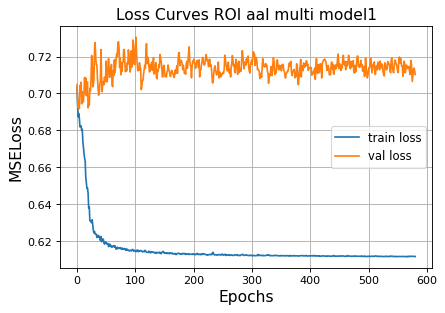

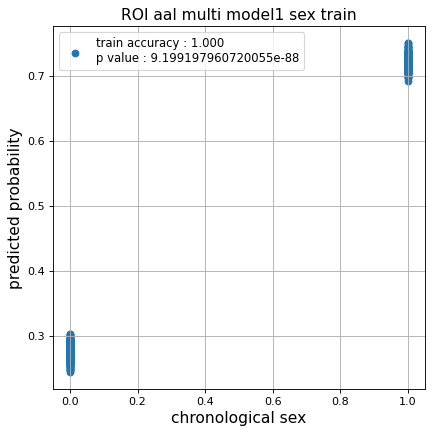

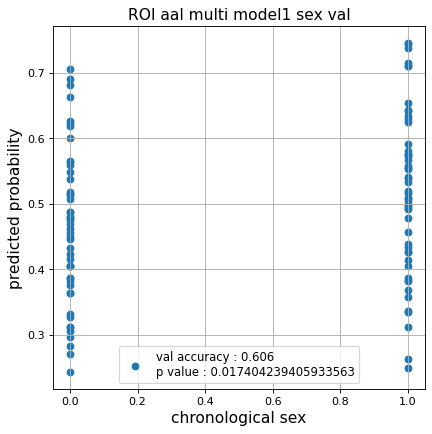

UnboundLocalError: local variable 'test_pred' referenced before assignment

In [16]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_aal_1  = []
test_pred_aal_corrected_1  = []
test_label_aal_1 = []
test_idx_aal_1   = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_aal)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_corrected,test_label= train_model(data_aal,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 1000,
                                                           d_model    = 256,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 1024,
                                                           nhead      = 32,
                                                           hidden_dim_transformer = 2,
                                                           pos_drop    = 0.1,
                                                           trans_drop = 0.2,
                                                           fc_drop = 0.1,
                                                           title = 'ROI aal multi model1'
                                                          )
    
    test_pred_aal_1.append(test_pred)
    test_pred_aal_corrected_1.append(test_pred_corrected)
    test_label_aal_1.append(test_label)
    test_idx_aal_1.append(test_idx)

### ROI 2

In [ ]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_aal_2  = []
test_pred_aal_corrected_2  = []
test_label_aal_2 = []
test_idx_aal_2   = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_aal)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_corrected,test_label= train_model(data_aal,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 1000,
                                                           d_model    = 128,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 128,
                                                           nhead      = 32,
                                                           hidden_dim_transformer = 2,
                                                           pos_drop    = 0.1,
                                                           trans_drop = 0.1,
                                                           fc_drop = 0.1,
                                                           title = 'ROI aal multi model2'
                                                          )
    
    test_pred_aal_2.append(test_pred)
    test_pred_aal_corrected_2.append(test_pred_corrected)
    test_label_aal_2.append(test_label)
    test_idx_aal_2.append(test_idx)

Nested Kfold ::: 1
Let's use 4 GPUs!
Kfold: 1 ::: epoch: 100, loss: 0.6164409472392156, val loss: 0.6868209540843964
Kfold: 1 ::: epoch: 200, loss: 0.6136696155254657, val loss: 0.6860061883926392
Kfold: 1 ::: epoch: 300, loss: 0.6130496446902935, val loss: 0.6864155828952789
Kfold: 1 ::: epoch: 400, loss: 0.6125876811834482, val loss: 0.6860079765319824


### データ保存

In [ ]:
test_pred_aal_1 = np.array(test_pred_aal_1, dtype=object)
test_pred_aal_corrected_1 = np.array(test_pred_aal_corrected_1, dtype=object)

test_pred_aal_2 = np.array(test_pred_aal_2, dtype=object)
test_pred_aal_corrected_2 = np.array(test_pred_aal_corrected_2, dtype=object)

In [ ]:
np.savez('../02_data_analysis/temp/aal_sex_1',
         test_pred_aal_1,
         test_pred_aal_corrected_1,
         test_label_aal_1,
         test_idx_aal_1)
np.savez('../02_data_analysis/temp/aal_sex_2',
         test_pred_aal_2,
         test_pred_aal_corrected_2,
         test_label_aal_2,
         test_idx_aal_2)

### Data定義(dynamic FC)

In [ ]:
%%time
df_dynamic_aal = pd.read_csv('../02_data_analysis/dynamic_FC/dynamic_aal.csv')
data_dynamic_aal = make_data(df_dynamic_aal)
print(data_dynamic_aal.shape)

(615, 123, 6670)
CPU times: user 3min 10s, sys: 5.63 s, total: 3min 16s
Wall time: 3min 18s


### Dynamic FC 1

Nested Kfold ::: 1
Kfold: 1 ::: epoch: 100, loss: 0.6150204034952017, val loss: 0.6786162555217743
Kfold: 1 ::: epoch: 200, loss: 0.612870298899137, val loss: 0.6627354919910431
Kfold: 1 ::: epoch: 300, loss: 0.6122201772836539, val loss: 0.6453579515218735
Kfold: 1 ::: epoch: 400, loss: 0.6118245950111976, val loss: 0.630822017788887
Kfold: 1 ::: epoch: 500, loss: 0.6114828724127549, val loss: 0.6198129951953888
Kfold: 1 ::: epoch: 600, loss: 0.6112335645235502, val loss: 0.610714852809906
Kfold: 1 ::: epoch: 700, loss: 0.611175720508282, val loss: 0.6084344685077667
save_epochs:555
best val loss:0.6027672439813614


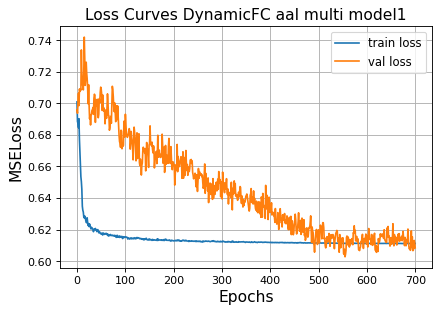

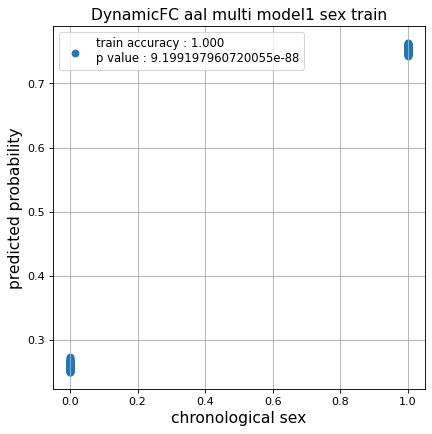

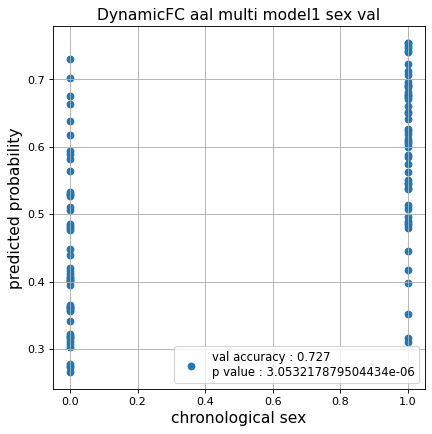

Kfold: 2 ::: epoch: 100, loss: 0.6143821523739741, val loss: 0.5733767971396446
Kfold: 2 ::: epoch: 200, loss: 0.6129097800988418, val loss: 0.577475443482399
Kfold: 2 ::: epoch: 300, loss: 0.6120754067714398, val loss: 0.5737407207489014
Kfold: 2 ::: epoch: 400, loss: 0.6116594397104703, val loss: 0.5715092420578003
Kfold: 2 ::: epoch: 500, loss: 0.6116237365282499, val loss: 0.560244157910347
Kfold: 2 ::: epoch: 600, loss: 0.6112260359984177, val loss: 0.5783548355102539
Kfold: 2 ::: epoch: 700, loss: 0.6112156739601722, val loss: 0.5757267624139786
save_epochs:558
best val loss:0.5575735569000244


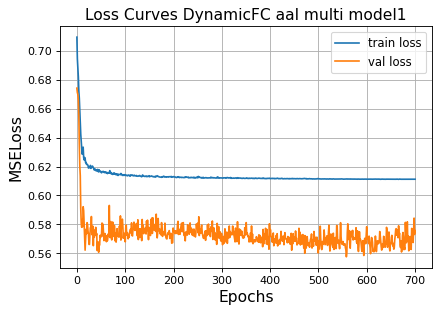

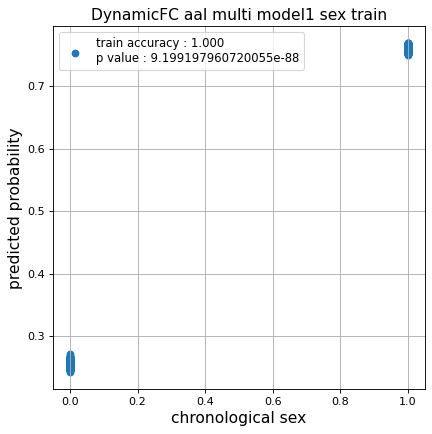

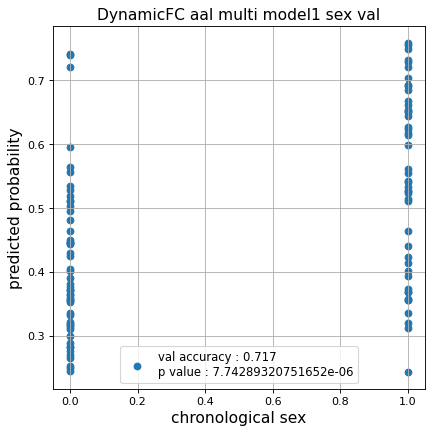

Kfold: 3 ::: epoch: 100, loss: 0.6142593897306002, val loss: 0.6777828484773636
Kfold: 3 ::: epoch: 200, loss: 0.6127631205778855, val loss: 0.6562985181808472
Kfold: 3 ::: epoch: 300, loss: 0.6120189428329468, val loss: 0.6391680538654327
Kfold: 3 ::: epoch: 400, loss: 0.6117697083033048, val loss: 0.6350496560335159
Kfold: 3 ::: epoch: 500, loss: 0.6114198794731727, val loss: 0.6203407198190689
Kfold: 3 ::: epoch: 600, loss: 0.6112740727571341, val loss: 0.5673763155937195
Kfold: 3 ::: epoch: 700, loss: 0.6112165496899531, val loss: 0.5500697568058968
save_epochs:699
best val loss:0.5452876091003418


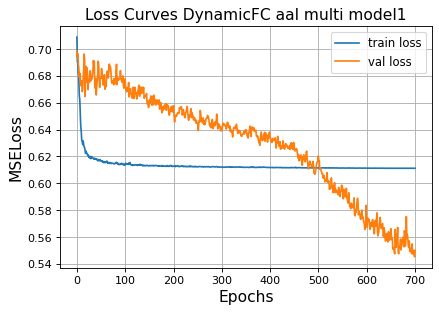

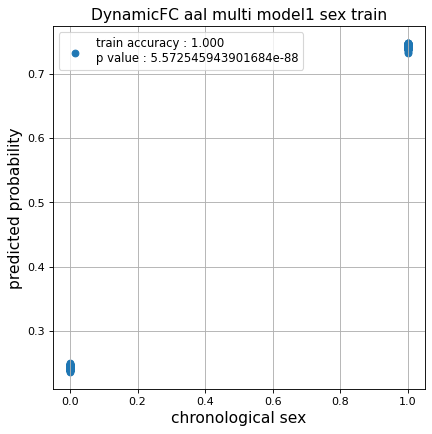

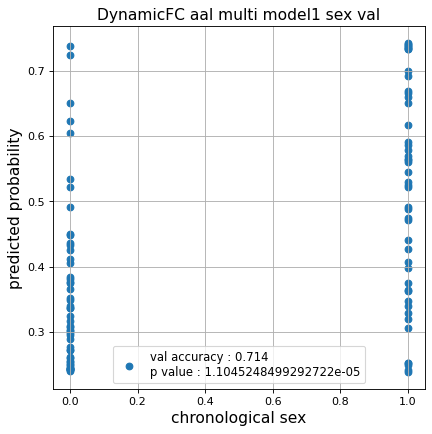

Kfold: 4 ::: epoch: 100, loss: 0.6144439532206609, val loss: 0.5928447991609573
Kfold: 4 ::: epoch: 200, loss: 0.6121930525853083, val loss: 0.5785730257630348
Kfold: 4 ::: epoch: 300, loss: 0.6120532155036926, val loss: 0.5958777815103531
Kfold: 4 ::: epoch: 400, loss: 0.611721566090217, val loss: 0.5802216082811356
early stopping
save_epochs:287
best val loss:0.5647719502449036


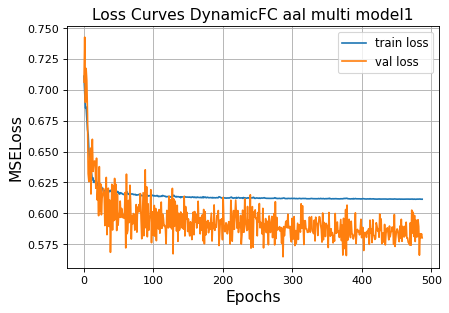

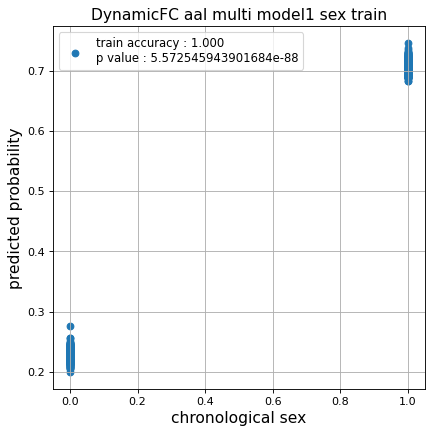

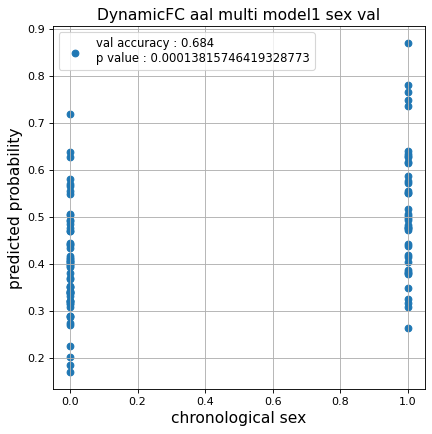

Kfold: 5 ::: epoch: 100, loss: 0.6148675038264348, val loss: 0.5355252251029015
Kfold: 5 ::: epoch: 200, loss: 0.6128363471764785, val loss: 0.5351218804717064
Kfold: 5 ::: epoch: 300, loss: 0.6121533879866967, val loss: 0.5164431557059288
Kfold: 5 ::: epoch: 400, loss: 0.6115141235865079, val loss: 0.5149641185998917
Kfold: 5 ::: epoch: 500, loss: 0.6114136622502253, val loss: 0.5123220905661583
Kfold: 5 ::: epoch: 600, loss: 0.6113108029732337, val loss: 0.5136940032243729
early stopping
save_epochs:477
best val loss:0.5037797316908836


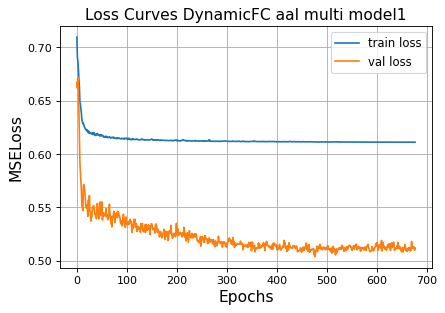

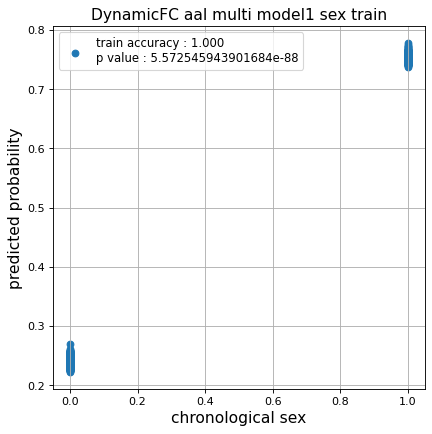

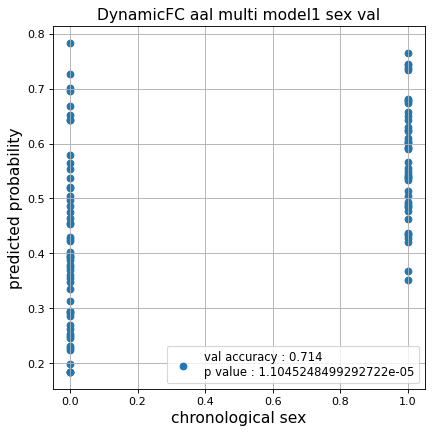

Nested Kfold ::: 2
Kfold: 1 ::: epoch: 100, loss: 0.6151070044590876, val loss: 0.6312205195426941
Kfold: 1 ::: epoch: 200, loss: 0.6129601368537316, val loss: 0.6321887373924255
Kfold: 1 ::: epoch: 300, loss: 0.612208889080928, val loss: 0.6332461982965469
Kfold: 1 ::: epoch: 400, loss: 0.6118444892076346, val loss: 0.6316923946142197
early stopping
save_epochs:265
best val loss:0.6200258731842041


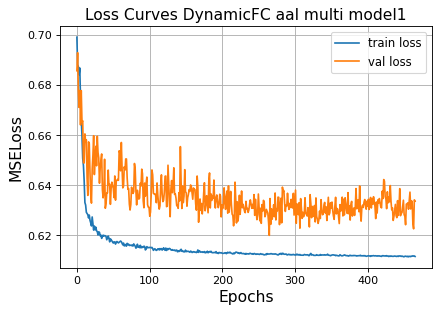

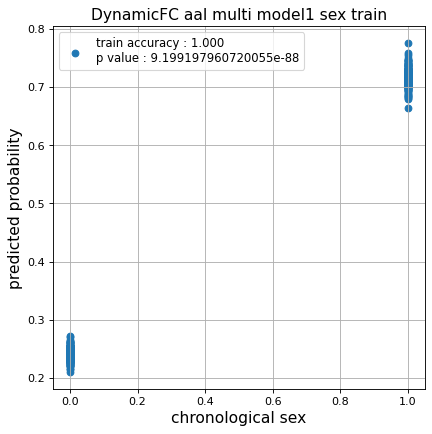

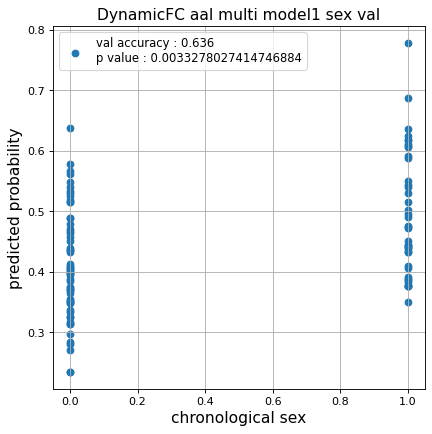

Kfold: 2 ::: epoch: 100, loss: 0.6146402359008789, val loss: 0.6179307401180267
Kfold: 2 ::: epoch: 200, loss: 0.6128741135964026, val loss: 0.6225357800722122
Kfold: 2 ::: epoch: 300, loss: 0.612129651583158, val loss: 0.6198124885559082
Kfold: 2 ::: epoch: 400, loss: 0.612096016223614, val loss: 0.6194795519113541
early stopping
save_epochs:291
best val loss:0.6136337071657181


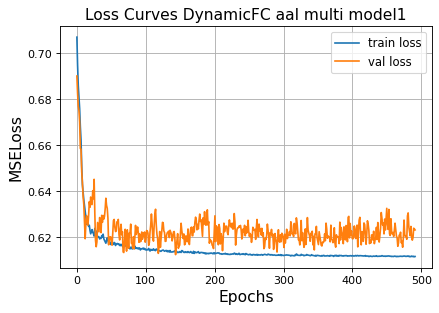

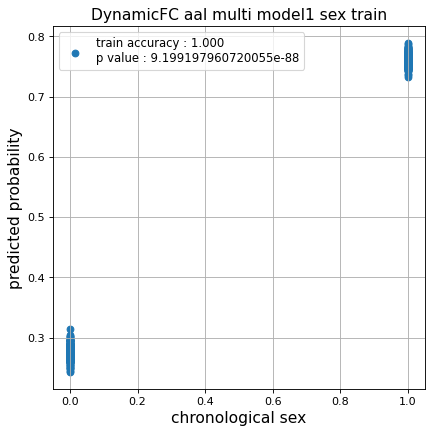

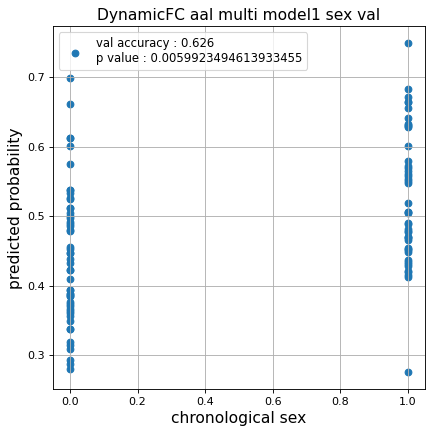

Kfold: 3 ::: epoch: 100, loss: 0.6141438530041621, val loss: 0.6299234926700592
Kfold: 3 ::: epoch: 200, loss: 0.6125663152107825, val loss: 0.60981684923172
Kfold: 3 ::: epoch: 300, loss: 0.6122253032831045, val loss: 0.6044470071792603
Kfold: 3 ::: epoch: 400, loss: 0.6115967035293579, val loss: 0.5809399485588074
Kfold: 3 ::: epoch: 500, loss: 0.6112727981347305, val loss: 0.5679749697446823
Kfold: 3 ::: epoch: 600, loss: 0.6112092962631812, val loss: 0.5607156753540039
Kfold: 3 ::: epoch: 700, loss: 0.6111703973550063, val loss: 0.5547105520963669
save_epochs:667
best val loss:0.5522525161504745


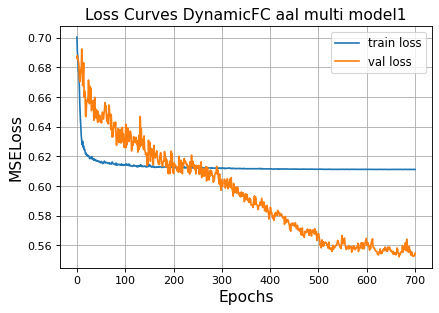

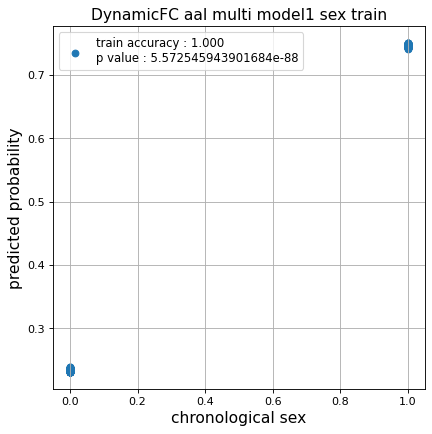

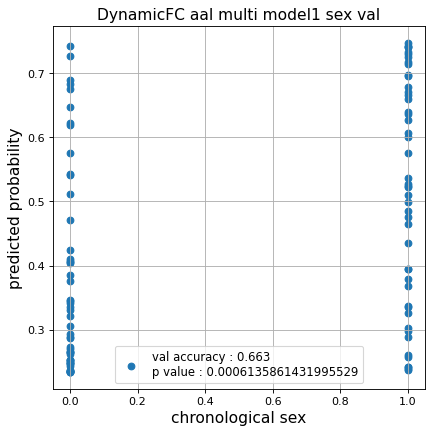

Kfold: 4 ::: epoch: 100, loss: 0.614395811007573, val loss: 0.641983151435852
Kfold: 4 ::: epoch: 200, loss: 0.6128392998988812, val loss: 0.6273122876882553
Kfold: 4 ::: epoch: 300, loss: 0.6119860960887029, val loss: 0.6389687359333038
Kfold: 4 ::: epoch: 400, loss: 0.6116184317148649, val loss: 0.635804757475853
early stopping
save_epochs:262
best val loss:0.6218110769987106


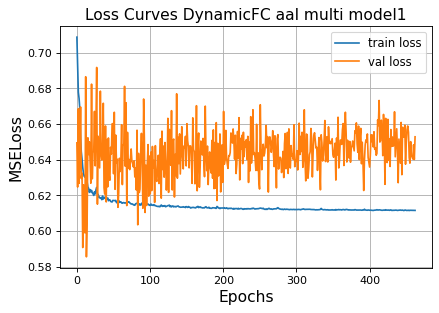

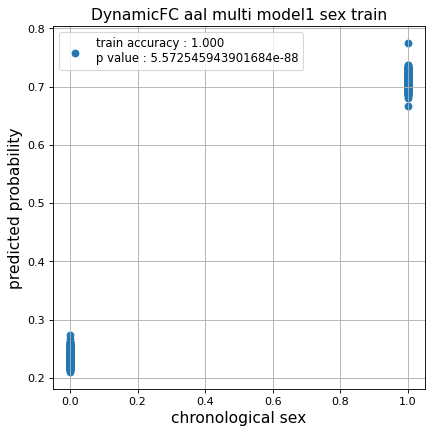

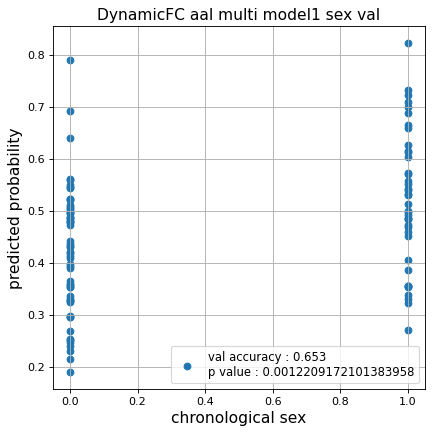

Kfold: 5 ::: epoch: 100, loss: 0.6146768698325524, val loss: 0.6524231880903244
Kfold: 5 ::: epoch: 200, loss: 0.6127441066962022, val loss: 0.6492270529270172
Kfold: 5 ::: epoch: 300, loss: 0.6123303450070895, val loss: 0.6408117711544037
Kfold: 5 ::: epoch: 400, loss: 0.6119089722633362, val loss: 0.6446363776922226
Kfold: 5 ::: epoch: 500, loss: 0.6116401507304265, val loss: 0.6508887857198715
early stopping
save_epochs:316
best val loss:0.6337830871343613


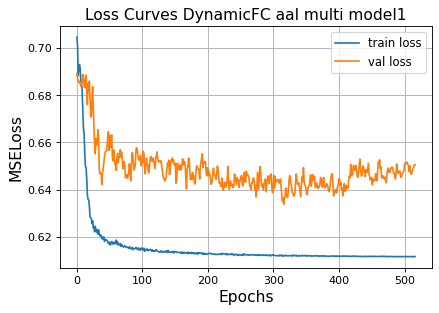

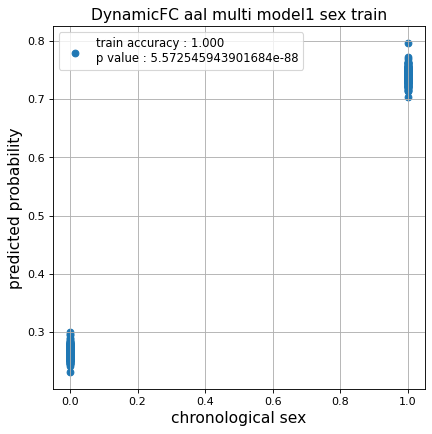

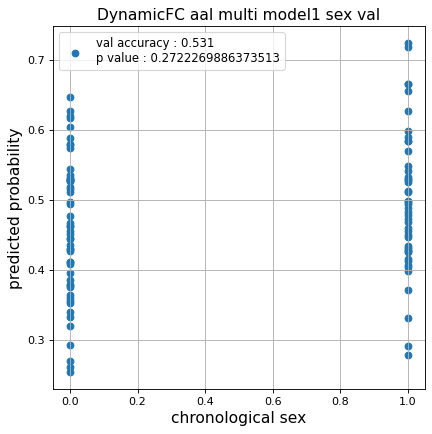

Nested Kfold ::: 3
Kfold: 1 ::: epoch: 100, loss: 0.6150170427102309, val loss: 0.6942152082920074
Kfold: 1 ::: epoch: 200, loss: 0.6134543877381545, val loss: 0.6955245733261108
Kfold: 1 ::: epoch: 300, loss: 0.6123347970155569, val loss: 0.6843485832214355
Kfold: 1 ::: epoch: 400, loss: 0.6120593456121591, val loss: 0.6828859597444534
Kfold: 1 ::: epoch: 500, loss: 0.6115842599135178, val loss: 0.6607940644025803
Kfold: 1 ::: epoch: 600, loss: 0.611384602693411, val loss: 0.6615913659334183
Kfold: 1 ::: epoch: 700, loss: 0.6112454579426692, val loss: 0.6659452766180038
save_epochs:680
best val loss:0.6451845020055771


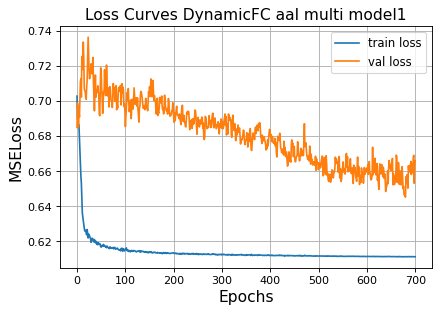

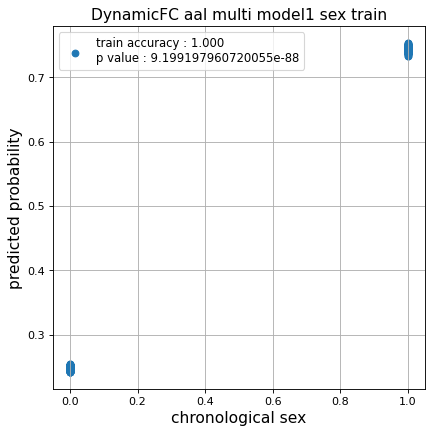

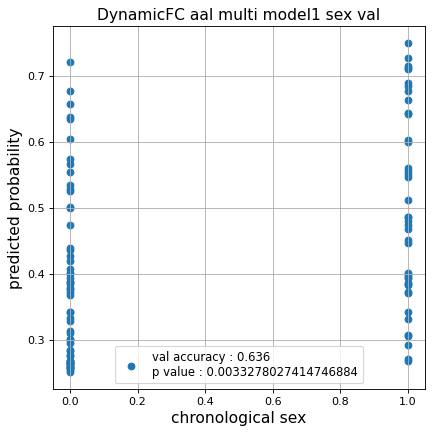

Kfold: 2 ::: epoch: 100, loss: 0.6145631212454575, val loss: 0.5881800353527069
Kfold: 2 ::: epoch: 200, loss: 0.612892536016611, val loss: 0.5743944942951202
Kfold: 2 ::: epoch: 300, loss: 0.612138555600093, val loss: 0.5732711553573608
Kfold: 2 ::: epoch: 400, loss: 0.6115851814930255, val loss: 0.5607224702835083
Kfold: 2 ::: epoch: 500, loss: 0.6114795207977295, val loss: 0.5444875285029411
Kfold: 2 ::: epoch: 600, loss: 0.611208425118373, val loss: 0.5319002717733383
Kfold: 2 ::: epoch: 700, loss: 0.6111997549350445, val loss: 0.536451019346714
save_epochs:692
best val loss:0.5134578198194504


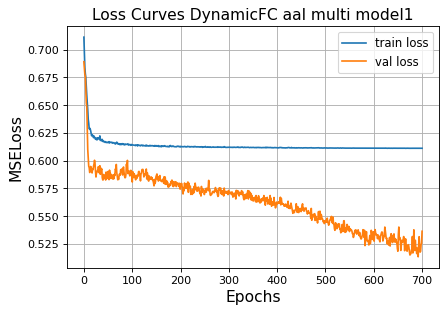

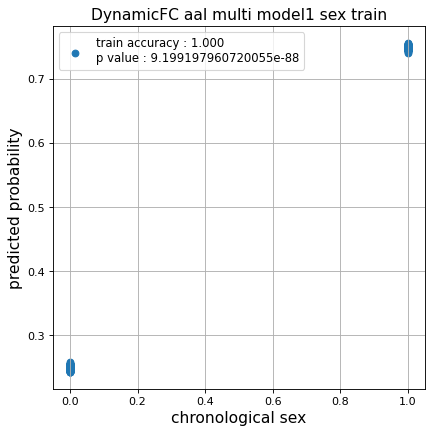

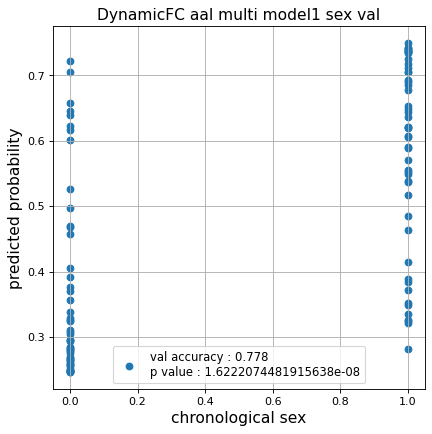

Kfold: 3 ::: epoch: 100, loss: 0.6145417002531198, val loss: 0.6481157839298248
Kfold: 3 ::: epoch: 200, loss: 0.612654658464285, val loss: 0.6489337086677551
Kfold: 3 ::: epoch: 300, loss: 0.6121664643287659, val loss: 0.6364501118659973
Kfold: 3 ::: epoch: 400, loss: 0.6116429613186762, val loss: 0.6395024508237839
Kfold: 3 ::: epoch: 500, loss: 0.6113784083953271, val loss: 0.635855033993721
Kfold: 3 ::: epoch: 600, loss: 0.6112345457077026, val loss: 0.6196302324533463
Kfold: 3 ::: epoch: 700, loss: 0.6112023637844965, val loss: 0.6193449348211288
save_epochs:654
best val loss:0.6082476079463959


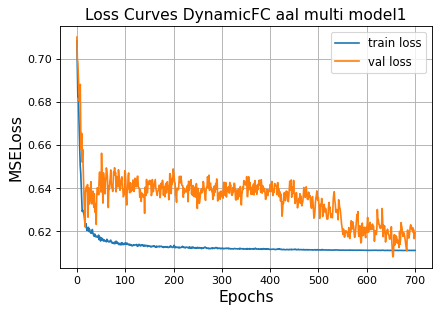

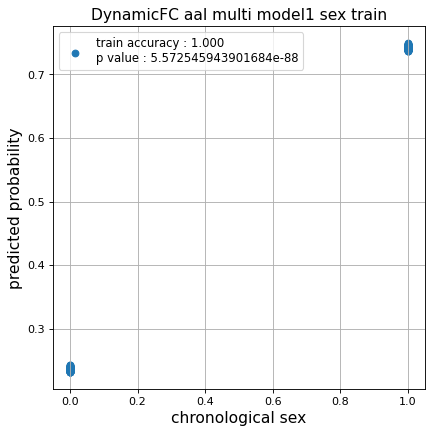

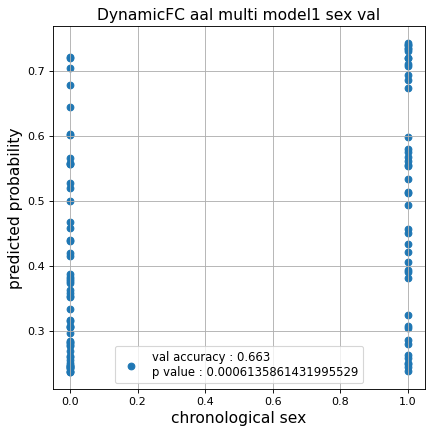

Kfold: 4 ::: epoch: 100, loss: 0.6137014031410217, val loss: 0.640103280544281
Kfold: 4 ::: epoch: 200, loss: 0.6125025199009821, val loss: 0.6407665908336639
Kfold: 4 ::: epoch: 300, loss: 0.6119430523652297, val loss: 0.636511892080307
Kfold: 4 ::: epoch: 400, loss: 0.6116875180831323, val loss: 0.6249466836452484
early stopping
save_epochs:211
best val loss:0.6148335635662079


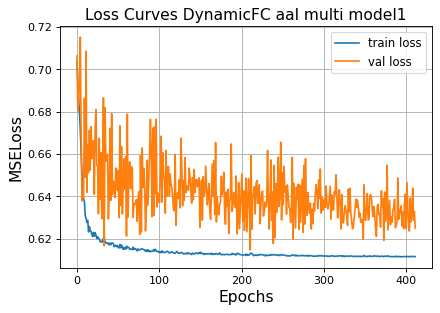

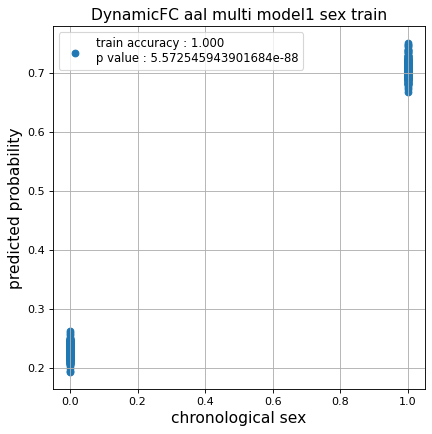

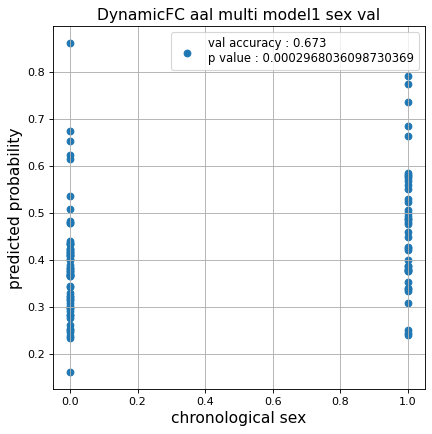

Kfold: 5 ::: epoch: 100, loss: 0.6146695705560538, val loss: 0.5077726617455482
Kfold: 5 ::: epoch: 200, loss: 0.6124686644627497, val loss: 0.4992767348885536
Kfold: 5 ::: epoch: 300, loss: 0.6119471650857192, val loss: 0.49587445706129074
Kfold: 5 ::: epoch: 400, loss: 0.6118036050062913, val loss: 0.4954925999045372
Kfold: 5 ::: epoch: 500, loss: 0.6114141803521377, val loss: 0.49055274575948715
Kfold: 5 ::: epoch: 600, loss: 0.6111931158946111, val loss: 0.4815492630004883
Kfold: 5 ::: epoch: 700, loss: 0.6112613448729882, val loss: 0.4752369374036789
save_epochs:696
best val loss:0.47465232014656067


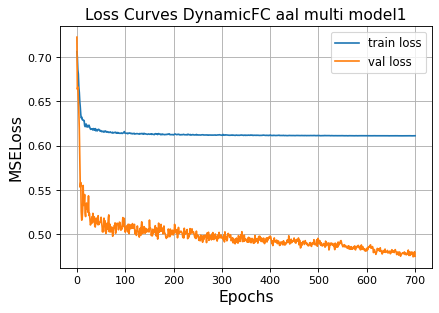

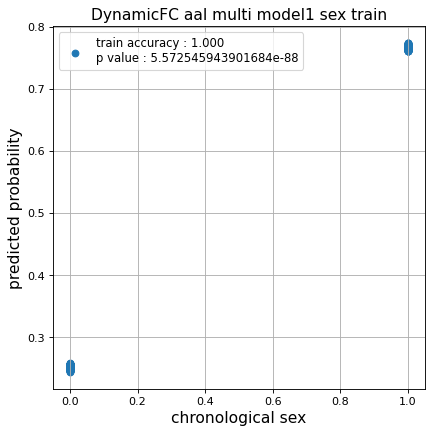

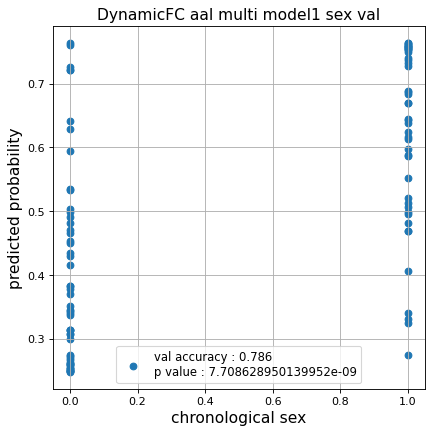

Nested Kfold ::: 4
Kfold: 1 ::: epoch: 100, loss: 0.6148716532267057, val loss: 0.6779100894927979
Kfold: 1 ::: epoch: 200, loss: 0.6133984006368197, val loss: 0.6617576479911804
Kfold: 1 ::: epoch: 300, loss: 0.6123119821915259, val loss: 0.6661981046199799
Kfold: 1 ::: epoch: 400, loss: 0.6118609584294833, val loss: 0.6682804673910141
Kfold: 1 ::: epoch: 500, loss: 0.6114413692401006, val loss: 0.6594278812408447
early stopping
save_epochs:377
best val loss:0.6530132442712784


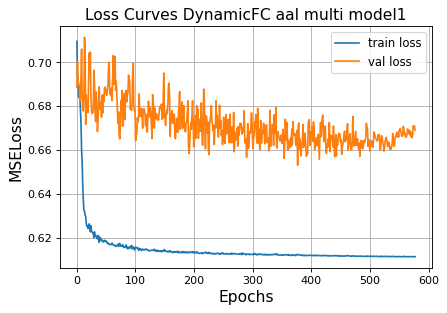

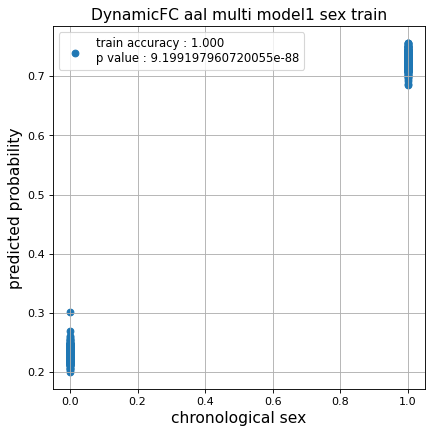

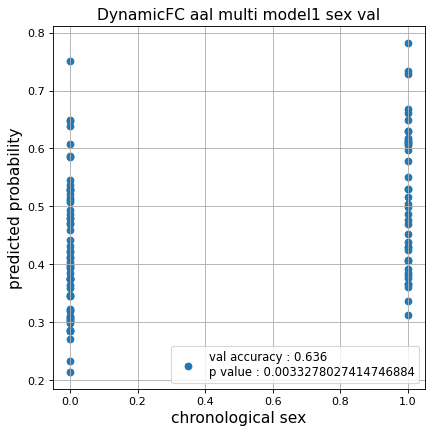

Kfold: 2 ::: epoch: 100, loss: 0.6142472212131207, val loss: 0.7150506973266602
Kfold: 2 ::: epoch: 200, loss: 0.6128318768281203, val loss: 0.709492489695549
Kfold: 2 ::: epoch: 300, loss: 0.6121669778457055, val loss: 0.708075612783432
Kfold: 2 ::: epoch: 400, loss: 0.6116472070033734, val loss: 0.7136994898319244
Kfold: 2 ::: epoch: 500, loss: 0.6116069646982046, val loss: 0.7106669545173645
Kfold: 2 ::: epoch: 600, loss: 0.6115976067689749, val loss: 0.7020963281393051
Kfold: 2 ::: epoch: 700, loss: 0.6114260233365573, val loss: 0.7096572369337082
save_epochs:631
best val loss:0.691824734210968


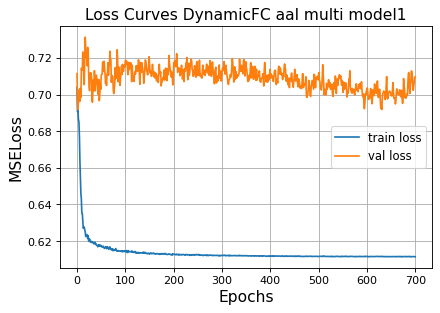

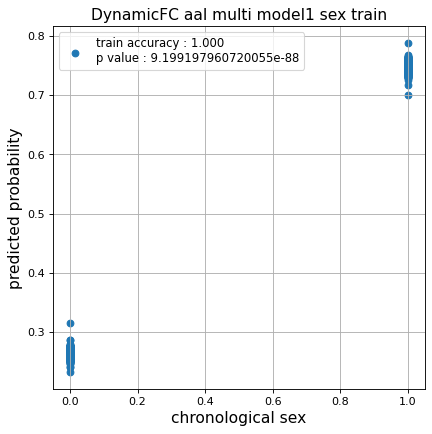

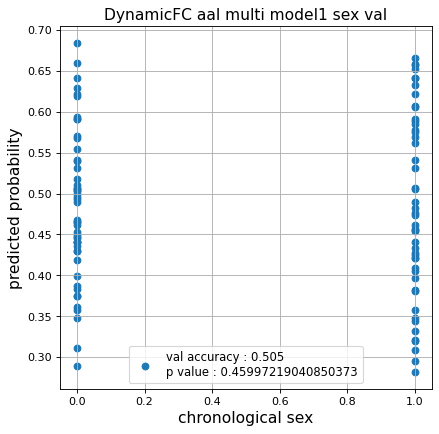

Kfold: 3 ::: epoch: 100, loss: 0.6141467598768381, val loss: 0.5658539608120918
Kfold: 3 ::: epoch: 200, loss: 0.6124206873086783, val loss: 0.5669188052415848
Kfold: 3 ::: epoch: 300, loss: 0.6120696205359238, val loss: 0.5665344744920731
Kfold: 3 ::: epoch: 400, loss: 0.611840009689331, val loss: 0.5497467294335365
Kfold: 3 ::: epoch: 500, loss: 0.6113926218106196, val loss: 0.5405153259634972
Kfold: 3 ::: epoch: 600, loss: 0.6112401806391202, val loss: 0.5416936948895454
Kfold: 3 ::: epoch: 700, loss: 0.6112005848150986, val loss: 0.5403692051768303
save_epochs:638
best val loss:0.5317856073379517


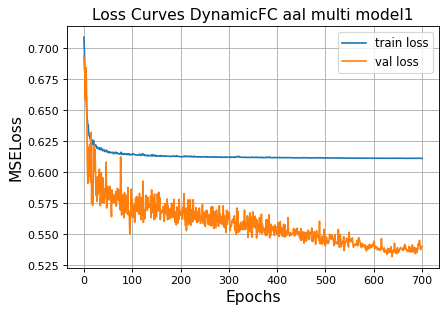

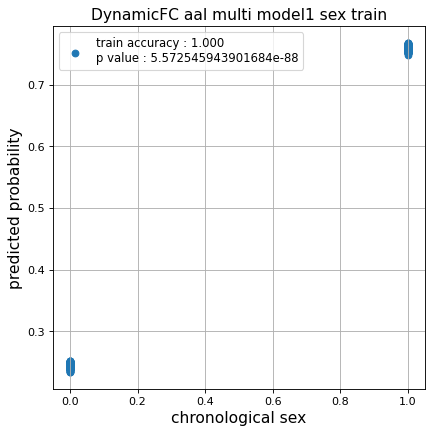

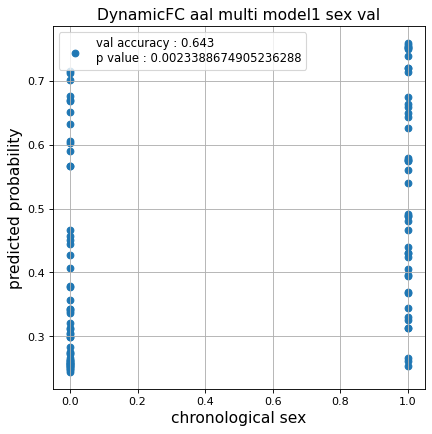

Kfold: 4 ::: epoch: 100, loss: 0.6145211870853717, val loss: 0.5951410531997681
Kfold: 4 ::: epoch: 200, loss: 0.6125928163528442, val loss: 0.571154847741127
Kfold: 4 ::: epoch: 300, loss: 0.6121048422960135, val loss: 0.5849074274301529
Kfold: 4 ::: epoch: 400, loss: 0.6117195807970487, val loss: 0.5770406723022461
early stopping
save_epochs:247
best val loss:0.5702472031116486


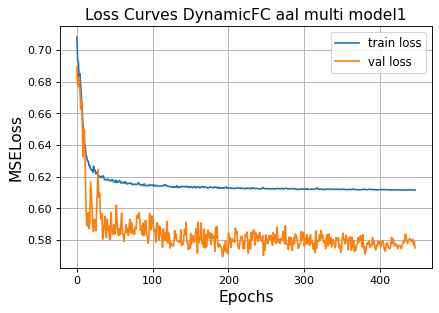

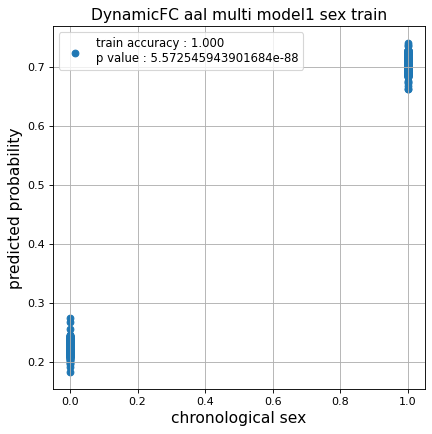

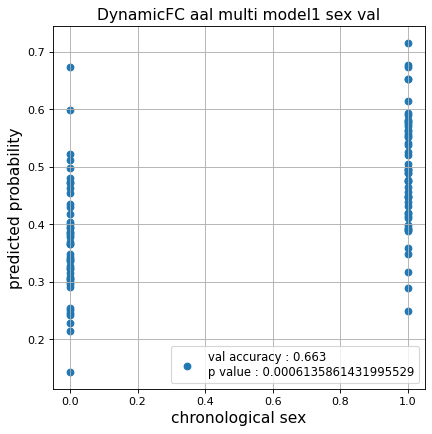

Kfold: 5 ::: epoch: 100, loss: 0.6142074328202468, val loss: 0.6883995980024338
Kfold: 5 ::: epoch: 200, loss: 0.6127234468093286, val loss: 0.6801063418388367
Kfold: 5 ::: epoch: 300, loss: 0.6121938182757451, val loss: 0.6826917976140976
Kfold: 5 ::: epoch: 400, loss: 0.6118113352702215, val loss: 0.673963338136673
Kfold: 5 ::: epoch: 500, loss: 0.6117211259328402, val loss: 0.6784575283527374
Kfold: 5 ::: epoch: 600, loss: 0.6116223151867206, val loss: 0.6888998746871948
early stopping
save_epochs:418
best val loss:0.6647868305444717


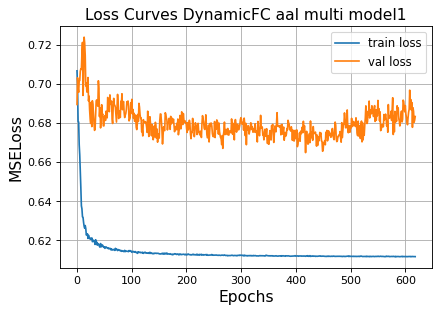

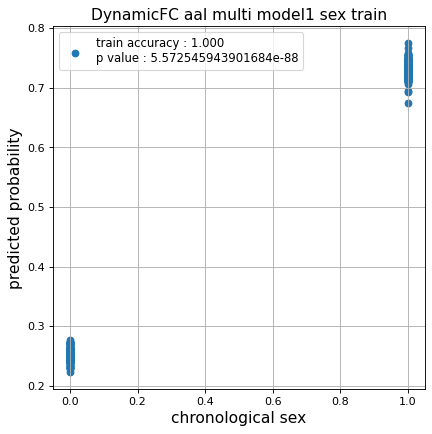

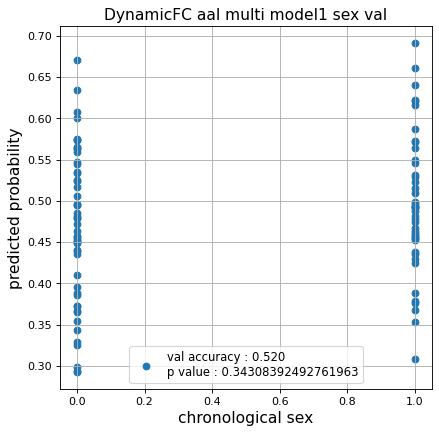

Nested Kfold ::: 5
Kfold: 1 ::: epoch: 100, loss: 0.615080503317026, val loss: 0.6332864612340927
Kfold: 1 ::: epoch: 200, loss: 0.6129064238988436, val loss: 0.6403134018182755
Kfold: 1 ::: epoch: 300, loss: 0.6122423089467562, val loss: 0.644028827548027
Kfold: 1 ::: epoch: 400, loss: 0.6116766104331384, val loss: 0.649463951587677
early stopping
save_epochs:290
best val loss:0.6310392022132874


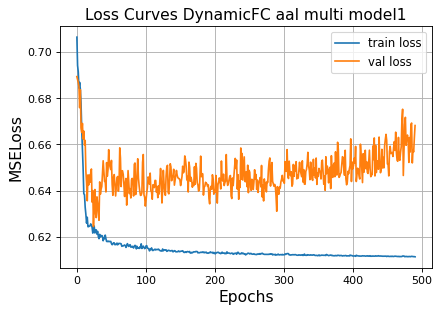

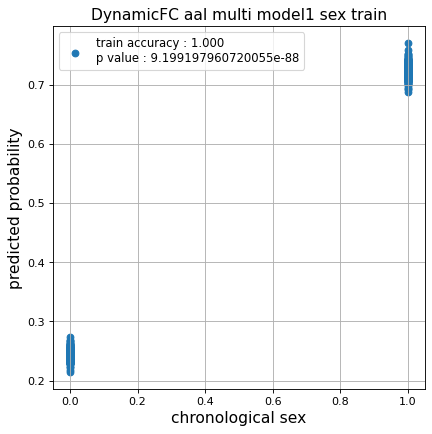

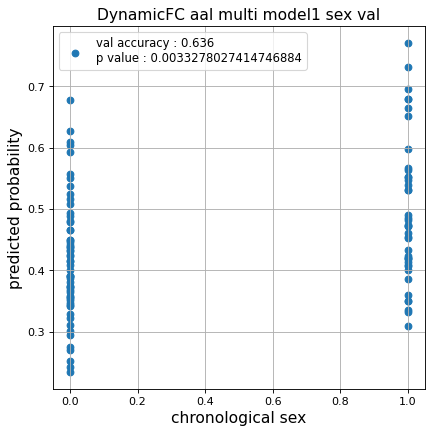

Kfold: 2 ::: epoch: 100, loss: 0.614715154354389, val loss: 0.5757808834314346
Kfold: 2 ::: epoch: 200, loss: 0.6128288461611822, val loss: 0.5655834376811981
Kfold: 2 ::: epoch: 300, loss: 0.6120942143293527, val loss: 0.5565522536635399
Kfold: 2 ::: epoch: 400, loss: 0.6115105748176575, val loss: 0.5468684509396553
Kfold: 2 ::: epoch: 500, loss: 0.6113132375937241, val loss: 0.5362851321697235
Kfold: 2 ::: epoch: 600, loss: 0.6112405841167157, val loss: 0.5287005379796028
Kfold: 2 ::: epoch: 700, loss: 0.6111493339905372, val loss: 0.522292360663414
save_epochs:700
best val loss:0.522292360663414


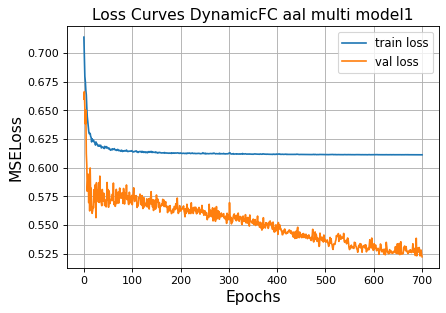

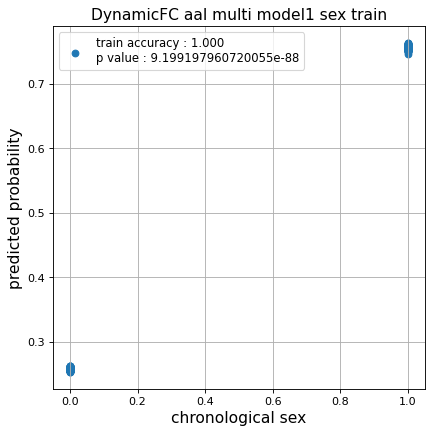

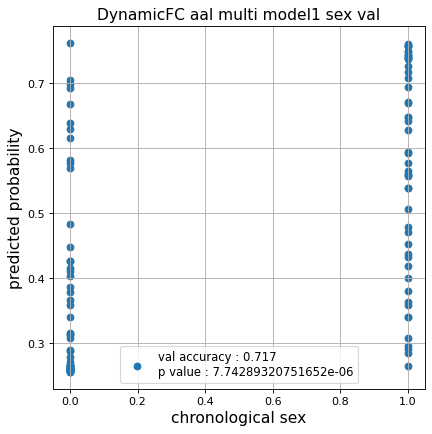

Kfold: 3 ::: epoch: 100, loss: 0.6149724309261029, val loss: 0.6549509167671204
Kfold: 3 ::: epoch: 200, loss: 0.6135465365189773, val loss: 0.627897784113884
Kfold: 3 ::: epoch: 300, loss: 0.6123367135341351, val loss: 0.6114140003919601
Kfold: 3 ::: epoch: 400, loss: 0.6117347066219037, val loss: 0.6048254519701004
Kfold: 3 ::: epoch: 500, loss: 0.6114749495799725, val loss: 0.5617013424634933
Kfold: 3 ::: epoch: 600, loss: 0.6112292179694543, val loss: 0.5642216578125954
Kfold: 3 ::: epoch: 700, loss: 0.6111931800842285, val loss: 0.5612893998622894
save_epochs:639
best val loss:0.5460802465677261


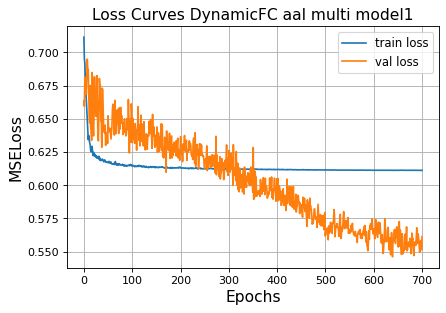

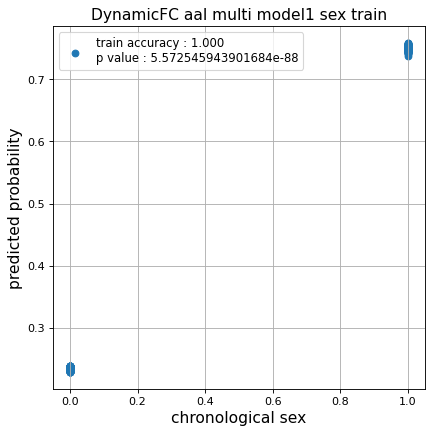

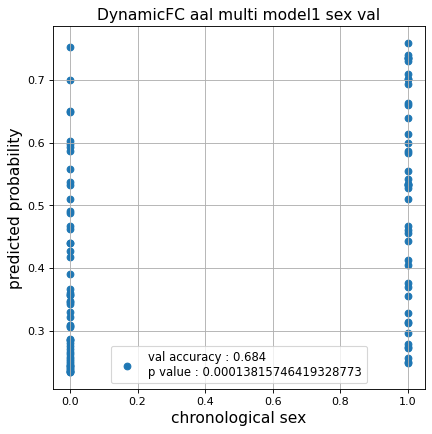

Kfold: 4 ::: epoch: 100, loss: 0.614550925218142, val loss: 0.6289042681455612
Kfold: 4 ::: epoch: 200, loss: 0.6126827093271109, val loss: 0.6057987213134766
Kfold: 4 ::: epoch: 300, loss: 0.6124194814608648, val loss: 0.5957442373037338
Kfold: 4 ::: epoch: 400, loss: 0.6117201951833872, val loss: 0.579431563615799
Kfold: 4 ::: epoch: 500, loss: 0.6116271706727835, val loss: 0.5988255441188812
Kfold: 4 ::: epoch: 600, loss: 0.6113423338303199, val loss: 0.5684131160378456
Kfold: 4 ::: epoch: 700, loss: 0.6112586305691645, val loss: 0.5891440510749817
save_epochs:614
best val loss:0.5609536170959473


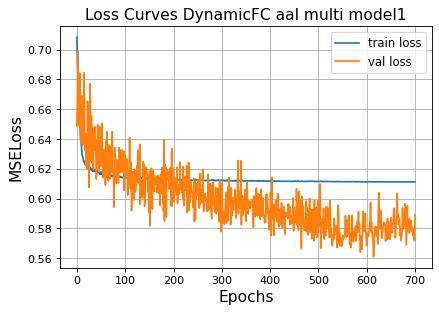

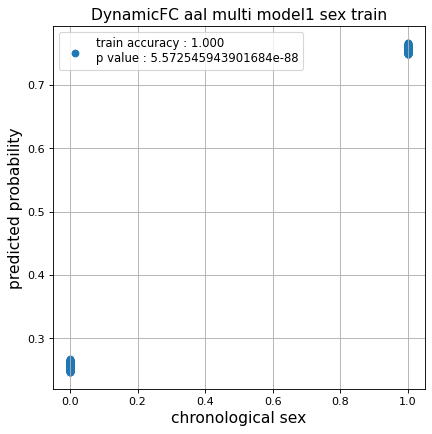

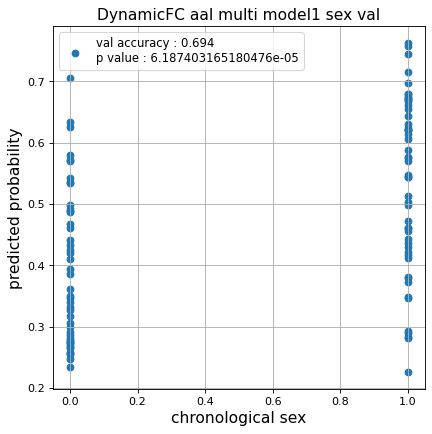

Kfold: 5 ::: epoch: 100, loss: 0.6145768257287832, val loss: 0.6020257771015167
Kfold: 5 ::: epoch: 200, loss: 0.6134588076518133, val loss: 0.602597564458847
Kfold: 5 ::: epoch: 300, loss: 0.6120801797279944, val loss: 0.6031508892774582
Kfold: 5 ::: epoch: 400, loss: 0.6117311395131625, val loss: 0.599544420838356
Kfold: 5 ::: epoch: 500, loss: 0.6115056230471685, val loss: 0.5883939564228058
Kfold: 5 ::: epoch: 600, loss: 0.6113624160106366, val loss: 0.5892201960086823
Kfold: 5 ::: epoch: 700, loss: 0.6112312307724586, val loss: 0.591265395283699
save_epochs:680
best val loss:0.5832677632570267


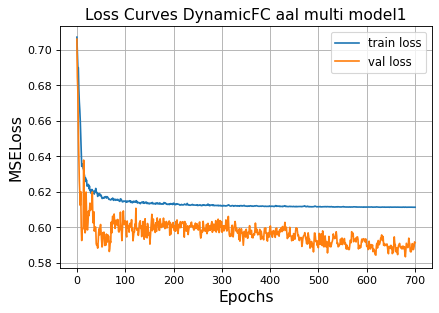

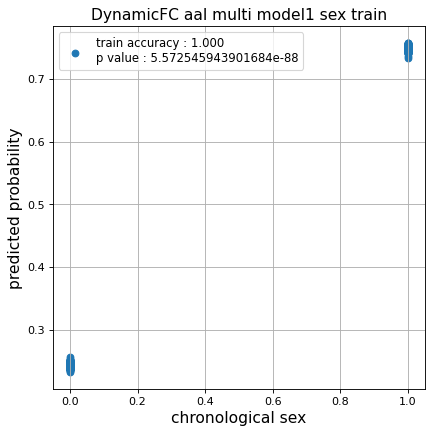

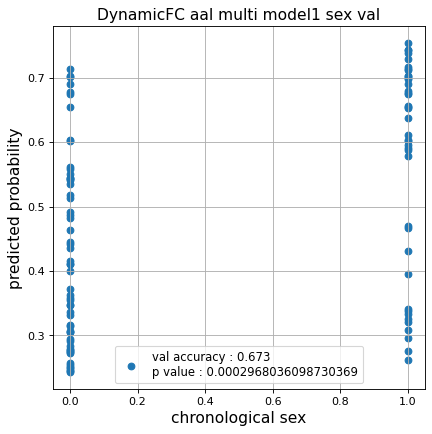

CPU times: user 1d 1h 50min 27s, sys: 1min 38s, total: 1d 1h 52min 5s
Wall time: 3h 44min 3s


In [ ]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_aal_dynamic_1  = []
test_pred_aal_dynamic_corrected_1  = []
test_label_aal_dynamic_1 = []
test_idx_aal_dynamic_1   = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_aal)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_corrected,test_label = train_model(data_dynamic_aal,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 700,
                                                           d_model    = 64,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 256,
                                                           nhead      = 2,#4
                                                           hidden_dim_transformer = 1,#2
                                                           pos_drop   = 0.3,
                                                           trans_drop = 0.5,
                                                           fc_drop = 0.3,
                                                           title = 'DynamicFC aal multi model1'
                                                          )
    
    test_pred_aal_dynamic_1.append(test_pred)
    test_pred_aal_dynamic_corrected_1.append(test_pred_corrected)
    test_label_aal_dynamic_1.append(test_label)
    test_idx_aal_dynamic_1.append(test_idx)

### Dynamic FC 2

Nested Kfold ::: 1
Kfold: 1 ::: epoch: 100, loss: 0.6154749851960403, val loss: 0.6651780158281326
Kfold: 1 ::: epoch: 200, loss: 0.6129783391952515, val loss: 0.6439483761787415
Kfold: 1 ::: epoch: 300, loss: 0.6121054933621333, val loss: 0.6206452399492264
Kfold: 1 ::: epoch: 400, loss: 0.6117999003483698, val loss: 0.6099497973918915
Kfold: 1 ::: epoch: 500, loss: 0.611356244637416, val loss: 0.594740241765976
Kfold: 1 ::: epoch: 600, loss: 0.6112127258227422, val loss: 0.593643307685852
Kfold: 1 ::: epoch: 700, loss: 0.6111617592664865, val loss: 0.5949279218912125
save_epochs:555
best val loss:0.583633653819561


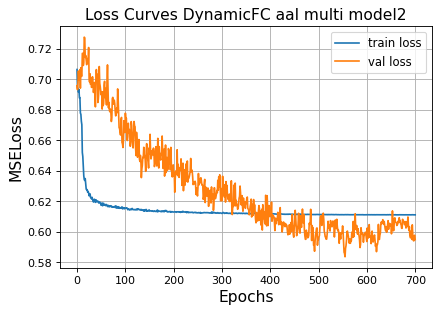

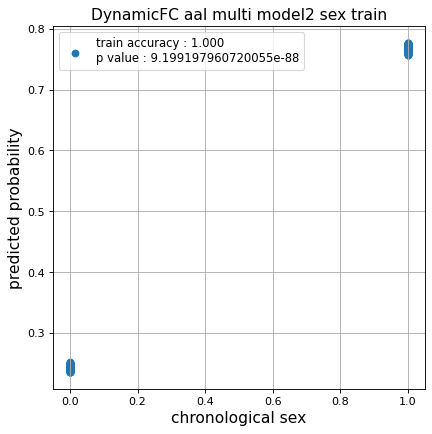

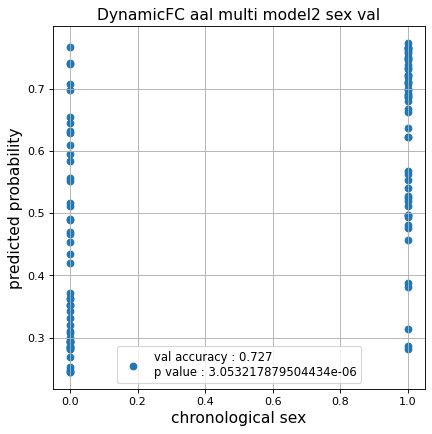

Kfold: 2 ::: epoch: 100, loss: 0.6142806227390583, val loss: 0.5565292239189148
Kfold: 2 ::: epoch: 200, loss: 0.6128818851250869, val loss: 0.5614418089389801
Kfold: 2 ::: epoch: 300, loss: 0.6119843996488131, val loss: 0.5540929064154625
Kfold: 2 ::: epoch: 400, loss: 0.6118556261062622, val loss: 0.5511006712913513
Kfold: 2 ::: epoch: 500, loss: 0.6114370547808133, val loss: 0.5458439067006111
Kfold: 2 ::: epoch: 600, loss: 0.6111935422970698, val loss: 0.5529521256685257
Kfold: 2 ::: epoch: 700, loss: 0.6112043399077195, val loss: 0.5536331310868263
save_epochs:689
best val loss:0.5346953868865967


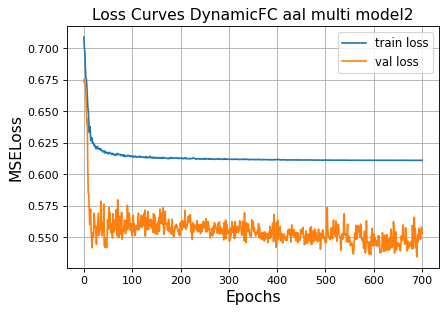

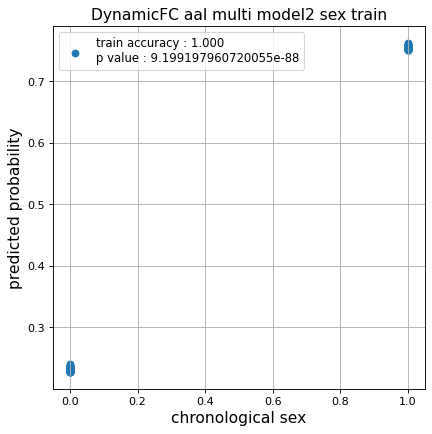

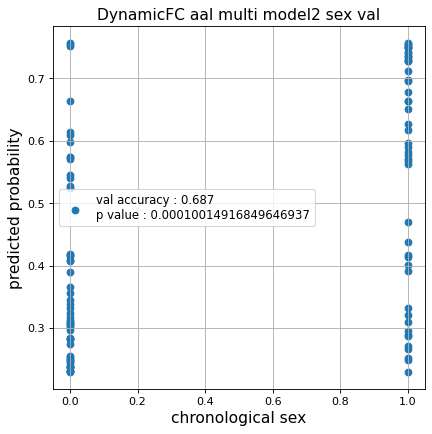

Kfold: 3 ::: epoch: 100, loss: 0.614608645439148, val loss: 0.6589856743812561
Kfold: 3 ::: epoch: 200, loss: 0.612882504096398, val loss: 0.6351334154605865
Kfold: 3 ::: epoch: 300, loss: 0.612076800603133, val loss: 0.6179378181695938
Kfold: 3 ::: epoch: 400, loss: 0.6116002339583176, val loss: 0.608672022819519
Kfold: 3 ::: epoch: 500, loss: 0.6112812207295344, val loss: 0.601204052567482
Kfold: 3 ::: epoch: 600, loss: 0.6112217398790213, val loss: 0.5420223772525787
Kfold: 3 ::: epoch: 700, loss: 0.6112032303443322, val loss: 0.5412340313196182
save_epochs:658
best val loss:0.533478856086731


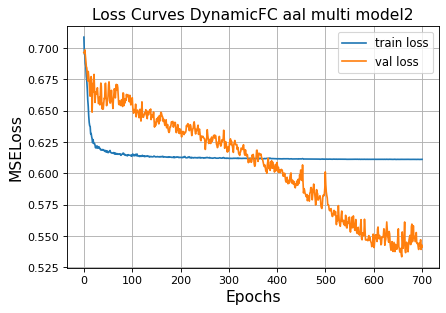

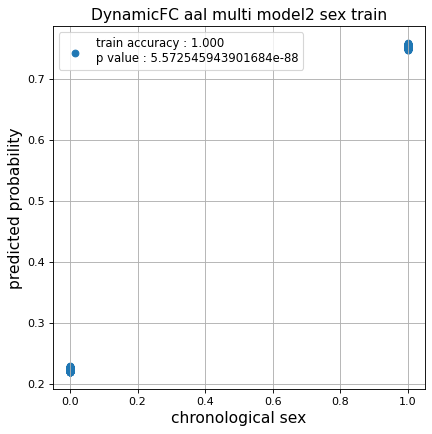

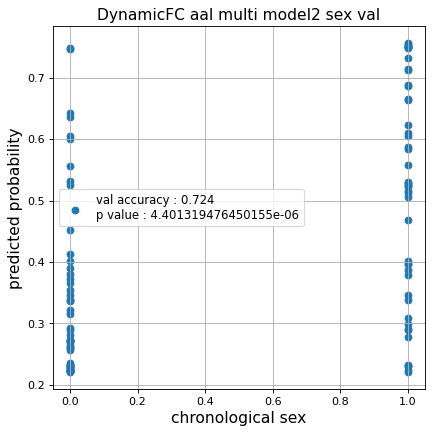

Kfold: 4 ::: epoch: 100, loss: 0.6149151737873371, val loss: 0.5799725502729416
Kfold: 4 ::: epoch: 200, loss: 0.6124216043032132, val loss: 0.5697576701641083
Kfold: 4 ::: epoch: 300, loss: 0.6121366528364328, val loss: 0.5885059386491776
Kfold: 4 ::: epoch: 400, loss: 0.6116538368738614, val loss: 0.5702520906925201
Kfold: 4 ::: epoch: 500, loss: 0.611383318901062, val loss: 0.5758640617132187
Kfold: 4 ::: epoch: 600, loss: 0.6112443804740906, val loss: 0.5755691379308701
Kfold: 4 ::: epoch: 700, loss: 0.6111557346123916, val loss: 0.5560382679104805
save_epochs:638
best val loss:0.5379763394594193


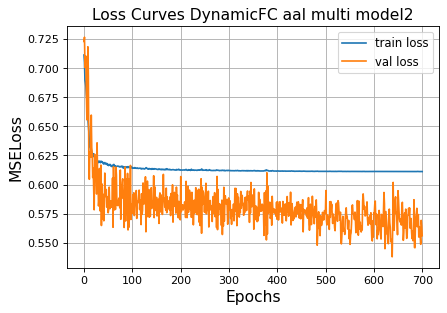

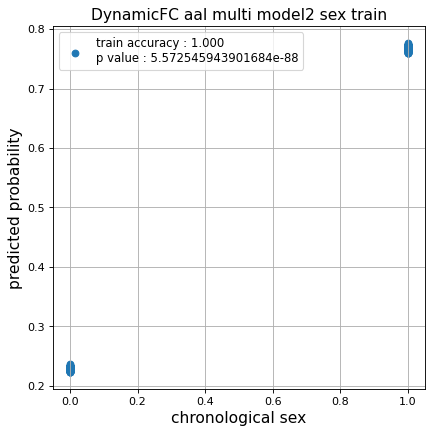

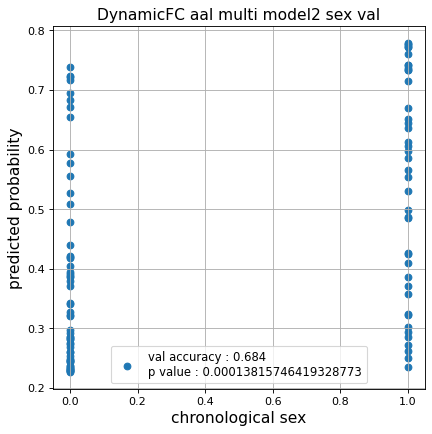

Kfold: 5 ::: epoch: 100, loss: 0.6151305712186373, val loss: 0.6734971106052399
Kfold: 5 ::: epoch: 200, loss: 0.6132022463358365, val loss: 0.6556767895817757
Kfold: 5 ::: epoch: 300, loss: 0.6124170560103196, val loss: 0.6399635970592499
Kfold: 5 ::: epoch: 400, loss: 0.6120709731028631, val loss: 0.6315734088420868
Kfold: 5 ::: epoch: 500, loss: 0.6117821335792542, val loss: 0.6190190315246582
Kfold: 5 ::: epoch: 600, loss: 0.6117698412675124, val loss: 0.6096058115363121
Kfold: 5 ::: epoch: 700, loss: 0.611611545085907, val loss: 0.5956175774335861
save_epochs:696
best val loss:0.593888446688652


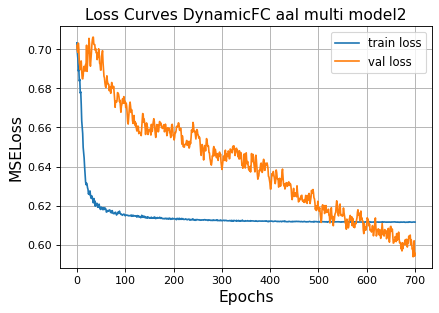

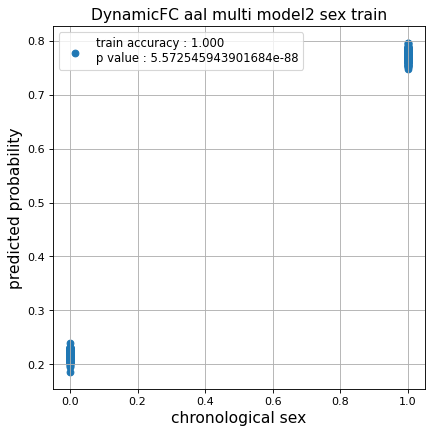

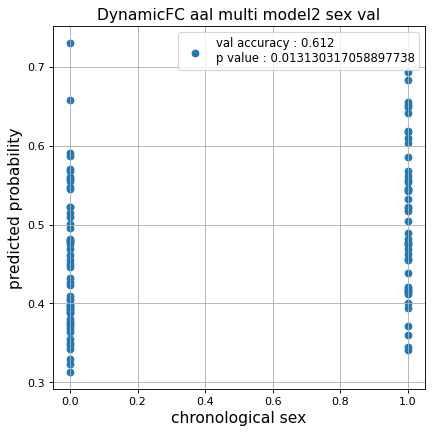

Nested Kfold ::: 2
Kfold: 1 ::: epoch: 100, loss: 0.6155747908812302, val loss: 0.6174470037221909
Kfold: 1 ::: epoch: 200, loss: 0.6131185980943533, val loss: 0.6156235039234161
Kfold: 1 ::: epoch: 300, loss: 0.6121382392369784, val loss: 0.6179752796888351
Kfold: 1 ::: epoch: 400, loss: 0.6118052555964544, val loss: 0.6249014139175415
Kfold: 1 ::: epoch: 500, loss: 0.611355355152717, val loss: 0.6287686824798584
early stopping
save_epochs:307
best val loss:0.6080528646707535


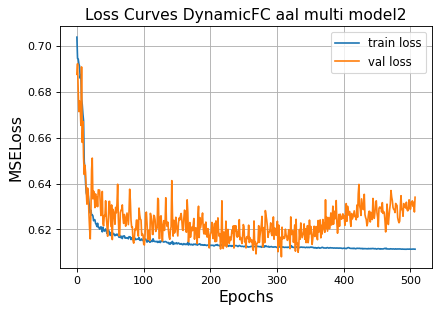

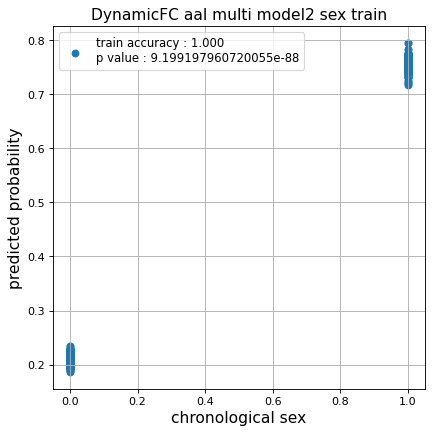

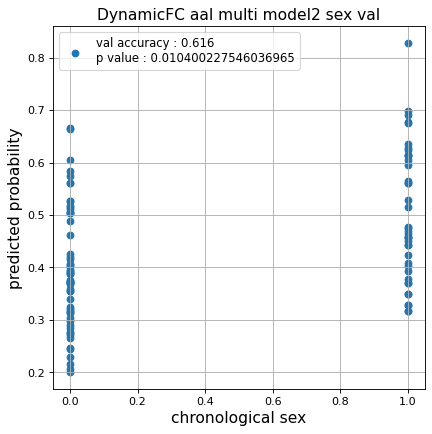

Kfold: 2 ::: epoch: 100, loss: 0.6144678088334891, val loss: 0.6097438633441925
Kfold: 2 ::: epoch: 200, loss: 0.6131258561060979, val loss: 0.6195825636386871
Kfold: 2 ::: epoch: 300, loss: 0.6122512679833633, val loss: 0.6102444678544998
Kfold: 2 ::: epoch: 400, loss: 0.6117519231942984, val loss: 0.6146304607391357
Kfold: 2 ::: epoch: 500, loss: 0.6114310117868277, val loss: 0.5983147025108337
Kfold: 2 ::: epoch: 600, loss: 0.6112308960694534, val loss: 0.5956513285636902
Kfold: 2 ::: epoch: 700, loss: 0.6111472157331613, val loss: 0.6011026054620743
save_epochs:666
best val loss:0.5913314521312714


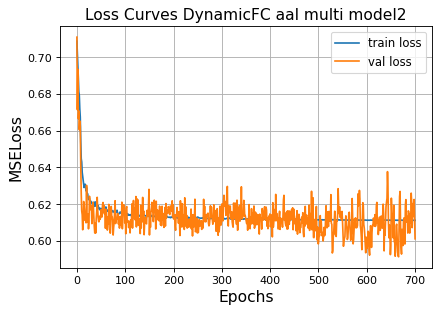

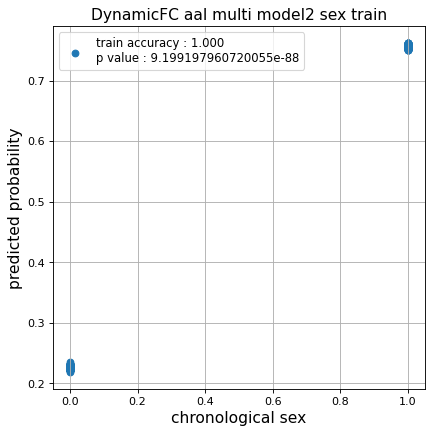

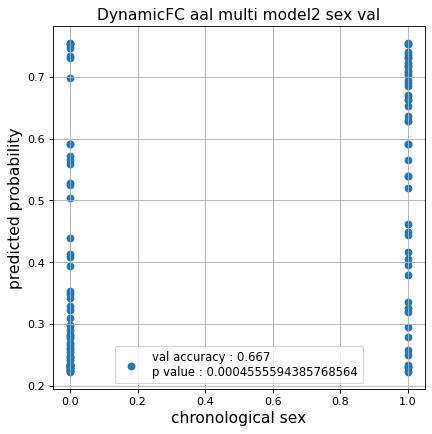

Kfold: 3 ::: epoch: 100, loss: 0.6142750840920669, val loss: 0.5876987278461456
Kfold: 3 ::: epoch: 200, loss: 0.6123610230592581, val loss: 0.5866763889789581
Kfold: 3 ::: epoch: 300, loss: 0.6121509533662063, val loss: 0.5895805805921555
Kfold: 3 ::: epoch: 400, loss: 0.6115967081143305, val loss: 0.575572244822979
Kfold: 3 ::: epoch: 500, loss: 0.6114125618567834, val loss: 0.5611137747764587
Kfold: 3 ::: epoch: 600, loss: 0.6112396121025085, val loss: 0.5655993819236755
Kfold: 3 ::: epoch: 700, loss: 0.6112201443085303, val loss: 0.5565678626298904
save_epochs:652
best val loss:0.5514645427465439


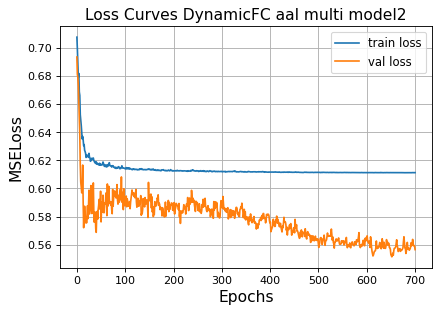

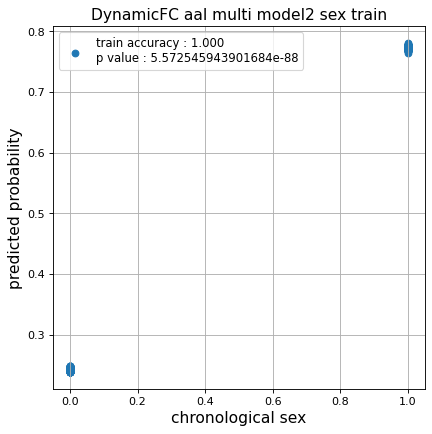

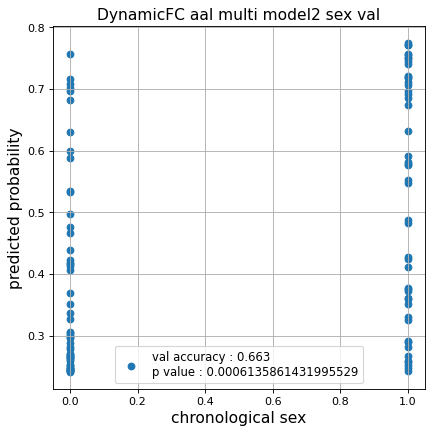

Kfold: 4 ::: epoch: 100, loss: 0.6147639476335965, val loss: 0.6485971361398697
Kfold: 4 ::: epoch: 200, loss: 0.6124033010922946, val loss: 0.6335738003253937
Kfold: 4 ::: epoch: 300, loss: 0.612261061484997, val loss: 0.6219990700483322
Kfold: 4 ::: epoch: 400, loss: 0.6117129784363967, val loss: 0.6339712142944336
Kfold: 4 ::: epoch: 500, loss: 0.6114839361264155, val loss: 0.6163469851016998
Kfold: 4 ::: epoch: 600, loss: 0.6112198600402245, val loss: 0.6011416614055634
Kfold: 4 ::: epoch: 700, loss: 0.6111855598596426, val loss: 0.6561944782733917
save_epochs:683
best val loss:0.5790919661521912


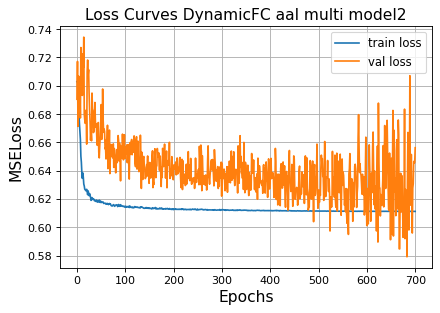

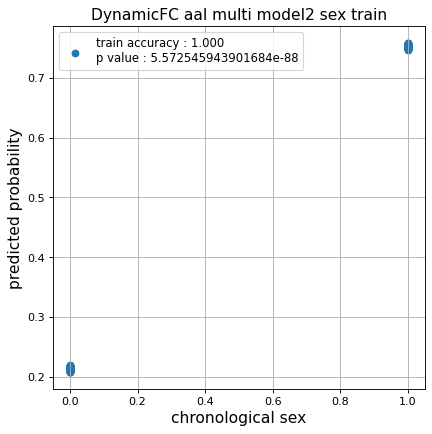

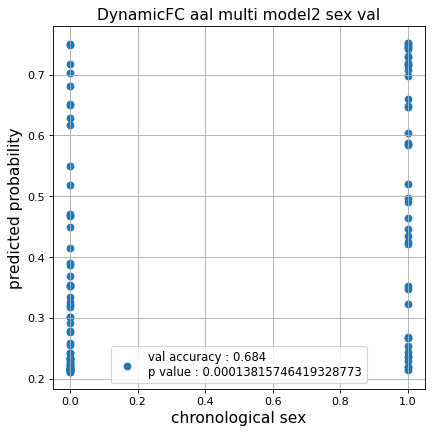

Kfold: 5 ::: epoch: 100, loss: 0.6146461642705477, val loss: 0.6002789884805679
Kfold: 5 ::: epoch: 200, loss: 0.6139099735480088, val loss: 0.5742038190364838
Kfold: 5 ::: epoch: 300, loss: 0.6123172961748563, val loss: 0.553901419043541
Kfold: 5 ::: epoch: 400, loss: 0.6119257991130536, val loss: 0.5367441028356552
Kfold: 5 ::: epoch: 500, loss: 0.611521826340602, val loss: 0.5234555900096893
Kfold: 5 ::: epoch: 600, loss: 0.6112458751751826, val loss: 0.5210549980401993
Kfold: 5 ::: epoch: 700, loss: 0.6112295251626235, val loss: 0.5187080353498459
save_epochs:699
best val loss:0.5157152190804482


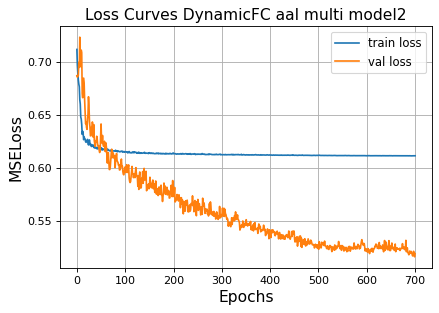

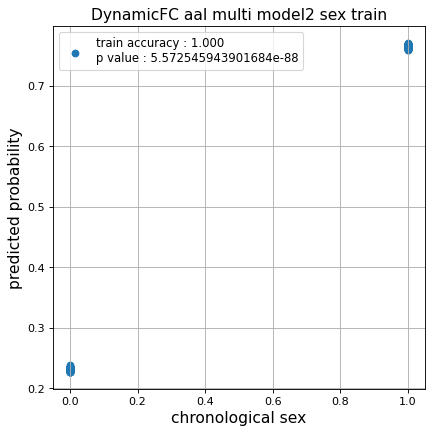

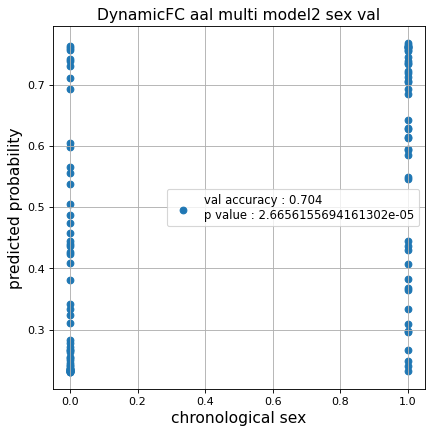

Nested Kfold ::: 3
Kfold: 1 ::: epoch: 100, loss: 0.6152772123997028, val loss: 0.6899213790893555
Kfold: 1 ::: epoch: 200, loss: 0.6134401238881625, val loss: 0.6773737072944641
Kfold: 1 ::: epoch: 300, loss: 0.6123846127436712, val loss: 0.6696106940507889
Kfold: 1 ::: epoch: 400, loss: 0.611872714299422, val loss: 0.6711874008178711
Kfold: 1 ::: epoch: 500, loss: 0.6113792336904086, val loss: 0.663501650094986
Kfold: 1 ::: epoch: 600, loss: 0.6112213776661799, val loss: 0.682878702878952
Kfold: 1 ::: epoch: 700, loss: 0.6111681002836961, val loss: 0.7034665793180466
save_epochs:509
best val loss:0.6429030001163483


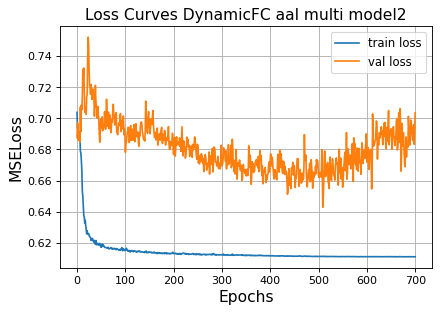

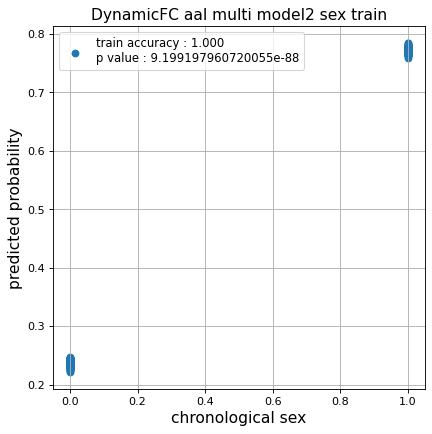

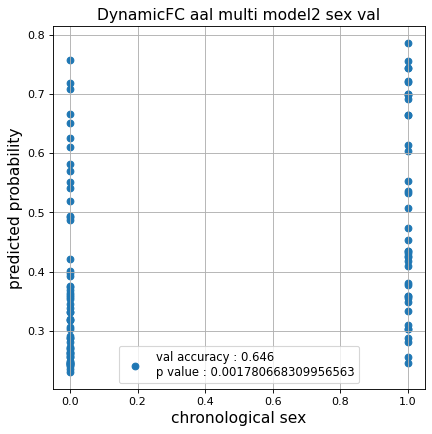

Kfold: 2 ::: epoch: 100, loss: 0.6144968959001395, val loss: 0.577176570892334
Kfold: 2 ::: epoch: 200, loss: 0.6128801153256342, val loss: 0.560475155711174
Kfold: 2 ::: epoch: 300, loss: 0.6119820979925302, val loss: 0.5586935728788376
Kfold: 2 ::: epoch: 400, loss: 0.61158032142199, val loss: 0.5441662073135376
Kfold: 2 ::: epoch: 500, loss: 0.6114316215881934, val loss: 0.5390133112668991
Kfold: 2 ::: epoch: 600, loss: 0.6111879302905157, val loss: 0.5396927148103714
Kfold: 2 ::: epoch: 700, loss: 0.6111900714727548, val loss: 0.5485344678163528
save_epochs:669
best val loss:0.5244792252779007


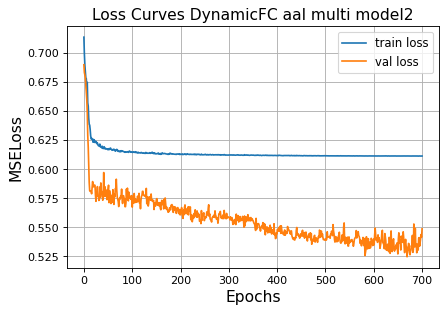

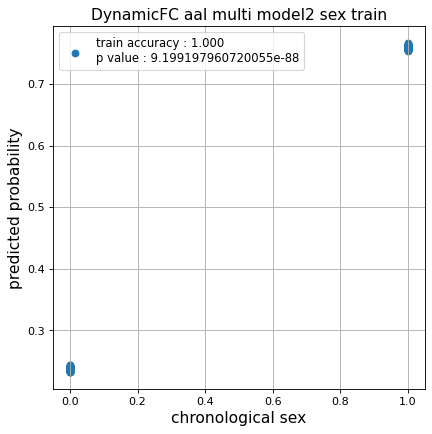

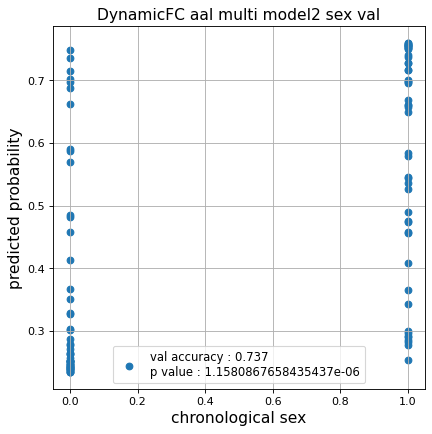

Kfold: 3 ::: epoch: 100, loss: 0.6147054250423725, val loss: 0.6231075376272202
Kfold: 3 ::: epoch: 200, loss: 0.6127104805066035, val loss: 0.6308424323797226
Kfold: 3 ::: epoch: 300, loss: 0.6122121123167185, val loss: 0.6209142804145813
Kfold: 3 ::: epoch: 400, loss: 0.6115518945914048, val loss: 0.6194561868906021
Kfold: 3 ::: epoch: 500, loss: 0.6112755949680622, val loss: 0.6142202317714691
Kfold: 3 ::: epoch: 600, loss: 0.6111969672716581, val loss: 0.5937795490026474
Kfold: 3 ::: epoch: 700, loss: 0.6111930104402395, val loss: 0.6004973948001862
save_epochs:684
best val loss:0.5827026143670082


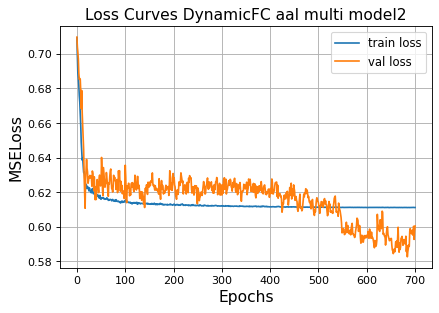

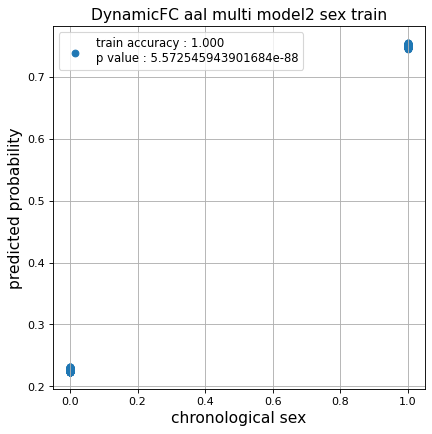

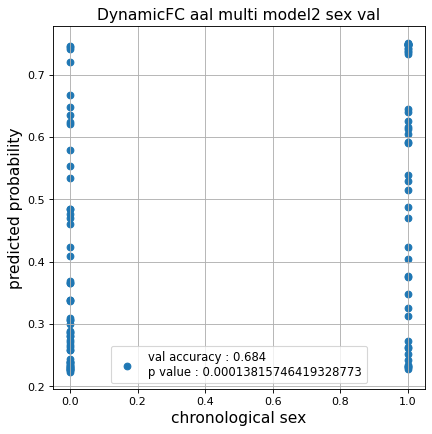

Kfold: 4 ::: epoch: 100, loss: 0.6144028030909024, val loss: 0.6306709200143814
Kfold: 4 ::: epoch: 200, loss: 0.6127775357319758, val loss: 0.6418904364109039
Kfold: 4 ::: epoch: 300, loss: 0.6119974668209369, val loss: 0.6333567500114441
Kfold: 4 ::: epoch: 400, loss: 0.6116874493085421, val loss: 0.6228643357753754
Kfold: 4 ::: epoch: 500, loss: 0.611305649463947, val loss: 0.6232150346040726
Kfold: 4 ::: epoch: 600, loss: 0.6112386263333834, val loss: 0.6205521672964096
Kfold: 4 ::: epoch: 700, loss: 0.6111594301003677, val loss: 0.6057301163673401
save_epochs:638
best val loss:0.573210246860981


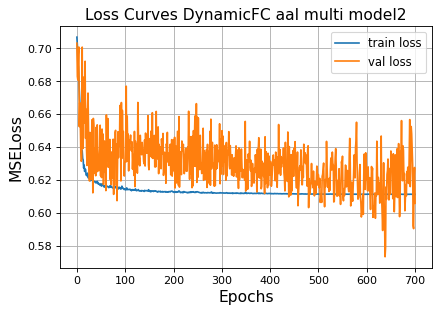

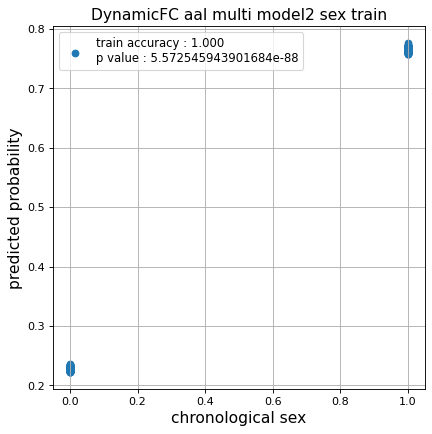

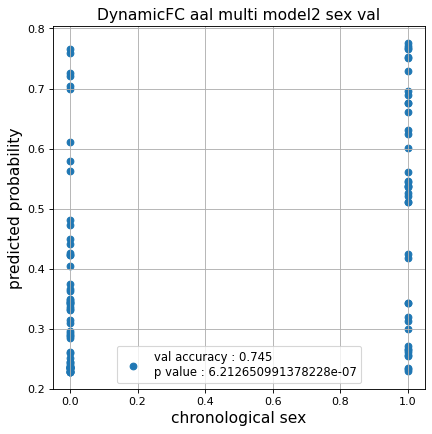

Kfold: 5 ::: epoch: 100, loss: 0.6150598434301523, val loss: 0.6403573751449585
Kfold: 5 ::: epoch: 200, loss: 0.6131286116746756, val loss: 0.6234647184610367
Kfold: 5 ::: epoch: 300, loss: 0.6121966380339402, val loss: 0.621080294251442
Kfold: 5 ::: epoch: 400, loss: 0.612049781359159, val loss: 0.6048497781157494
Kfold: 5 ::: epoch: 500, loss: 0.6116708287825952, val loss: 0.5844309851527214
Kfold: 5 ::: epoch: 600, loss: 0.611720506961529, val loss: 0.5508324205875397
Kfold: 5 ::: epoch: 700, loss: 0.6114757290253272, val loss: 0.5104262083768845
save_epochs:699
best val loss:0.5066872984170914


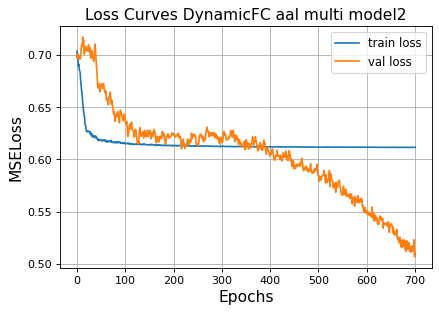

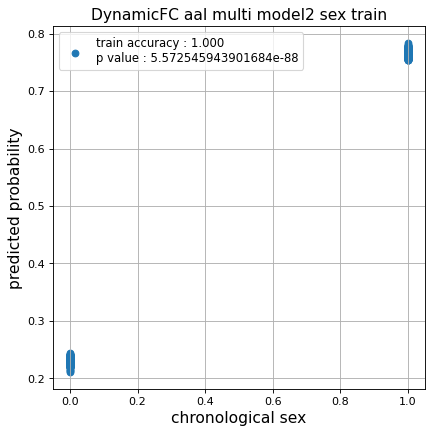

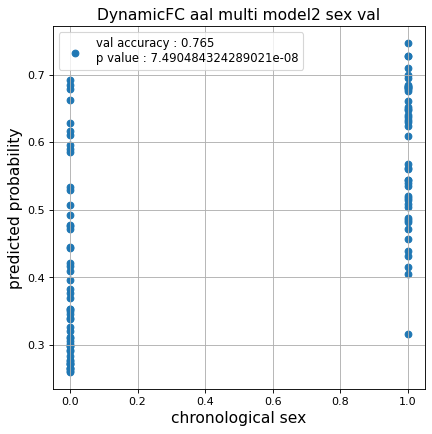

Nested Kfold ::: 4
Kfold: 1 ::: epoch: 100, loss: 0.6149114874693064, val loss: 0.6559902727603912
Kfold: 1 ::: epoch: 200, loss: 0.6135420203208923, val loss: 0.6442037522792816
Kfold: 1 ::: epoch: 300, loss: 0.6121502702052777, val loss: 0.6486828476190567
Kfold: 1 ::: epoch: 400, loss: 0.6117473061268146, val loss: 0.6582165956497192
early stopping
save_epochs:269
best val loss:0.6400570124387741


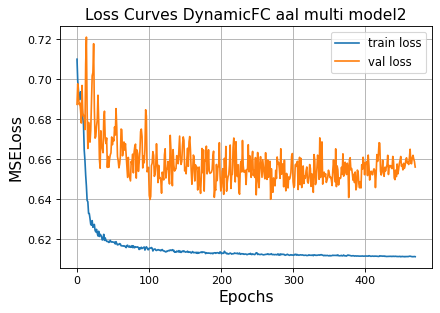

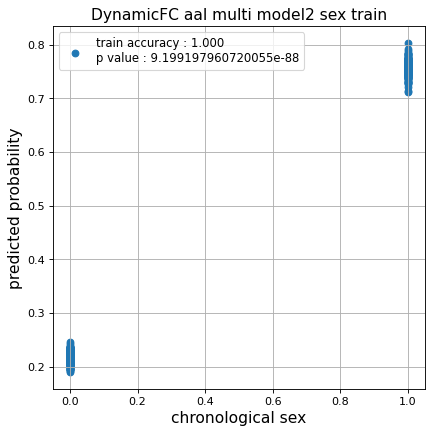

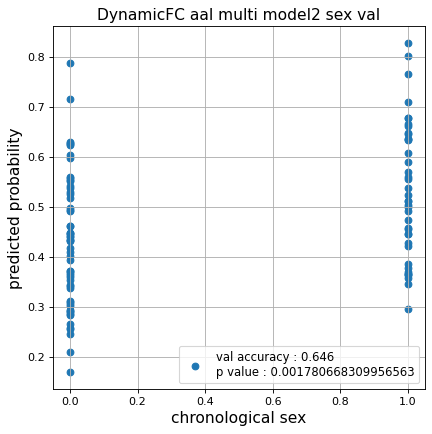

Kfold: 2 ::: epoch: 100, loss: 0.6151615610489478, val loss: 0.6776929646730423
Kfold: 2 ::: epoch: 200, loss: 0.6136045593481797, val loss: 0.6762569099664688
Kfold: 2 ::: epoch: 300, loss: 0.6124604390217707, val loss: 0.6623256951570511
Kfold: 2 ::: epoch: 400, loss: 0.611937403678894, val loss: 0.6645368933677673
Kfold: 2 ::: epoch: 500, loss: 0.6118647639568036, val loss: 0.6602135002613068
Kfold: 2 ::: epoch: 600, loss: 0.6116354923981887, val loss: 0.632806733250618
Kfold: 2 ::: epoch: 700, loss: 0.6114224241330073, val loss: 0.6160134822130203
save_epochs:686
best val loss:0.6124810427427292


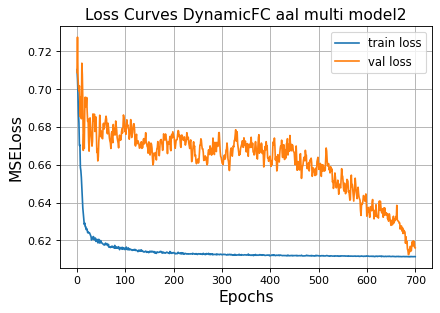

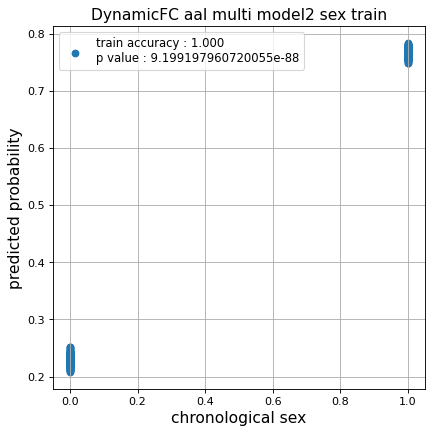

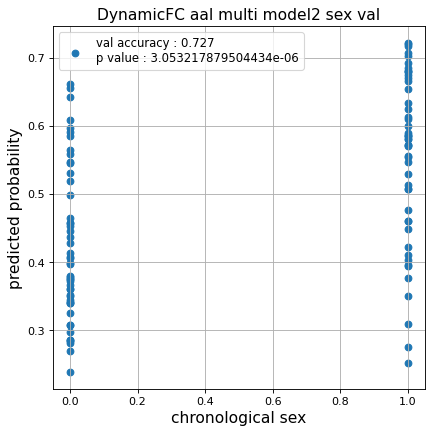

Kfold: 3 ::: epoch: 100, loss: 0.6146831329052265, val loss: 0.7202438116073608
Kfold: 3 ::: epoch: 200, loss: 0.6134138749195979, val loss: 0.7254448384046555
Kfold: 3 ::: epoch: 300, loss: 0.6125408411026001, val loss: 0.72001813352108
Kfold: 3 ::: epoch: 400, loss: 0.6118827828994164, val loss: 0.7193325161933899
Kfold: 3 ::: epoch: 500, loss: 0.6116855098651006, val loss: 0.7168300151824951
Kfold: 3 ::: epoch: 600, loss: 0.6115620869856614, val loss: 0.7094526439905167
Kfold: 3 ::: epoch: 700, loss: 0.6115635312520541, val loss: 0.7088955640792847
save_epochs:679
best val loss:0.6976892203092575


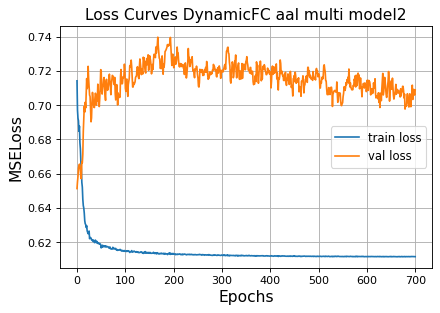

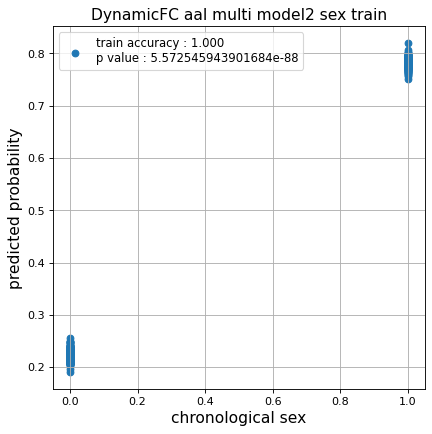

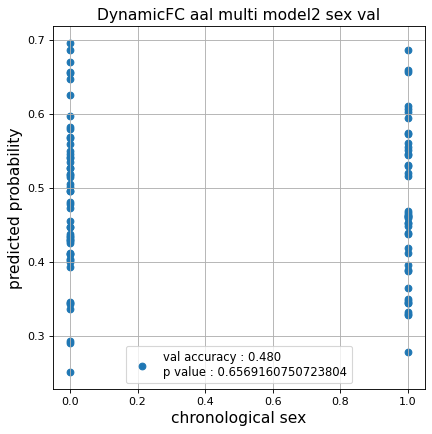

Kfold: 4 ::: epoch: 100, loss: 0.6141920135571406, val loss: 0.734308049082756
Kfold: 4 ::: epoch: 200, loss: 0.6126629664347722, val loss: 0.7389303892850876
Kfold: 4 ::: epoch: 300, loss: 0.6120979831768916, val loss: 0.7375346273183823
Kfold: 4 ::: epoch: 400, loss: 0.6118003038259653, val loss: 0.7549517899751663
early stopping
save_epochs:230
best val loss:0.7249205708503723


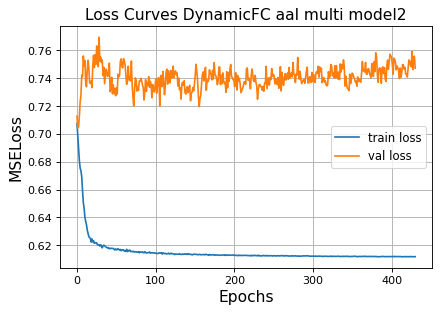

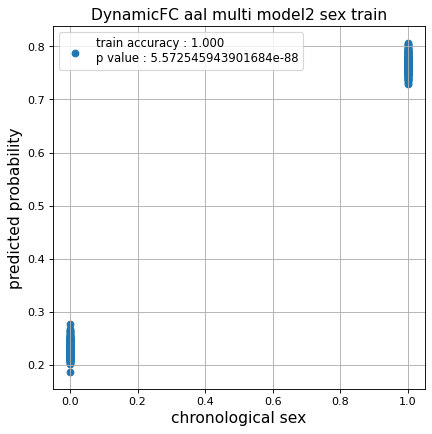

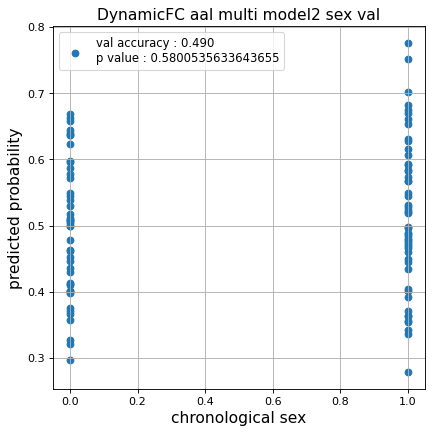

Kfold: 5 ::: epoch: 100, loss: 0.6149103183012742, val loss: 0.6288104057312012
Kfold: 5 ::: epoch: 200, loss: 0.6126303902039161, val loss: 0.5897710770368576
Kfold: 5 ::: epoch: 300, loss: 0.612246614236098, val loss: 0.556600034236908
Kfold: 5 ::: epoch: 400, loss: 0.611630054620596, val loss: 0.5258513614535332
Kfold: 5 ::: epoch: 500, loss: 0.6113853821387658, val loss: 0.5042616203427315
Kfold: 5 ::: epoch: 600, loss: 0.6112199746645414, val loss: 0.498830109834671
Kfold: 5 ::: epoch: 700, loss: 0.6112050459935114, val loss: 0.5062858015298843
save_epochs:693
best val loss:0.4961932450532913


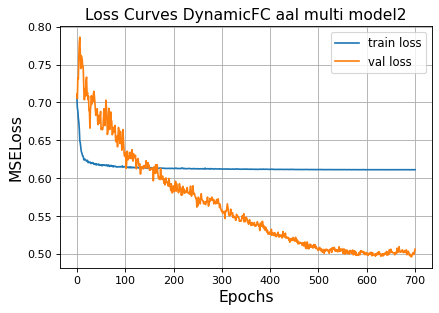

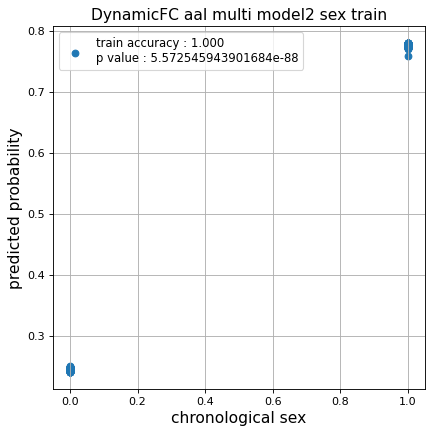

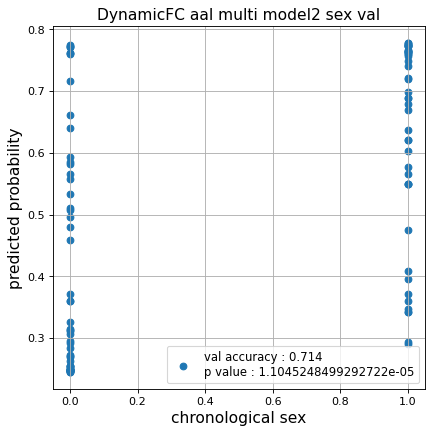

Nested Kfold ::: 5
Kfold: 1 ::: epoch: 100, loss: 0.6152424995715802, val loss: 0.6251978278160095
Kfold: 1 ::: epoch: 200, loss: 0.6130407681831946, val loss: 0.6388025283813477
Kfold: 1 ::: epoch: 300, loss: 0.6120391671474164, val loss: 0.6483184993267059
Kfold: 1 ::: epoch: 400, loss: 0.6115649342536926, val loss: 0.6555727273225784
early stopping
save_epochs:204
best val loss:0.6316177845001221


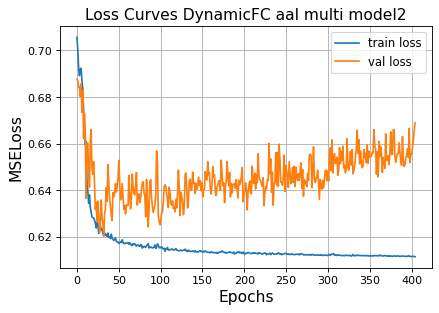

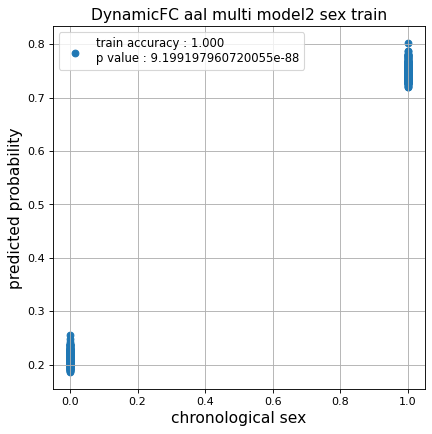

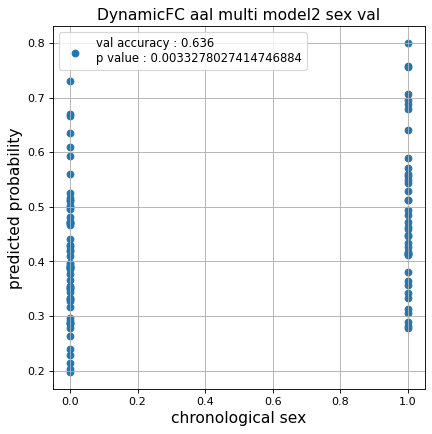

Kfold: 2 ::: epoch: 100, loss: 0.6149920179293706, val loss: 0.5907466560602188
Kfold: 2 ::: epoch: 200, loss: 0.612843238390409, val loss: 0.5701761394739151
Kfold: 2 ::: epoch: 300, loss: 0.6122686083500202, val loss: 0.5636356547474861
Kfold: 2 ::: epoch: 400, loss: 0.611612333701207, val loss: 0.5521220490336418
Kfold: 2 ::: epoch: 500, loss: 0.6113684819294856, val loss: 0.5387421697378159
Kfold: 2 ::: epoch: 600, loss: 0.6112536467038668, val loss: 0.537201963365078
Kfold: 2 ::: epoch: 700, loss: 0.6111955321752108, val loss: 0.5496545359492302
save_epochs:537
best val loss:0.5311381667852402


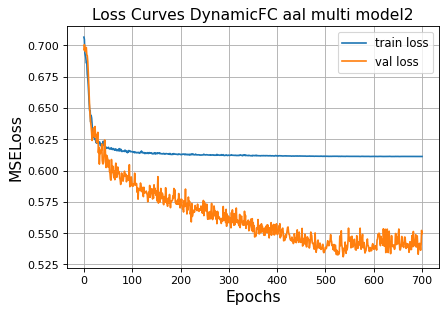

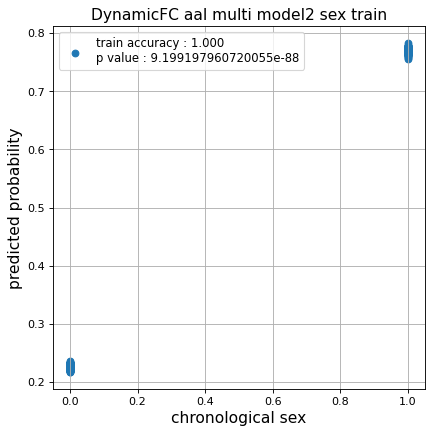

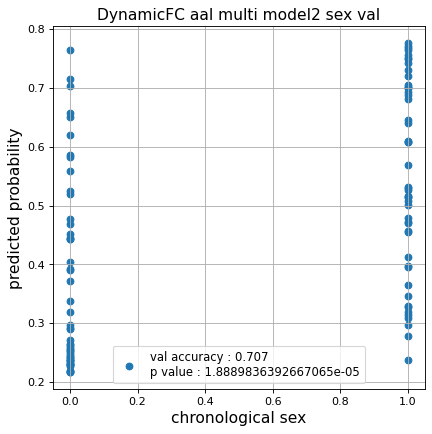

Kfold: 3 ::: epoch: 100, loss: 0.6150701596186712, val loss: 0.6295984536409378
Kfold: 3 ::: epoch: 200, loss: 0.6125289385135357, val loss: 0.6043584942817688
Kfold: 3 ::: epoch: 300, loss: 0.6123261222472558, val loss: 0.5793619900941849
Kfold: 3 ::: epoch: 400, loss: 0.6115907384799077, val loss: 0.5835222750902176
Kfold: 3 ::: epoch: 500, loss: 0.6113637043879583, val loss: 0.5653675347566605
Kfold: 3 ::: epoch: 600, loss: 0.6112591578410222, val loss: 0.5543926432728767
Kfold: 3 ::: epoch: 700, loss: 0.6111953992110032, val loss: 0.5574225038290024
save_epochs:548
best val loss:0.5431072562932968


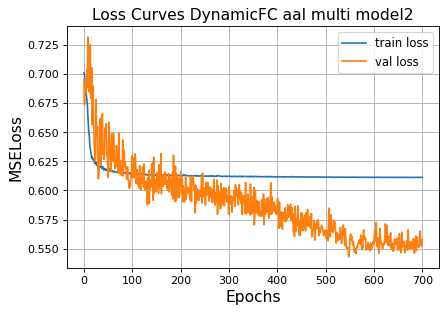

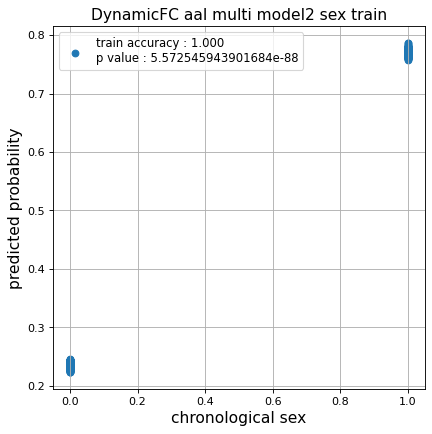

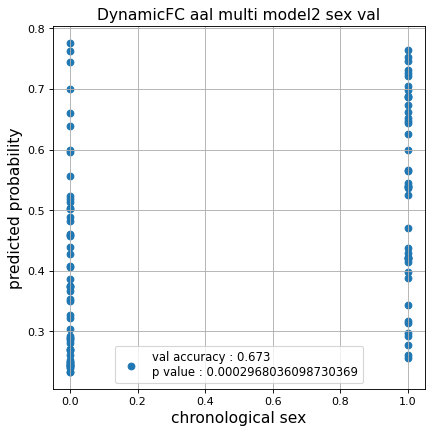

Kfold: 4 ::: epoch: 100, loss: 0.6151752747022189, val loss: 0.6360414922237396
Kfold: 4 ::: epoch: 200, loss: 0.6131506745631878, val loss: 0.6274370849132538
Kfold: 4 ::: epoch: 300, loss: 0.6126934427481431, val loss: 0.6254264414310455
Kfold: 4 ::: epoch: 400, loss: 0.6119822263717651, val loss: 0.6333582103252411
early stopping
save_epochs:240
best val loss:0.6138438135385513


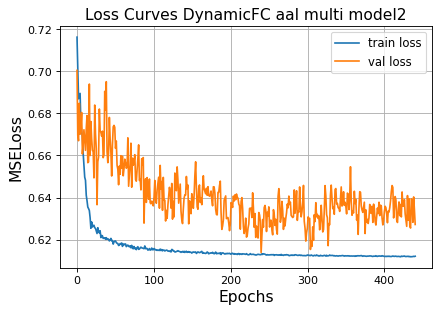

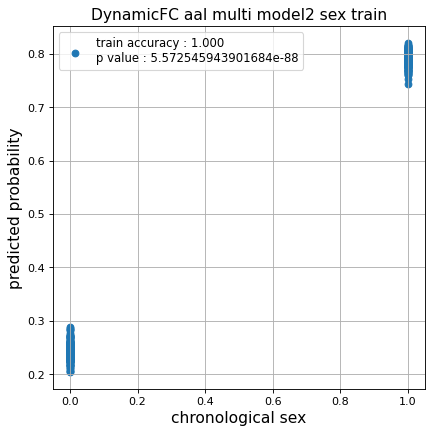

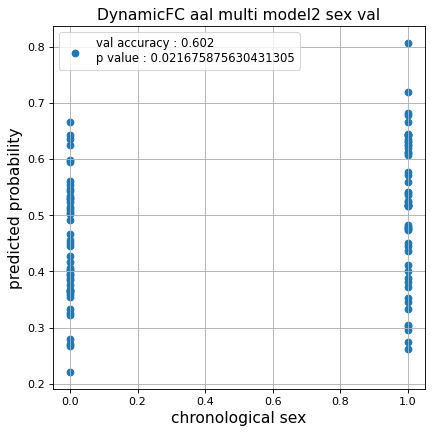

Kfold: 5 ::: epoch: 100, loss: 0.6140306271039523, val loss: 0.6104085594415665
Kfold: 5 ::: epoch: 200, loss: 0.613247247842642, val loss: 0.5997819751501083
Kfold: 5 ::: epoch: 300, loss: 0.6123040731136615, val loss: 0.6028157770633698
Kfold: 5 ::: epoch: 400, loss: 0.6119905022474436, val loss: 0.5924609750509262
Kfold: 5 ::: epoch: 500, loss: 0.6114289302092332, val loss: 0.59649458527565
Kfold: 5 ::: epoch: 600, loss: 0.6112291491948642, val loss: 0.6105426251888275
early stopping
save_epochs:486
best val loss:0.5854649096727371


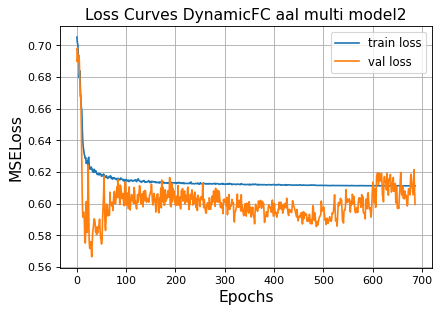

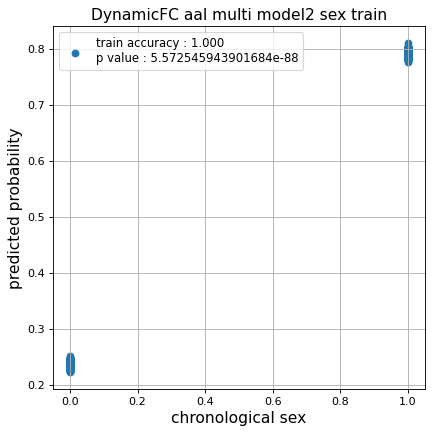

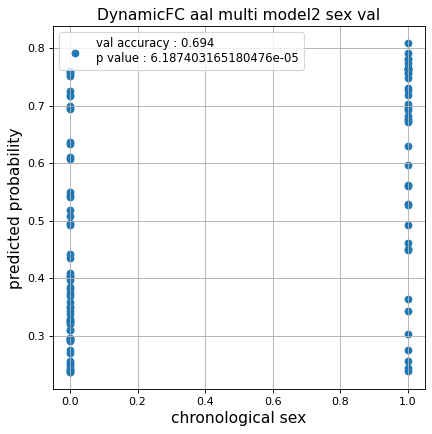

CPU times: user 1d 2h 54min 8s, sys: 1min 41s, total: 1d 2h 55min 49s
Wall time: 3h 54min 32s


In [ ]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_aal_dynamic_2  = []
test_pred_aal_dynamic_corrected_2  = []
test_label_aal_dynamic_2 = []
test_idx_aal_dynamic_2   = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_aal)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_corrected,test_label = train_model(data_dynamic_aal,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 700,
                                                           d_model    = 64,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 256,
                                                           nhead      = 2,#4
                                                           hidden_dim_transformer = 1,#2
                                                           pos_drop    = 0.5,
                                                           trans_drop = 0.5,
                                                           fc_drop = 0.3,
                                                           title = 'DynamicFC aal multi model2'
                                                          )
    
    test_pred_aal_dynamic_2.append(test_pred)
    test_pred_aal_dynamic_corrected_2.append(test_pred_corrected)
    test_label_aal_dynamic_2.append(test_label)
    test_idx_aal_dynamic_2.append(test_idx)

### データ保存

In [ ]:
test_pred_aal_dynamic_1 = np.array(test_pred_aal_dynamic_1, dtype=object)
test_pred_aal_dynamic_corrected_1 = np.array(test_pred_aal_dynamic_corrected_1, dtype=object)

test_pred_aal_dynamic_2 = np.array(test_pred_aal_dynamic_2, dtype=object)
test_pred_aal_dynamic_corrected_2 = np.array(test_pred_aal_dynamic_corrected_2, dtype=object)

In [ ]:
np.savez('../02_data_analysis/temp/dynamic_aal_sex_1',
         test_pred_aal_dynamic_1,
         test_pred_aal_dynamic_corrected_1,
         test_label_aal_dynamic_1,
         test_idx_aal_dynamic_1)
np.savez('../02_data_analysis/temp/dynamic_aal_sex_2',
         test_pred_aal_dynamic_2,
         test_pred_aal_dynamic_corrected_2,
         test_label_aal_dynamic_2,
         test_idx_aal_dynamic_2)

## 学習(Harvard-Oxford)

### ROI 1

Nested Kfold ::: 1
Kfold: 1 ::: epoch: 100, loss: 0.6142288492276118, val loss: 0.7030654847621918
Kfold: 1 ::: epoch: 200, loss: 0.6126124950555655, val loss: 0.7052144110202789
Kfold: 1 ::: epoch: 300, loss: 0.6123137519909785, val loss: 0.6958878934383392
Kfold: 1 ::: epoch: 400, loss: 0.6119736662277808, val loss: 0.6890501379966736
Kfold: 1 ::: epoch: 500, loss: 0.6117585943295405, val loss: 0.6828016340732574
Kfold: 1 ::: epoch: 600, loss: 0.611526580957266, val loss: 0.6755123287439346
Kfold: 1 ::: epoch: 700, loss: 0.6114284625420203, val loss: 0.6681411415338516
Kfold: 1 ::: epoch: 800, loss: 0.6112933571522052, val loss: 0.6703339964151382
Kfold: 1 ::: epoch: 900, loss: 0.6110774462039654, val loss: 0.6456858068704605
Kfold: 1 ::: epoch: 1000, loss: 0.6110228070845971, val loss: 0.6430756151676178
save_epochs:978
best val loss:0.629402682185173


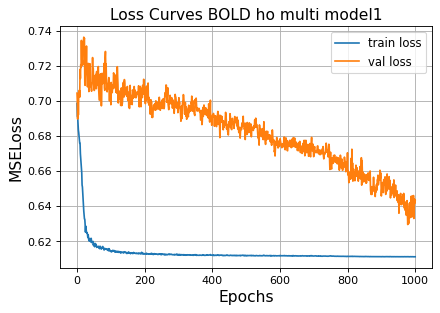

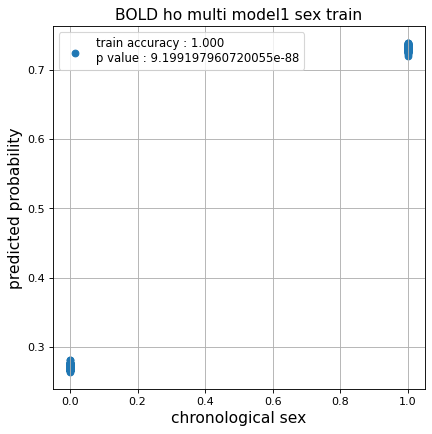

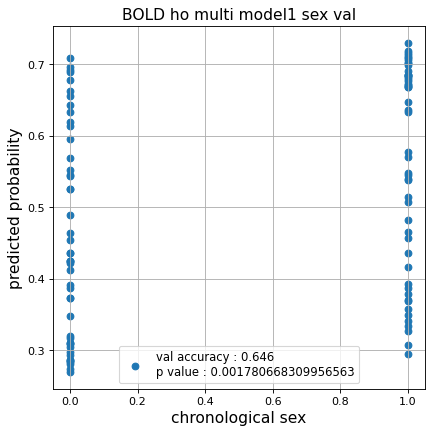

Kfold: 2 ::: epoch: 100, loss: 0.6142084323442899, val loss: 0.6908825188875198
Kfold: 2 ::: epoch: 200, loss: 0.6126060990186838, val loss: 0.660989910364151
Kfold: 2 ::: epoch: 300, loss: 0.6123577310488775, val loss: 0.6456454396247864
Kfold: 2 ::: epoch: 400, loss: 0.6118503488027133, val loss: 0.628477081656456
Kfold: 2 ::: epoch: 500, loss: 0.611853723342602, val loss: 0.6272439509630203
Kfold: 2 ::: epoch: 600, loss: 0.6116466934864337, val loss: 0.6280851364135742
Kfold: 2 ::: epoch: 700, loss: 0.6114608003542974, val loss: 0.6281653642654419
Kfold: 2 ::: epoch: 800, loss: 0.6114906072616577, val loss: 0.6184449195861816
Kfold: 2 ::: epoch: 900, loss: 0.6112649624164288, val loss: 0.6092021465301514
Kfold: 2 ::: epoch: 1000, loss: 0.6110479969244736, val loss: 0.5922931730747223
save_epochs:998
best val loss:0.586452305316925


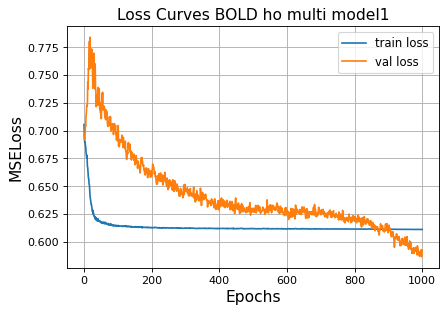

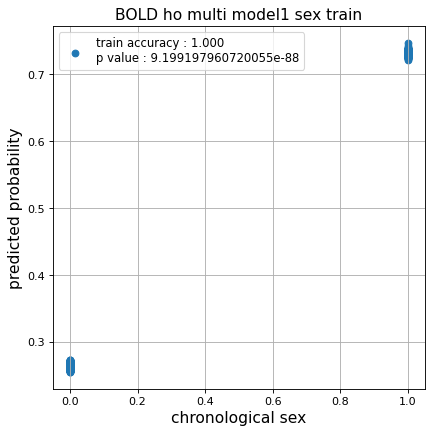

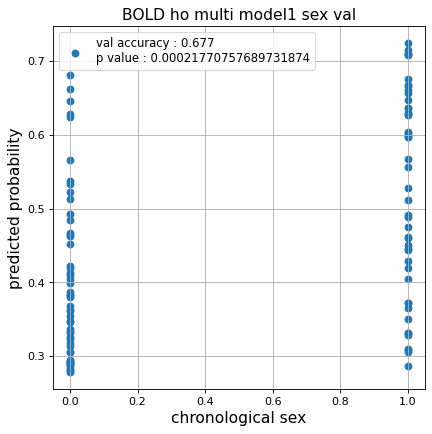

Kfold: 3 ::: epoch: 100, loss: 0.6154408133946933, val loss: 0.7271595299243927
Kfold: 3 ::: epoch: 200, loss: 0.6126990960194514, val loss: 0.6814241707324982
Kfold: 3 ::: epoch: 300, loss: 0.6125627068372873, val loss: 0.6678726375102997
Kfold: 3 ::: epoch: 400, loss: 0.6119264364242554, val loss: 0.6556578278541565
Kfold: 3 ::: epoch: 500, loss: 0.6118173369994531, val loss: 0.6414523124694824
Kfold: 3 ::: epoch: 600, loss: 0.6113818975595328, val loss: 0.6128481179475784
Kfold: 3 ::: epoch: 700, loss: 0.611120865895198, val loss: 0.6059087365865707
Kfold: 3 ::: epoch: 800, loss: 0.6110584965118995, val loss: 0.584410086274147
Kfold: 3 ::: epoch: 900, loss: 0.6110151685201205, val loss: 0.5945799499750137
Kfold: 3 ::: epoch: 1000, loss: 0.6109944536135747, val loss: 0.5720974951982498
save_epochs:1000
best val loss:0.5720974951982498


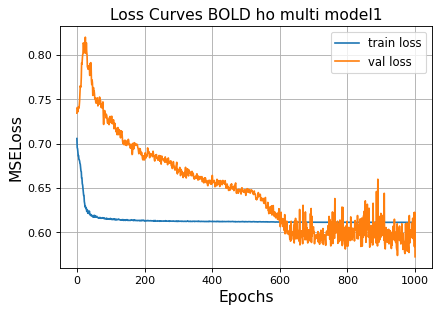

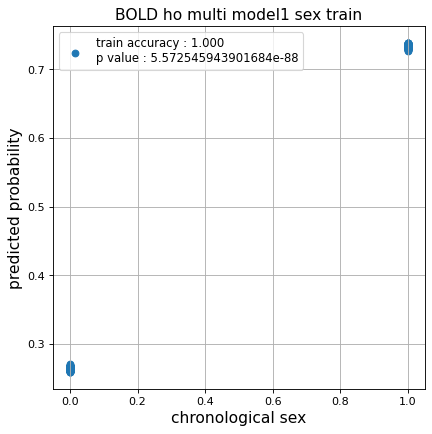

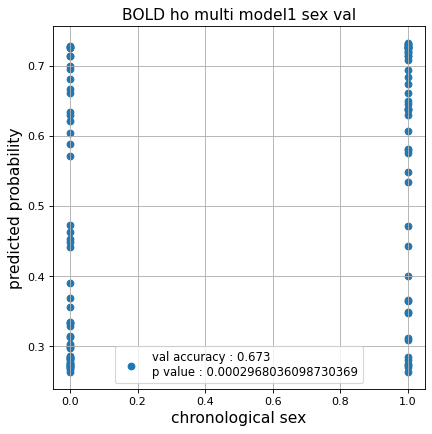

Kfold: 4 ::: epoch: 100, loss: 0.613999082491948, val loss: 0.6657286882400513
Kfold: 4 ::: epoch: 200, loss: 0.612729535653041, val loss: 0.6302014142274857
Kfold: 4 ::: epoch: 300, loss: 0.6121507378724905, val loss: 0.6132133454084396
Kfold: 4 ::: epoch: 400, loss: 0.6118708619704614, val loss: 0.6197957694530487
Kfold: 4 ::: epoch: 500, loss: 0.611713381913992, val loss: 0.6102743595838547
early stopping
save_epochs:370
best val loss:0.5997526496648788


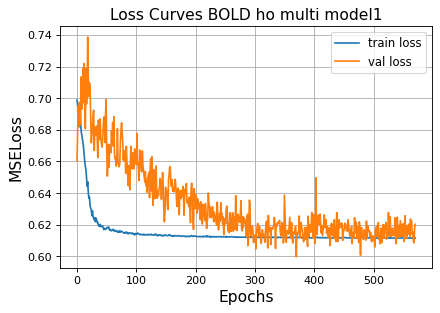

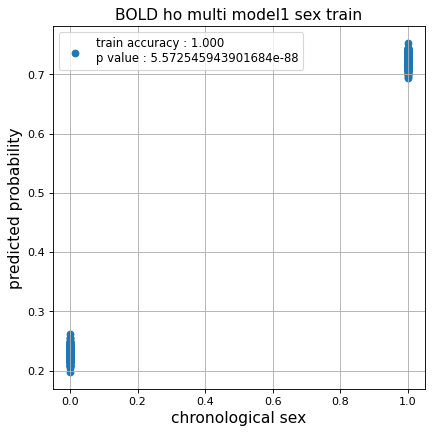

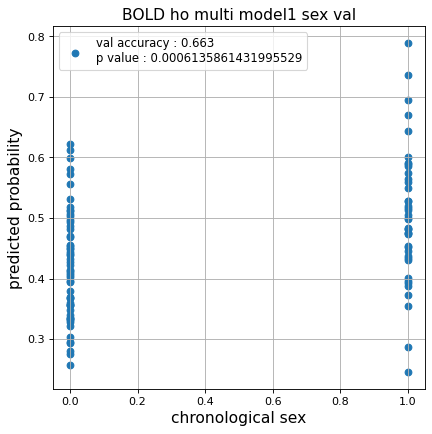

Kfold: 5 ::: epoch: 100, loss: 0.6145953994530898, val loss: 0.6471049636602402
Kfold: 5 ::: epoch: 200, loss: 0.6129561158326956, val loss: 0.6369946449995041
Kfold: 5 ::: epoch: 300, loss: 0.6124362166111286, val loss: 0.6282757520675659
Kfold: 5 ::: epoch: 400, loss: 0.61168699998122, val loss: 0.6241823583841324
Kfold: 5 ::: epoch: 500, loss: 0.6112665946667011, val loss: 0.6285582184791565
early stopping
save_epochs:349
best val loss:0.6206579953432083


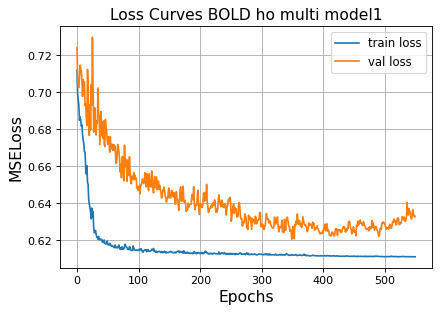

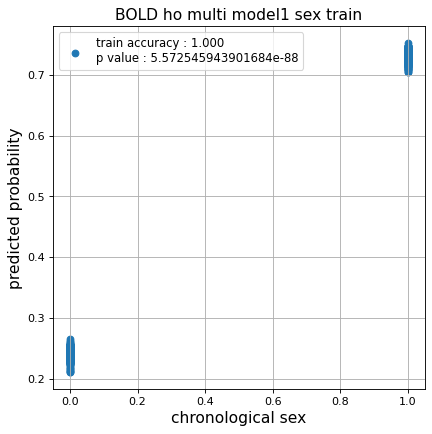

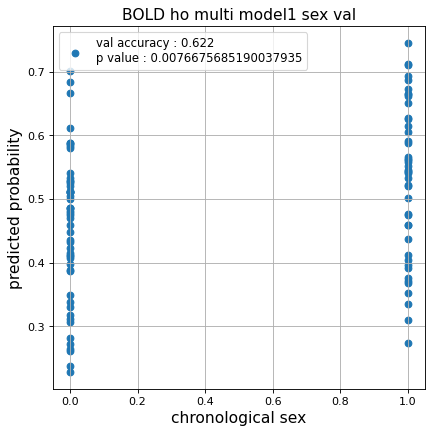

Nested Kfold ::: 2
Kfold: 1 ::: epoch: 100, loss: 0.6140806812506455, val loss: 0.6375242471694946
Kfold: 1 ::: epoch: 200, loss: 0.6126164243771479, val loss: 0.6285073757171631
Kfold: 1 ::: epoch: 300, loss: 0.6121781055743878, val loss: 0.6131999343633652
Kfold: 1 ::: epoch: 400, loss: 0.6119394073119531, val loss: 0.6079424619674683
Kfold: 1 ::: epoch: 500, loss: 0.6117484202751746, val loss: 0.6070876568555832
Kfold: 1 ::: epoch: 600, loss: 0.6115225095015305, val loss: 0.6045617610216141
Kfold: 1 ::: epoch: 700, loss: 0.6114662427168626, val loss: 0.6010420024394989
Kfold: 1 ::: epoch: 800, loss: 0.6112845127399151, val loss: 0.5771495699882507
Kfold: 1 ::: epoch: 900, loss: 0.6110620131859412, val loss: 0.5734092742204666
Kfold: 1 ::: epoch: 1000, loss: 0.6110264888176551, val loss: 0.571493923664093
save_epochs:995
best val loss:0.5653034746646881


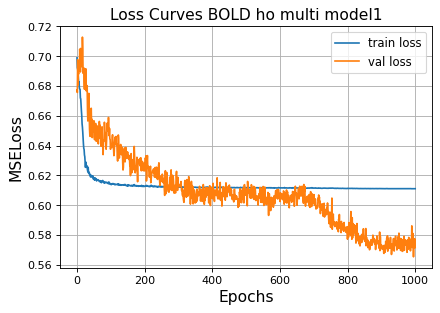

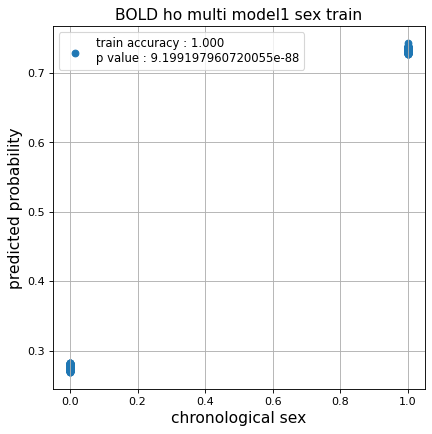

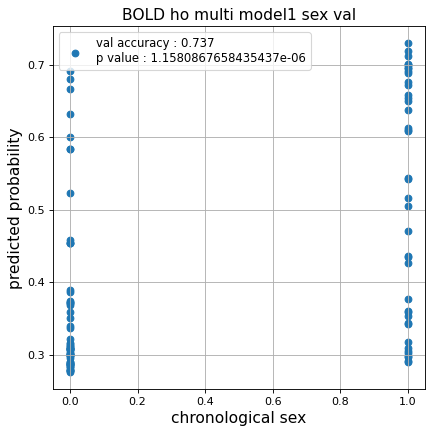

Kfold: 2 ::: epoch: 100, loss: 0.6138658340160663, val loss: 0.708182081580162
Kfold: 2 ::: epoch: 200, loss: 0.6127999975131109, val loss: 0.6768923550844193
Kfold: 2 ::: epoch: 300, loss: 0.6121731446339533, val loss: 0.6547908186912537
Kfold: 2 ::: epoch: 400, loss: 0.6119026770958533, val loss: 0.6471352726221085
Kfold: 2 ::: epoch: 500, loss: 0.6118379326967093, val loss: 0.6450740247964859
Kfold: 2 ::: epoch: 600, loss: 0.6115961762575003, val loss: 0.6475972682237625
Kfold: 2 ::: epoch: 700, loss: 0.6115194604947016, val loss: 0.6432262659072876
Kfold: 2 ::: epoch: 800, loss: 0.6114045794193561, val loss: 0.6344488263130188
Kfold: 2 ::: epoch: 900, loss: 0.6112009011782132, val loss: 0.6369889378547668
Kfold: 2 ::: epoch: 1000, loss: 0.6110339898329514, val loss: 0.6310510635375977
save_epochs:923
best val loss:0.6237762421369553


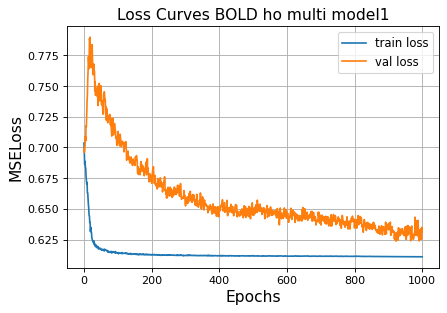

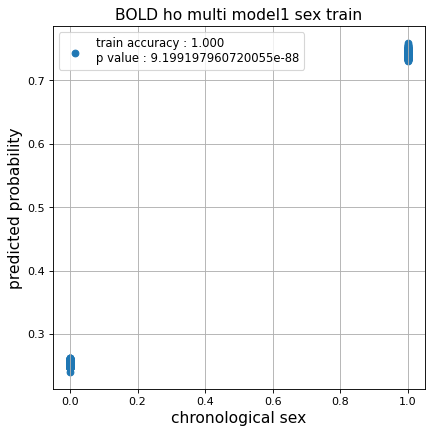

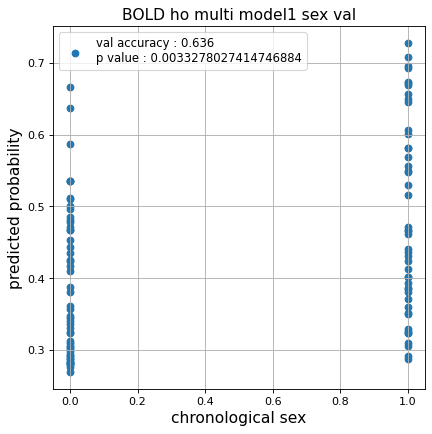

Kfold: 3 ::: epoch: 100, loss: 0.6146601025874798, val loss: 0.7277184277772903
Kfold: 3 ::: epoch: 200, loss: 0.6126924248842093, val loss: 0.670221745967865
Kfold: 3 ::: epoch: 300, loss: 0.6122230199667124, val loss: 0.6528307944536209
Kfold: 3 ::: epoch: 400, loss: 0.6116933272435114, val loss: 0.6398217082023621
Kfold: 3 ::: epoch: 500, loss: 0.6114536248720609, val loss: 0.6100340187549591
Kfold: 3 ::: epoch: 600, loss: 0.6111384034156799, val loss: 0.612211287021637
Kfold: 3 ::: epoch: 700, loss: 0.6110567633922284, val loss: 0.6185213625431061
Kfold: 3 ::: epoch: 800, loss: 0.6109980344772339, val loss: 0.6041317135095596
Kfold: 3 ::: epoch: 900, loss: 0.6110257277121911, val loss: 0.604237362742424
Kfold: 3 ::: epoch: 1000, loss: 0.6110060260846064, val loss: 0.625901386141777
save_epochs:809
best val loss:0.5797009095549583


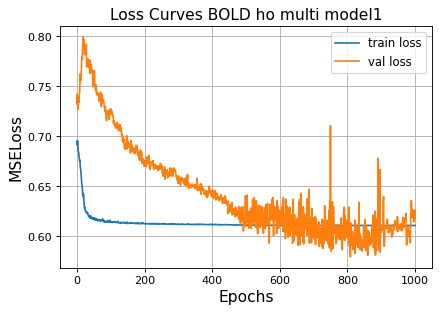

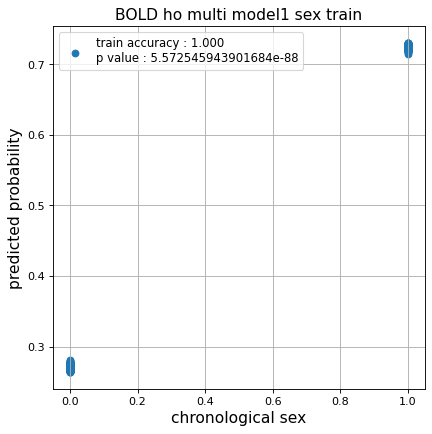

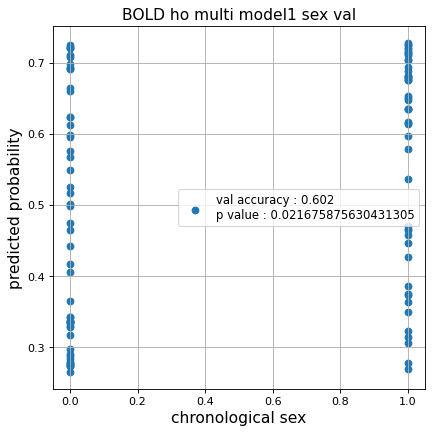

Kfold: 4 ::: epoch: 100, loss: 0.6140625660236065, val loss: 0.6515775471925735
Kfold: 4 ::: epoch: 200, loss: 0.6126101842293372, val loss: 0.6268237382173538
Kfold: 4 ::: epoch: 300, loss: 0.6120920364673321, val loss: 0.5989741235971451
Kfold: 4 ::: epoch: 400, loss: 0.6118793487548828, val loss: 0.6047429144382477
Kfold: 4 ::: epoch: 500, loss: 0.6118980554433969, val loss: 0.6025946736335754
Kfold: 4 ::: epoch: 600, loss: 0.6115461312807523, val loss: 0.603609025478363
Kfold: 4 ::: epoch: 700, loss: 0.611496090888977, val loss: 0.6006554067134857
early stopping
save_epochs:499
best val loss:0.5895804911851883


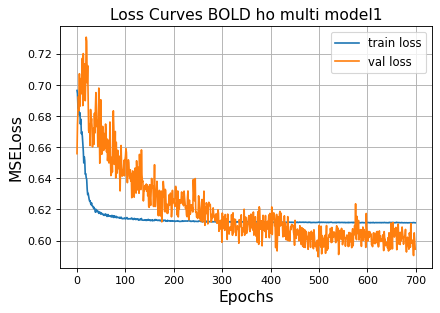

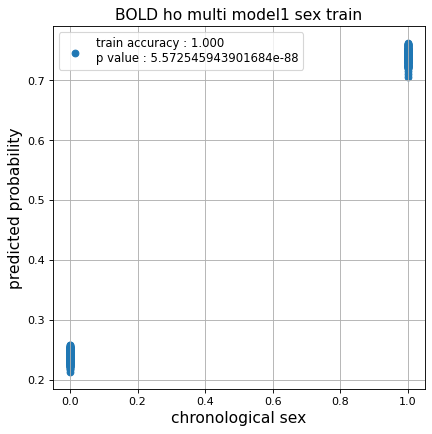

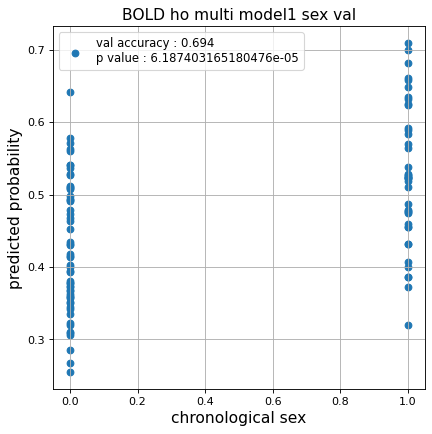

Kfold: 5 ::: epoch: 100, loss: 0.6145613331061143, val loss: 0.605658046901226
Kfold: 5 ::: epoch: 200, loss: 0.6127405074926523, val loss: 0.5980307906866074
Kfold: 5 ::: epoch: 300, loss: 0.6122243037590613, val loss: 0.5951483696699142
Kfold: 5 ::: epoch: 400, loss: 0.6119855504769546, val loss: 0.5888949930667877
Kfold: 5 ::: epoch: 500, loss: 0.6119052171707153, val loss: 0.5966512709856033
early stopping
save_epochs:391
best val loss:0.5839264243841171


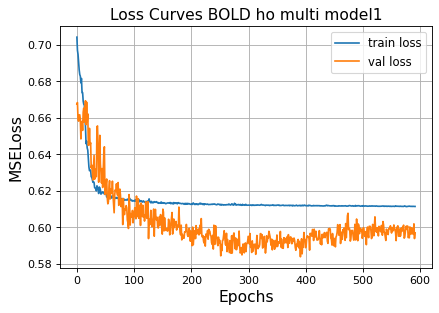

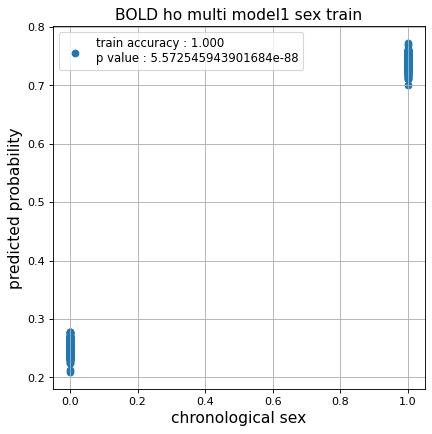

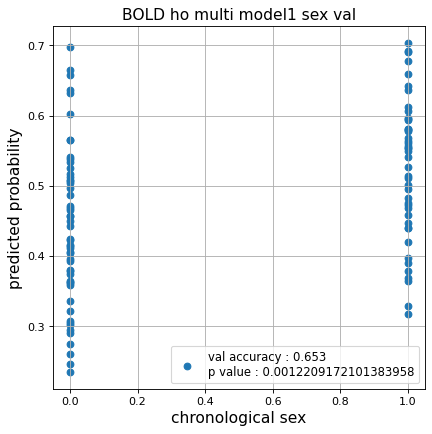

Nested Kfold ::: 3
Kfold: 1 ::: epoch: 100, loss: 0.6139147419195908, val loss: 0.6307104229927063
Kfold: 1 ::: epoch: 200, loss: 0.6126340535970834, val loss: 0.621035635471344
Kfold: 1 ::: epoch: 300, loss: 0.6120729217162499, val loss: 0.6140606850385666
Kfold: 1 ::: epoch: 400, loss: 0.6118833376811101, val loss: 0.6151986718177795
Kfold: 1 ::: epoch: 500, loss: 0.6119373349043039, val loss: 0.6150564253330231
Kfold: 1 ::: epoch: 600, loss: 0.6116998424896827, val loss: 0.6193944811820984
early stopping
save_epochs:473
best val loss:0.6073969006538391


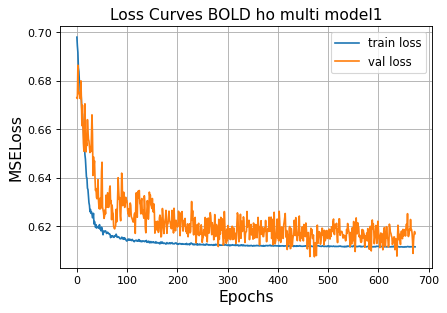

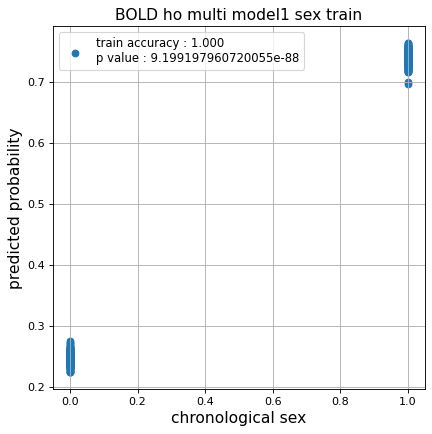

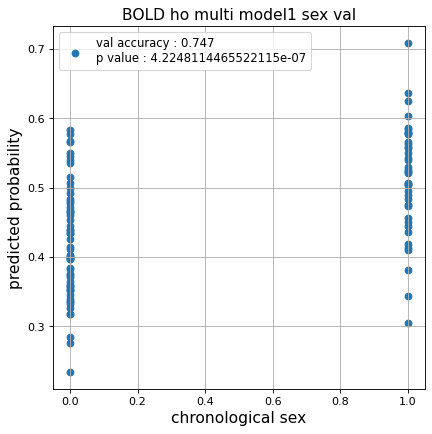

Kfold: 2 ::: epoch: 100, loss: 0.6147021101071284, val loss: 0.6393419355154037
Kfold: 2 ::: epoch: 200, loss: 0.6133933159021231, val loss: 0.6373572647571564
Kfold: 2 ::: epoch: 300, loss: 0.6124659593288715, val loss: 0.6308930814266205
Kfold: 2 ::: epoch: 400, loss: 0.6119753351578345, val loss: 0.6210049688816071
Kfold: 2 ::: epoch: 500, loss: 0.6117034325232873, val loss: 0.6224202513694763
Kfold: 2 ::: epoch: 600, loss: 0.6114244002562302, val loss: 0.603571891784668
Kfold: 2 ::: epoch: 700, loss: 0.6112322165415838, val loss: 0.5969516634941101
Kfold: 2 ::: epoch: 800, loss: 0.6111105772165152, val loss: 0.5897155404090881
Kfold: 2 ::: epoch: 900, loss: 0.61110081580969, val loss: 0.5997856855392456
Kfold: 2 ::: epoch: 1000, loss: 0.611011605996352, val loss: 0.601825013756752
save_epochs:810
best val loss:0.5738512501120567


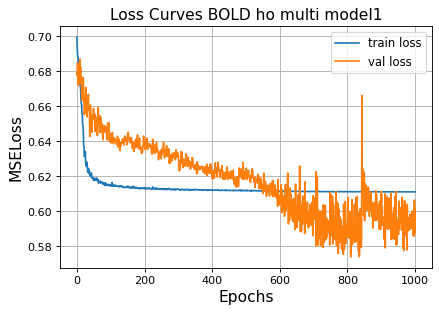

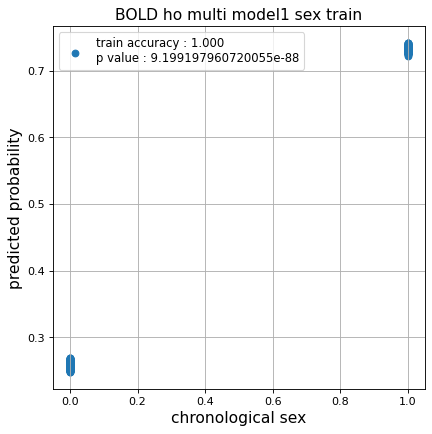

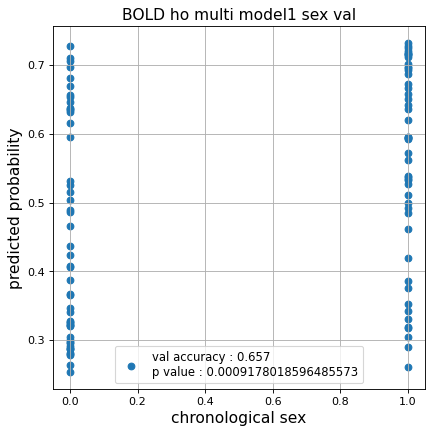

Kfold: 3 ::: epoch: 100, loss: 0.6142633649019095, val loss: 0.7206453233957291
Kfold: 3 ::: epoch: 200, loss: 0.6128850946059594, val loss: 0.7097510546445847
Kfold: 3 ::: epoch: 300, loss: 0.6121738094549912, val loss: 0.6862842887639999
Kfold: 3 ::: epoch: 400, loss: 0.6119512411264273, val loss: 0.6867522746324539
Kfold: 3 ::: epoch: 500, loss: 0.6117434501647949, val loss: 0.6785757094621658
Kfold: 3 ::: epoch: 600, loss: 0.6116361021995544, val loss: 0.6845613270998001
Kfold: 3 ::: epoch: 700, loss: 0.6114164407436664, val loss: 0.6916105151176453
early stopping
save_epochs:499
best val loss:0.6756648421287537


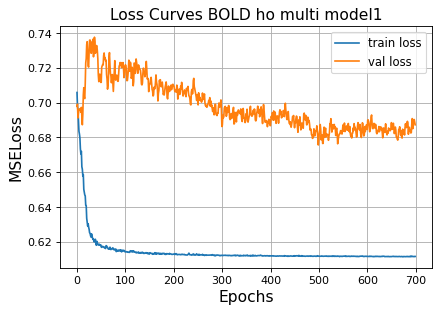

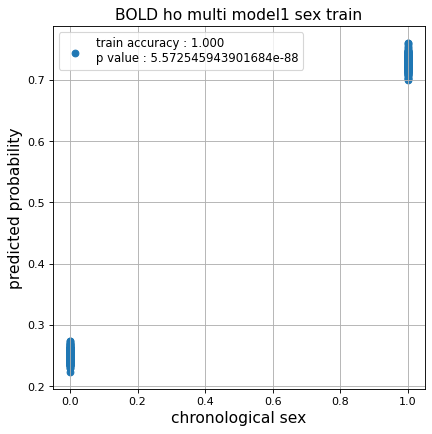

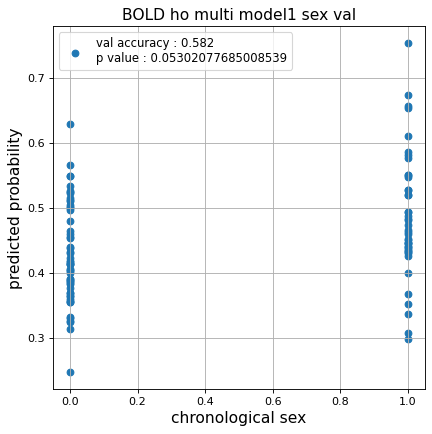

Kfold: 4 ::: epoch: 100, loss: 0.6140542901479281, val loss: 0.6846957355737686
Kfold: 4 ::: epoch: 200, loss: 0.6125759940880996, val loss: 0.6664532870054245
Kfold: 4 ::: epoch: 300, loss: 0.6122070871866666, val loss: 0.648041695356369
Kfold: 4 ::: epoch: 400, loss: 0.6118087539306054, val loss: 0.6453141123056412
Kfold: 4 ::: epoch: 500, loss: 0.6117801849658673, val loss: 0.6416961550712585
Kfold: 4 ::: epoch: 600, loss: 0.611795058617225, val loss: 0.6369981914758682
Kfold: 4 ::: epoch: 700, loss: 0.6114467749228845, val loss: 0.6379648745059967
Kfold: 4 ::: epoch: 800, loss: 0.6113312290265009, val loss: 0.6518669426441193
Kfold: 4 ::: epoch: 900, loss: 0.611146445457752, val loss: 0.6487842500209808
Kfold: 4 ::: epoch: 1000, loss: 0.6110835075378418, val loss: 0.6627013087272644
save_epochs:895
best val loss:0.6241180896759033


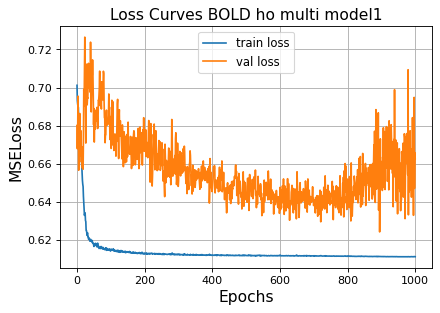

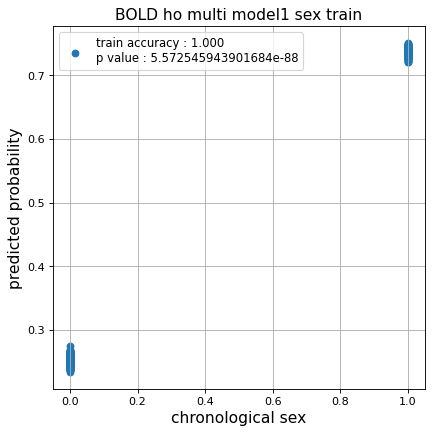

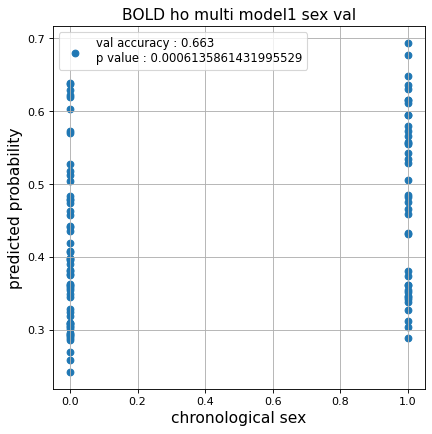

Kfold: 5 ::: epoch: 100, loss: 0.6144787623332097, val loss: 0.6883468627929688
Kfold: 5 ::: epoch: 200, loss: 0.6123791612111605, val loss: 0.6686366945505142
Kfold: 5 ::: epoch: 300, loss: 0.6120223586375897, val loss: 0.6672779768705368
Kfold: 5 ::: epoch: 400, loss: 0.611813444357652, val loss: 0.6487915366888046
Kfold: 5 ::: epoch: 500, loss: 0.6119104027748108, val loss: 0.6481110900640488
Kfold: 5 ::: epoch: 600, loss: 0.6114642803485577, val loss: 0.6472868174314499
Kfold: 5 ::: epoch: 700, loss: 0.6113941027567937, val loss: 0.6424677819013596
Kfold: 5 ::: epoch: 800, loss: 0.6113463915311373, val loss: 0.6417716592550278
Kfold: 5 ::: epoch: 900, loss: 0.6111566286820632, val loss: 0.6249754130840302
Kfold: 5 ::: epoch: 1000, loss: 0.6110614721591656, val loss: 0.6192345768213272
save_epochs:982
best val loss:0.6160586625337601


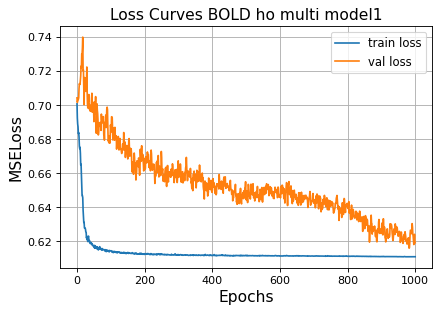

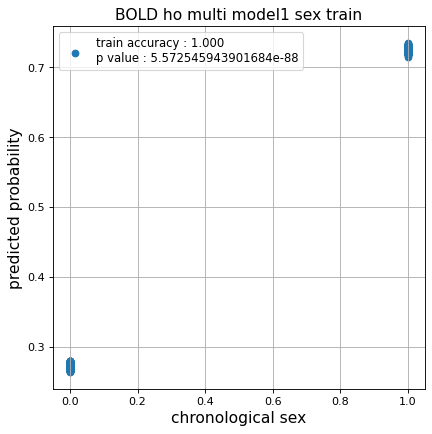

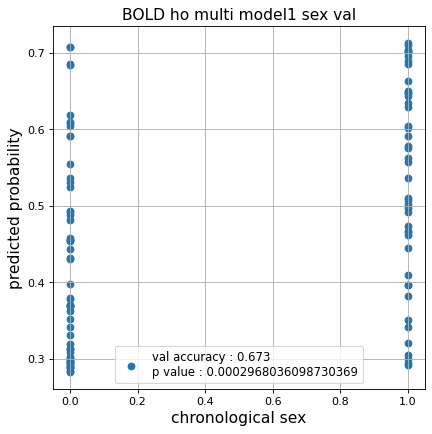

Nested Kfold ::: 4
Kfold: 1 ::: epoch: 100, loss: 0.6148918133515578, val loss: 0.624629944562912
Kfold: 1 ::: epoch: 200, loss: 0.6128150408084576, val loss: 0.6209549307823181
Kfold: 1 ::: epoch: 300, loss: 0.6121778121361365, val loss: 0.6133716255426407
Kfold: 1 ::: epoch: 400, loss: 0.6119279815600469, val loss: 0.6137546747922897
early stopping
save_epochs:273
best val loss:0.6021589636802673


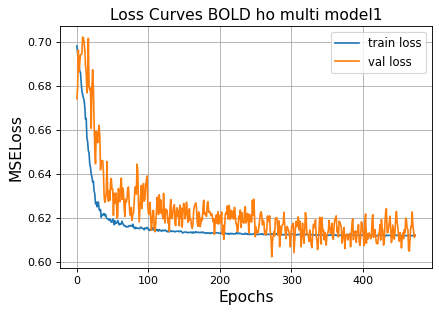

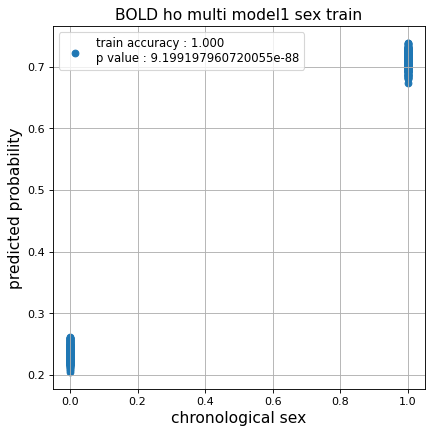

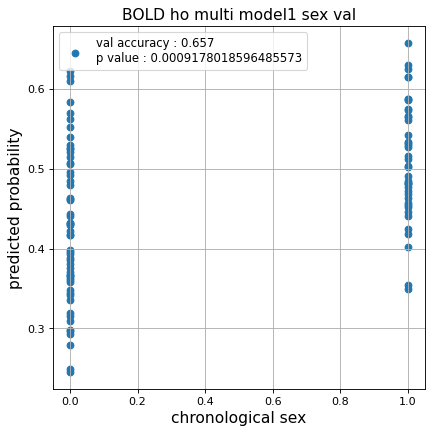

Kfold: 2 ::: epoch: 100, loss: 0.6155337416208707, val loss: 0.6142719686031342
Kfold: 2 ::: epoch: 200, loss: 0.6127891127879803, val loss: 0.6167036443948746
Kfold: 2 ::: epoch: 300, loss: 0.6121687293052673, val loss: 0.6225786358118057
Kfold: 2 ::: epoch: 400, loss: 0.6118404085819538, val loss: 0.6240287274122238
early stopping
save_epochs:208
best val loss:0.610833078622818


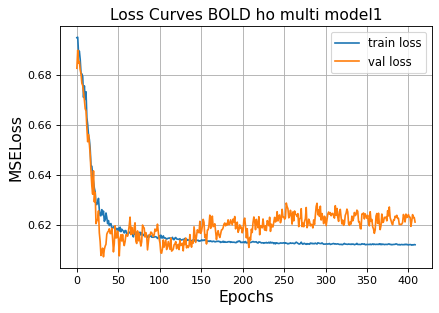

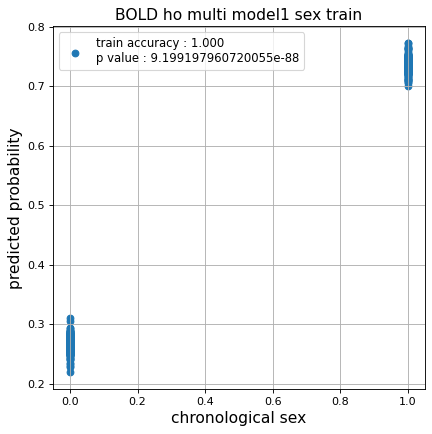

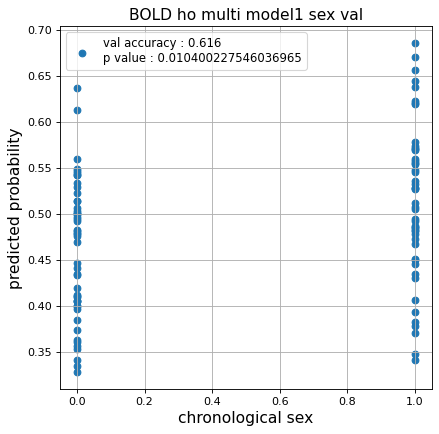

Kfold: 3 ::: epoch: 100, loss: 0.6143403878578773, val loss: 0.655277207493782
Kfold: 3 ::: epoch: 200, loss: 0.6127382471011236, val loss: 0.6352863907814026
Kfold: 3 ::: epoch: 300, loss: 0.6121899668986981, val loss: 0.6325128376483917
Kfold: 3 ::: epoch: 400, loss: 0.6118669372338515, val loss: 0.6340271383523941
Kfold: 3 ::: epoch: 500, loss: 0.6116601962309617, val loss: 0.6420188844203949
early stopping
save_epochs:351
best val loss:0.6230997294187546


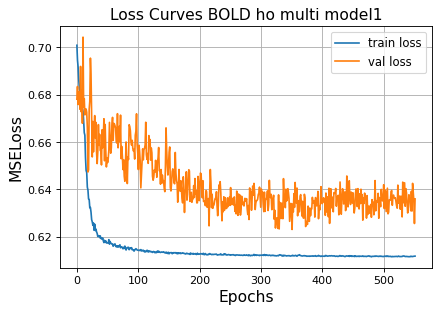

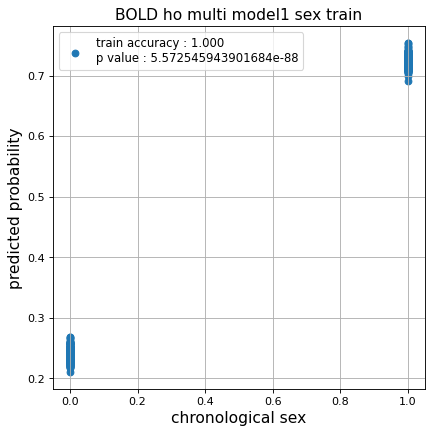

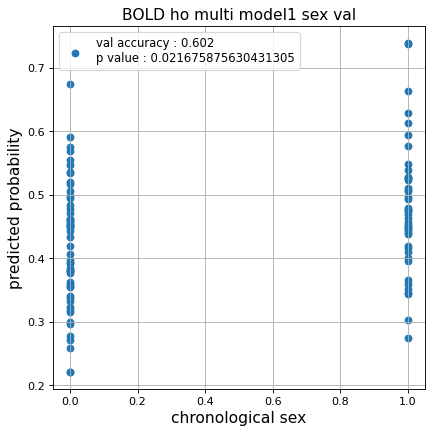

Kfold: 4 ::: epoch: 100, loss: 0.6144049901228684, val loss: 0.6719854176044464
Kfold: 4 ::: epoch: 200, loss: 0.6127584026410029, val loss: 0.6528414040803909
Kfold: 4 ::: epoch: 300, loss: 0.6122556420472952, val loss: 0.6495877802371979
Kfold: 4 ::: epoch: 400, loss: 0.611931351514963, val loss: 0.6404183804988861
Kfold: 4 ::: epoch: 500, loss: 0.6118778311289274, val loss: 0.6441313922405243
Kfold: 4 ::: epoch: 600, loss: 0.6116952162522536, val loss: 0.6275792568922043
Kfold: 4 ::: epoch: 700, loss: 0.6114970583182114, val loss: 0.6145688891410828
Kfold: 4 ::: epoch: 800, loss: 0.6112231428806598, val loss: 0.598169207572937
Kfold: 4 ::: epoch: 900, loss: 0.6110951717083271, val loss: 0.5760695189237595
Kfold: 4 ::: epoch: 1000, loss: 0.6110480977938726, val loss: 0.56816066801548
save_epochs:1000
best val loss:0.56816066801548


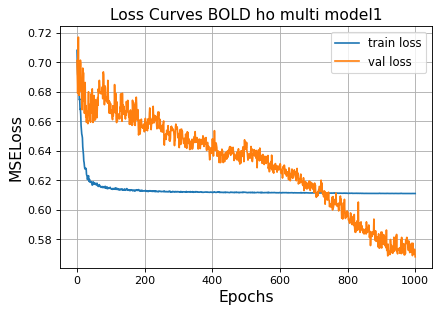

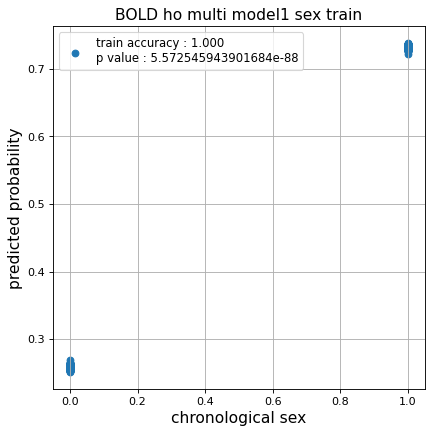

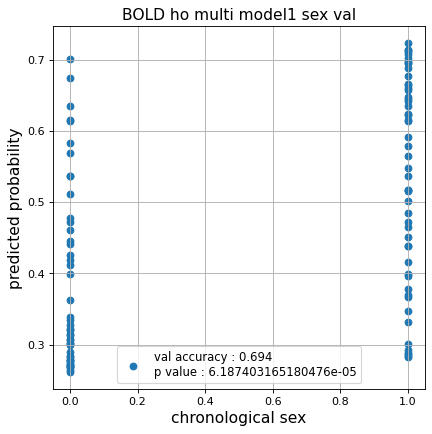

Kfold: 5 ::: epoch: 100, loss: 0.6143839267583994, val loss: 0.6204058676958084
Kfold: 5 ::: epoch: 200, loss: 0.61238255409094, val loss: 0.6116729378700256
Kfold: 5 ::: epoch: 300, loss: 0.6121096290074862, val loss: 0.6056828796863556
Kfold: 5 ::: epoch: 400, loss: 0.6118457225652841, val loss: 0.594633013010025
Kfold: 5 ::: epoch: 500, loss: 0.6118756028322073, val loss: 0.5944461226463318
early stopping
save_epochs:389
best val loss:0.5867143422365189


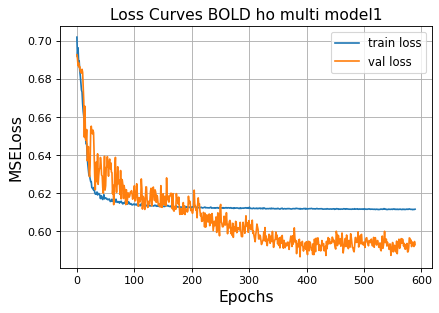

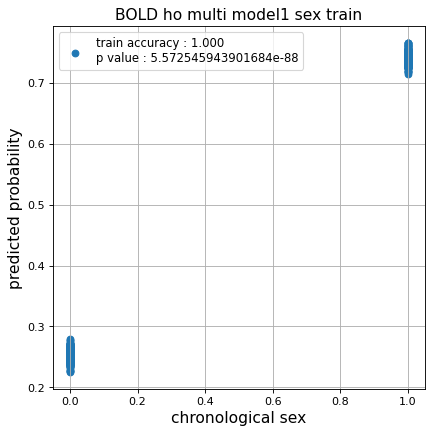

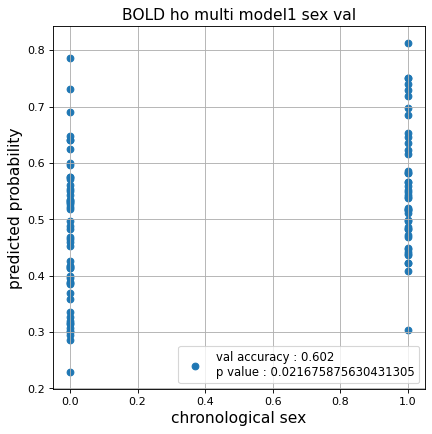

Nested Kfold ::: 5
Kfold: 1 ::: epoch: 100, loss: 0.6142062819921054, val loss: 0.634682759642601
Kfold: 1 ::: epoch: 200, loss: 0.6128653792234567, val loss: 0.6218210607767105
Kfold: 1 ::: epoch: 300, loss: 0.6123273739447961, val loss: 0.6150987297296524
Kfold: 1 ::: epoch: 400, loss: 0.6118700825251066, val loss: 0.6223893314599991
Kfold: 1 ::: epoch: 500, loss: 0.6118569465783926, val loss: 0.615477055311203
Kfold: 1 ::: epoch: 600, loss: 0.6114562153816223, val loss: 0.613999679684639
Kfold: 1 ::: epoch: 700, loss: 0.6115099787712097, val loss: 0.612100750207901
Kfold: 1 ::: epoch: 800, loss: 0.6113272767800552, val loss: 0.6011251211166382
Kfold: 1 ::: epoch: 900, loss: 0.6111419705244211, val loss: 0.5838818252086639
Kfold: 1 ::: epoch: 1000, loss: 0.6110428113203782, val loss: 0.5787922590970993
save_epochs:958
best val loss:0.5756387114524841


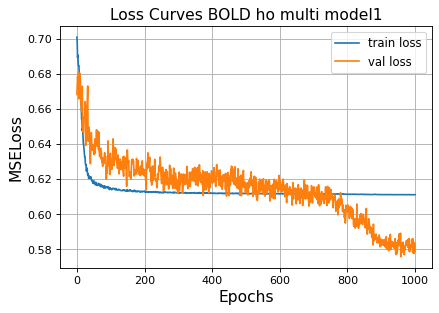

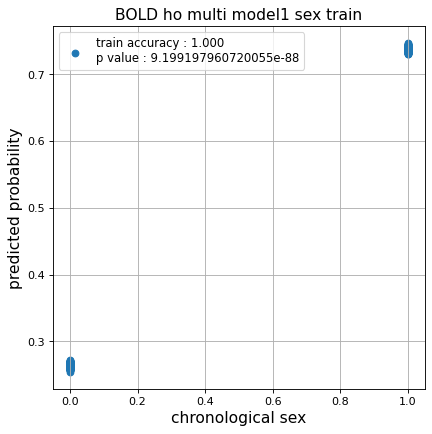

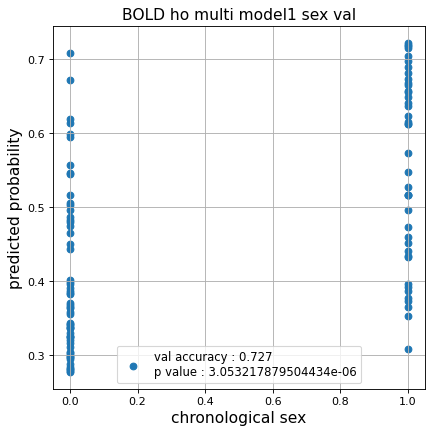

Kfold: 2 ::: epoch: 100, loss: 0.6142797286693866, val loss: 0.6240845769643784
Kfold: 2 ::: epoch: 200, loss: 0.6130342483520508, val loss: 0.6100404933094978
Kfold: 2 ::: epoch: 300, loss: 0.612179146363185, val loss: 0.6021703258156776
Kfold: 2 ::: epoch: 400, loss: 0.6118892935606149, val loss: 0.5942712724208832
Kfold: 2 ::: epoch: 500, loss: 0.6118536408130939, val loss: 0.5949215739965439
Kfold: 2 ::: epoch: 600, loss: 0.6116995536364042, val loss: 0.5877113044261932
Kfold: 2 ::: epoch: 700, loss: 0.6115040595714862, val loss: 0.5856943503022194
Kfold: 2 ::: epoch: 800, loss: 0.6113896782581623, val loss: 0.5822135582566261
Kfold: 2 ::: epoch: 900, loss: 0.6111646340443537, val loss: 0.5522572472691536
Kfold: 2 ::: epoch: 1000, loss: 0.6110248519824102, val loss: 0.5365897789597511
save_epochs:990
best val loss:0.530263788998127


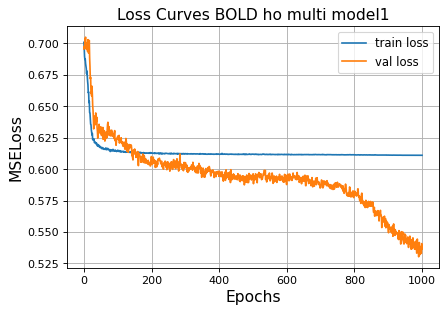

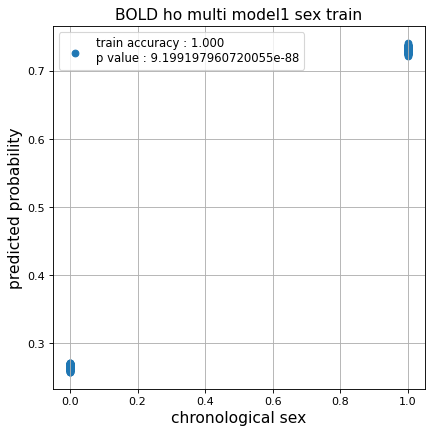

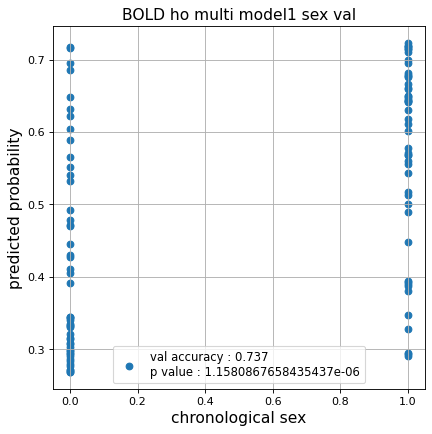

Kfold: 3 ::: epoch: 100, loss: 0.614560970893273, val loss: 0.6371092200279236
Kfold: 3 ::: epoch: 200, loss: 0.6129459463633024, val loss: 0.6154160797595978
Kfold: 3 ::: epoch: 300, loss: 0.6122420109235324, val loss: 0.6077780276536942
Kfold: 3 ::: epoch: 400, loss: 0.6118876796502334, val loss: 0.6094447523355484
Kfold: 3 ::: epoch: 500, loss: 0.6117536242191608, val loss: 0.6068763583898544
early stopping
save_epochs:304
best val loss:0.5988059863448143


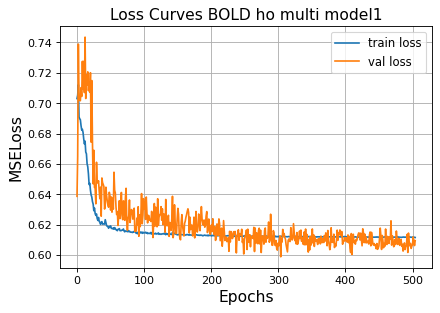

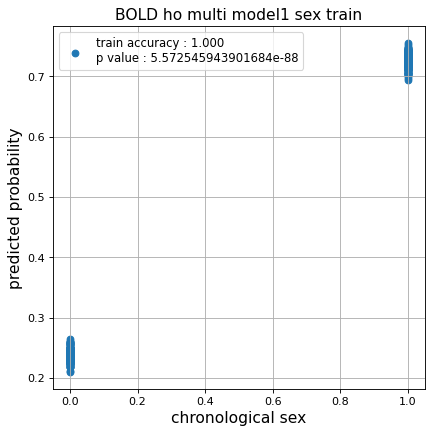

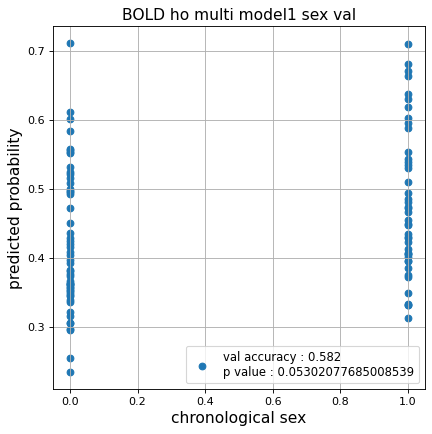

Kfold: 4 ::: epoch: 100, loss: 0.6138074031242957, val loss: 0.6552653312683105
Kfold: 4 ::: epoch: 200, loss: 0.612811395755181, val loss: 0.630038321018219
Kfold: 4 ::: epoch: 300, loss: 0.6121765008339515, val loss: 0.6263277381658554
Kfold: 4 ::: epoch: 400, loss: 0.611894089442033, val loss: 0.6272755563259125
Kfold: 4 ::: epoch: 500, loss: 0.6120206438578092, val loss: 0.6317622661590576
Kfold: 4 ::: epoch: 600, loss: 0.611516365638146, val loss: 0.6222130507230759
Kfold: 4 ::: epoch: 700, loss: 0.6114782874400799, val loss: 0.6211299896240234
Kfold: 4 ::: epoch: 800, loss: 0.6111141810050378, val loss: 0.6232496500015259
Kfold: 4 ::: epoch: 900, loss: 0.6110069384941688, val loss: 0.6325845867395401
early stopping
save_epochs:744
best val loss:0.601881131529808


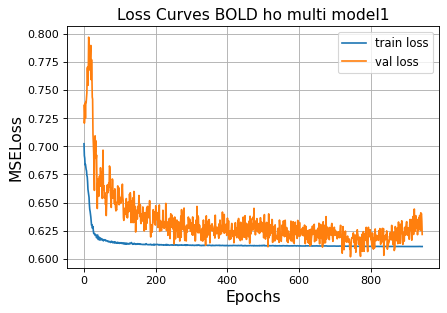

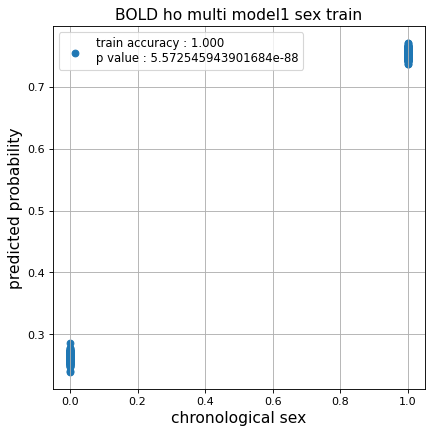

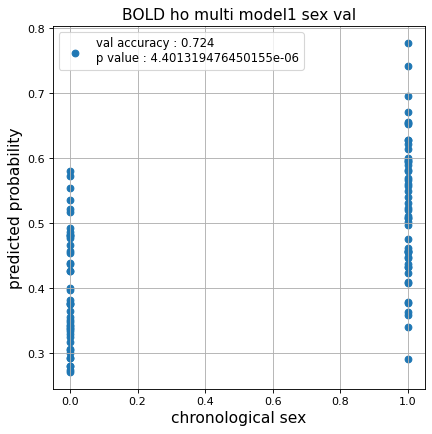

Kfold: 5 ::: epoch: 100, loss: 0.6146793182079608, val loss: 0.6612917482852936
Kfold: 5 ::: epoch: 200, loss: 0.6131223577719468, val loss: 0.6502076834440231
Kfold: 5 ::: epoch: 300, loss: 0.6121519987399762, val loss: 0.6319229453802109
Kfold: 5 ::: epoch: 400, loss: 0.6117920646300683, val loss: 0.6269065141677856
Kfold: 5 ::: epoch: 500, loss: 0.6112603682738084, val loss: 0.6425551623106003
Kfold: 5 ::: epoch: 600, loss: 0.6111438824580266, val loss: 0.638724759221077
Kfold: 5 ::: epoch: 700, loss: 0.6111112878872798, val loss: 0.6505638062953949
Kfold: 5 ::: epoch: 800, loss: 0.6110344666701096, val loss: 0.6218480318784714
early stopping
save_epochs:626
best val loss:0.616424635052681


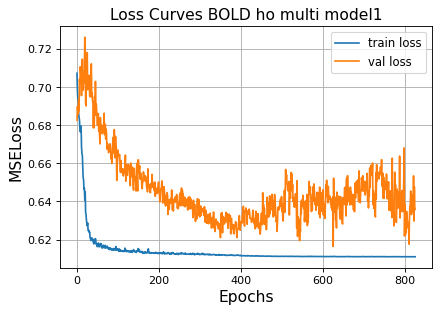

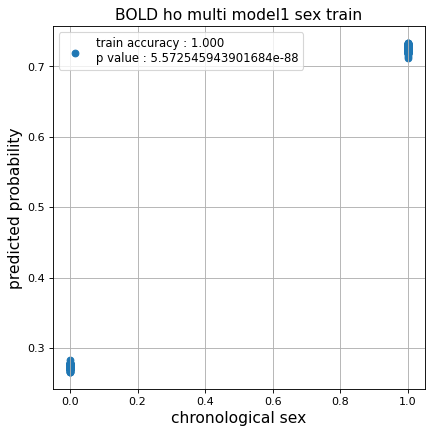

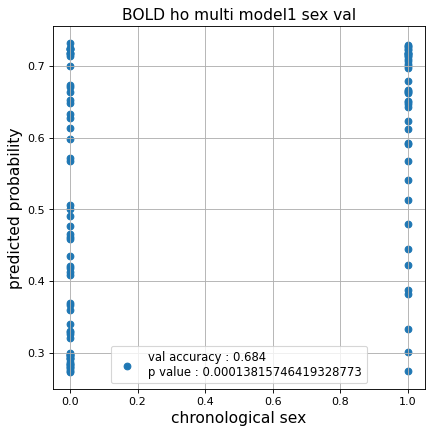

CPU times: user 1h 51min 39s, sys: 14min 55s, total: 2h 6min 35s
Wall time: 2h 6min 45s


In [ ]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_ho_1  = []
test_pred_ho_corrected_1  = []
test_label_ho_1 = []
test_idx_ho_1   = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_ho)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_corrected,test_label = train_model(data_ho,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 1000,
                                                           d_model    = 256,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 1024,
                                                           nhead      = 32,
                                                           hidden_dim_transformer = 2,
                                                           pos_drop    = 0.1,
                                                           trans_drop = 0.2,
                                                           fc_drop = 0.1,
                                                           title = 'ROI ho multi model1'
                                                          )
    
    test_pred_ho_1.append(test_pred)
    test_pred_ho_corrected_1.append(test_pred_corrected)
    test_label_ho_1.append(test_label)
    test_idx_ho_1.append(test_idx)

### ROI 2

Nested Kfold ::: 1
Kfold: 1 ::: epoch: 100, loss: 0.61743930211434, val loss: 0.7669696360826492
Kfold: 1 ::: epoch: 200, loss: 0.6144215372892526, val loss: 0.7239504009485245
Kfold: 1 ::: epoch: 300, loss: 0.6129204172354478, val loss: 0.6938328593969345
Kfold: 1 ::: epoch: 400, loss: 0.612540405530196, val loss: 0.6878311038017273
Kfold: 1 ::: epoch: 500, loss: 0.6121919842866751, val loss: 0.6778097450733185
Kfold: 1 ::: epoch: 600, loss: 0.6121249519861661, val loss: 0.6719591617584229
Kfold: 1 ::: epoch: 700, loss: 0.6119395402761606, val loss: 0.6602874547243118
Kfold: 1 ::: epoch: 800, loss: 0.6118712104283847, val loss: 0.6667998433113098
Kfold: 1 ::: epoch: 900, loss: 0.6116210497342623, val loss: 0.6652554273605347
Kfold: 1 ::: epoch: 1000, loss: 0.6116754091702975, val loss: 0.661043331027031
save_epochs:971
best val loss:0.6561139225959778


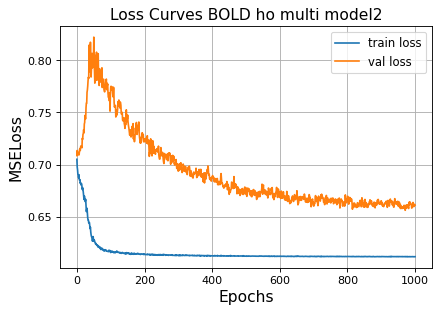

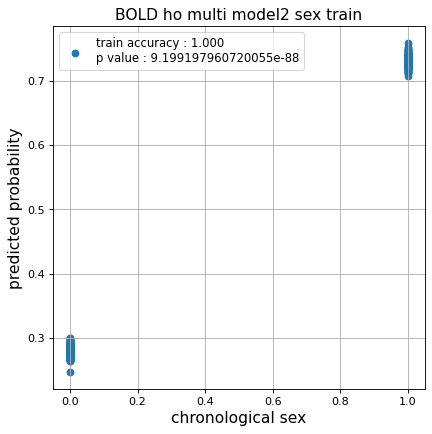

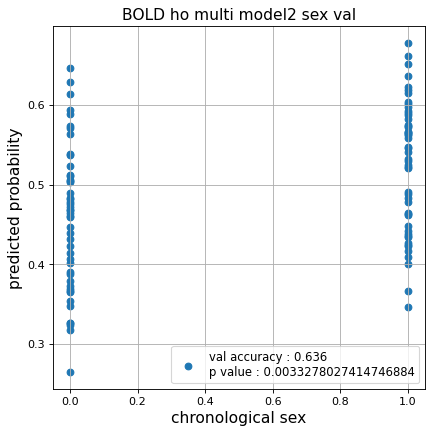

Kfold: 2 ::: epoch: 100, loss: 0.6175764111372141, val loss: 0.6907384246587753
Kfold: 2 ::: epoch: 200, loss: 0.6144499228550837, val loss: 0.6792141646146774
Kfold: 2 ::: epoch: 300, loss: 0.6134756436714759, val loss: 0.6665881425142288
Kfold: 2 ::: epoch: 400, loss: 0.6126573131634638, val loss: 0.664748340845108
Kfold: 2 ::: epoch: 500, loss: 0.6124661473127512, val loss: 0.6621816605329514
Kfold: 2 ::: epoch: 600, loss: 0.6120500289476835, val loss: 0.6601534783840179
Kfold: 2 ::: epoch: 700, loss: 0.6119482792340792, val loss: 0.6608388870954514
Kfold: 2 ::: epoch: 800, loss: 0.6118025412926307, val loss: 0.6533041596412659
Kfold: 2 ::: epoch: 900, loss: 0.6116891457484319, val loss: 0.6482542008161545
Kfold: 2 ::: epoch: 1000, loss: 0.6115582631184504, val loss: 0.6403612196445465
save_epochs:969
best val loss:0.6379351913928986


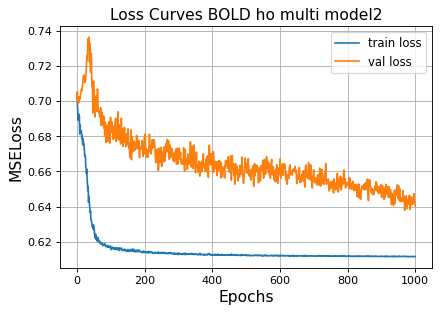

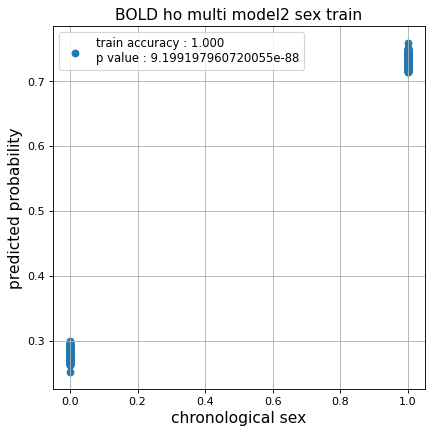

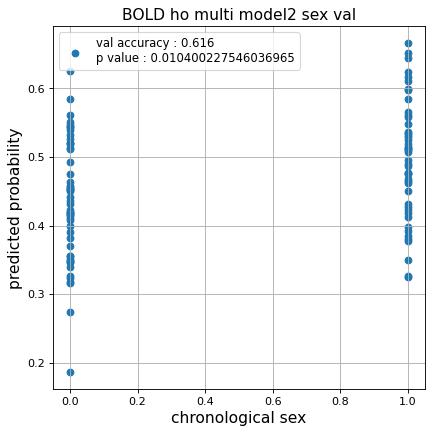

Kfold: 3 ::: epoch: 100, loss: 0.6163862210053664, val loss: 0.6379473656415939
Kfold: 3 ::: epoch: 200, loss: 0.6143112503565274, val loss: 0.6297883987426758
Kfold: 3 ::: epoch: 300, loss: 0.6131745989506061, val loss: 0.629943236708641
Kfold: 3 ::: epoch: 400, loss: 0.612636359838339, val loss: 0.6314723491668701
Kfold: 3 ::: epoch: 500, loss: 0.6124977515294001, val loss: 0.6285921186208725
Kfold: 3 ::: epoch: 600, loss: 0.6120892488039457, val loss: 0.6215998977422714
Kfold: 3 ::: epoch: 700, loss: 0.6119338549100436, val loss: 0.6185441017150879
Kfold: 3 ::: epoch: 800, loss: 0.6116650425470792, val loss: 0.6209713071584702
Kfold: 3 ::: epoch: 900, loss: 0.6114792273594782, val loss: 0.6153205633163452
Kfold: 3 ::: epoch: 1000, loss: 0.6111813279298636, val loss: 0.6047490984201431
save_epochs:998
best val loss:0.5991467088460922


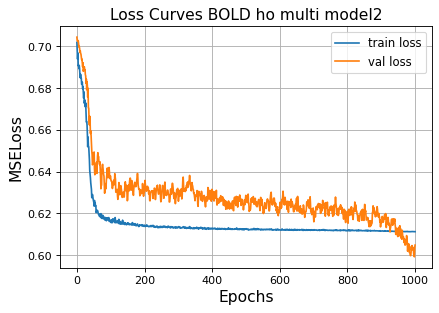

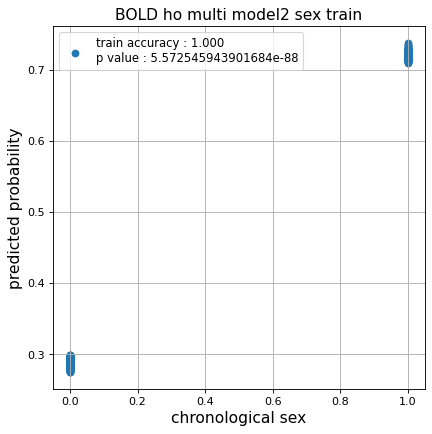

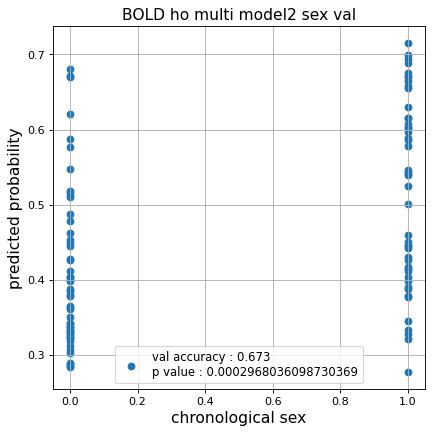

Kfold: 4 ::: epoch: 100, loss: 0.6166083033268268, val loss: 0.6636077165603638
Kfold: 4 ::: epoch: 200, loss: 0.6136799729787387, val loss: 0.6579366326332092
Kfold: 4 ::: epoch: 300, loss: 0.6130402867610638, val loss: 0.6561838984489441
Kfold: 4 ::: epoch: 400, loss: 0.612515715452341, val loss: 0.648139238357544
Kfold: 4 ::: epoch: 500, loss: 0.6121810262019818, val loss: 0.6391940414905548
Kfold: 4 ::: epoch: 600, loss: 0.6120114234777597, val loss: 0.635730430483818
Kfold: 4 ::: epoch: 700, loss: 0.6118552455535302, val loss: 0.6369324028491974
Kfold: 4 ::: epoch: 800, loss: 0.6116885772118201, val loss: 0.63938108086586
Kfold: 4 ::: epoch: 900, loss: 0.6117058258790237, val loss: 0.6362311393022537
Kfold: 4 ::: epoch: 1000, loss: 0.6115608307031485, val loss: 0.6327311396598816
save_epochs:840
best val loss:0.6171761155128479


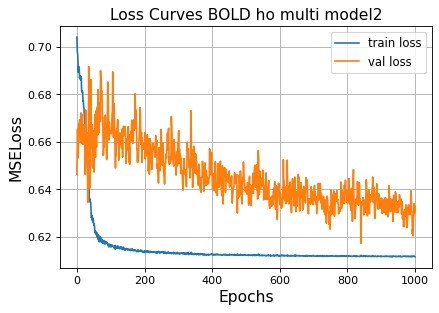

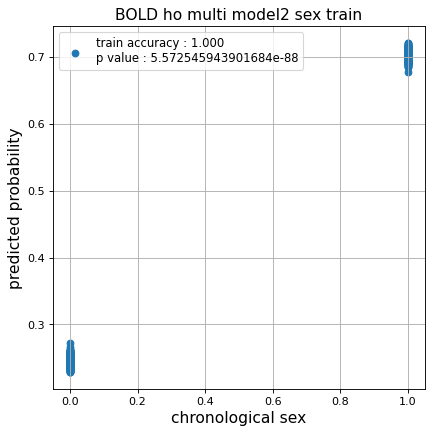

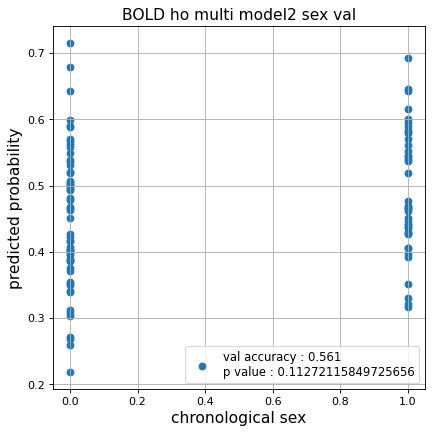

Kfold: 5 ::: epoch: 100, loss: 0.6159329185119042, val loss: 0.6907916963100433
Kfold: 5 ::: epoch: 200, loss: 0.6135161381501418, val loss: 0.6785002797842026
Kfold: 5 ::: epoch: 300, loss: 0.6131437420845032, val loss: 0.6610842496156693
Kfold: 5 ::: epoch: 400, loss: 0.6123629028980548, val loss: 0.6408449411392212
Kfold: 5 ::: epoch: 500, loss: 0.6120944848427405, val loss: 0.6407544612884521
Kfold: 5 ::: epoch: 600, loss: 0.6120263704886804, val loss: 0.6325673907995224
Kfold: 5 ::: epoch: 700, loss: 0.6118462085723877, val loss: 0.626594752073288
Kfold: 5 ::: epoch: 800, loss: 0.6117389156268194, val loss: 0.6274485439062119
Kfold: 5 ::: epoch: 900, loss: 0.6117162200120779, val loss: 0.6216073110699654
Kfold: 5 ::: epoch: 1000, loss: 0.6116471336438105, val loss: 0.6214686408638954
save_epochs:975
best val loss:0.6148340478539467


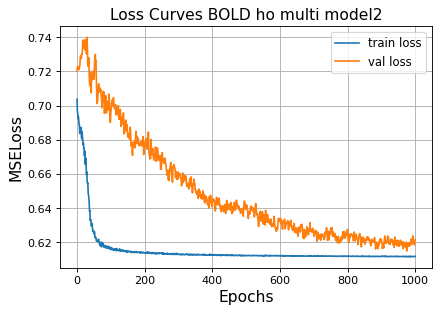

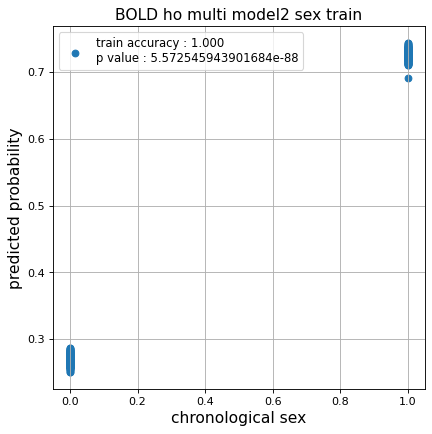

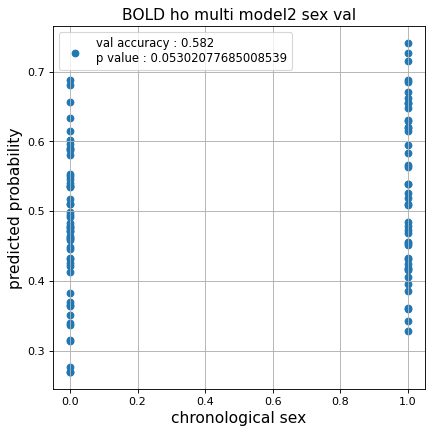

Nested Kfold ::: 2
Kfold: 1 ::: epoch: 100, loss: 0.6173464197378892, val loss: 0.6970110684633255
Kfold: 1 ::: epoch: 200, loss: 0.6145190871678866, val loss: 0.6706340909004211
Kfold: 1 ::: epoch: 300, loss: 0.6130554584356455, val loss: 0.6510334014892578
Kfold: 1 ::: epoch: 400, loss: 0.612727912572714, val loss: 0.6369112432003021
Kfold: 1 ::: epoch: 500, loss: 0.6122231254210839, val loss: 0.6309873759746552
Kfold: 1 ::: epoch: 600, loss: 0.6119546248362615, val loss: 0.6279049515724182
Kfold: 1 ::: epoch: 700, loss: 0.6119869076288663, val loss: 0.630045622587204
Kfold: 1 ::: epoch: 800, loss: 0.6118833285111648, val loss: 0.630320280790329
Kfold: 1 ::: epoch: 900, loss: 0.6116333649708674, val loss: 0.619183361530304
Kfold: 1 ::: epoch: 1000, loss: 0.6116283902755151, val loss: 0.6248409599065781
save_epochs:928
best val loss:0.6150536090135574


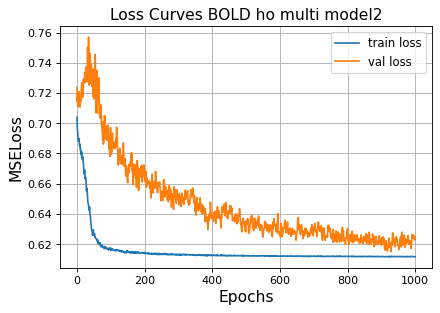

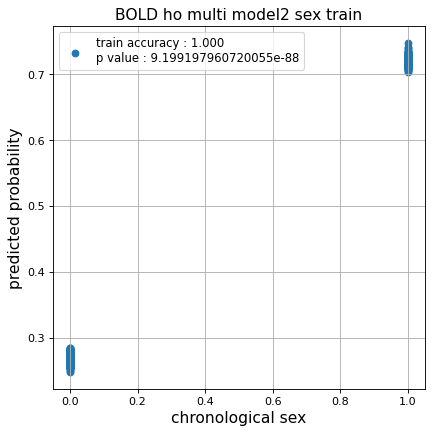

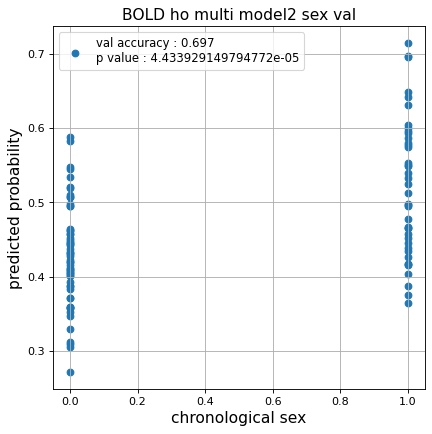

Kfold: 2 ::: epoch: 100, loss: 0.6169960865607629, val loss: 0.6872144341468811
Kfold: 2 ::: epoch: 200, loss: 0.6139678634130038, val loss: 0.6594074666500092
Kfold: 2 ::: epoch: 300, loss: 0.6132232455106882, val loss: 0.6446432918310165
Kfold: 2 ::: epoch: 400, loss: 0.6124086242455703, val loss: 0.6387101113796234
Kfold: 2 ::: epoch: 500, loss: 0.6124126223417429, val loss: 0.6331439316272736
Kfold: 2 ::: epoch: 600, loss: 0.6118737596731919, val loss: 0.634036660194397
Kfold: 2 ::: epoch: 700, loss: 0.6120211344498855, val loss: 0.629288524389267
Kfold: 2 ::: epoch: 800, loss: 0.6116153735380906, val loss: 0.6262255012989044
Kfold: 2 ::: epoch: 900, loss: 0.6116218658593985, val loss: 0.6226150989532471
Kfold: 2 ::: epoch: 1000, loss: 0.611405611038208, val loss: 0.6104861199855804
save_epochs:985
best val loss:0.5981098636984825


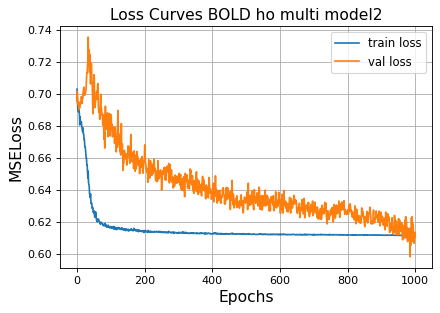

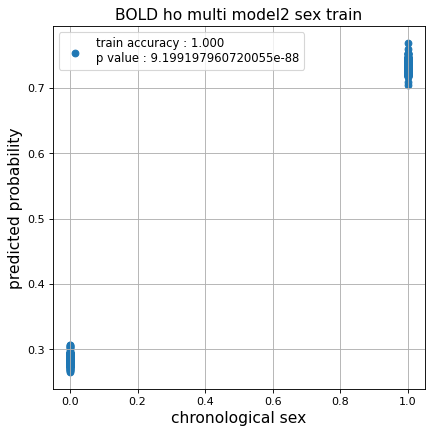

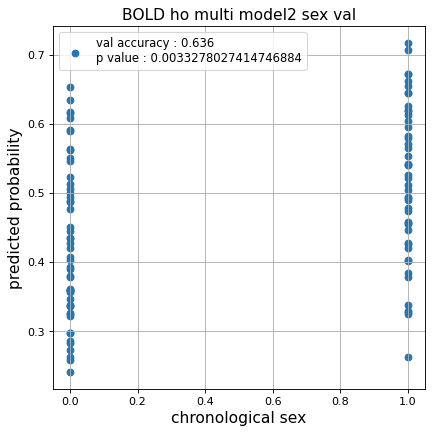

Kfold: 3 ::: epoch: 100, loss: 0.6183982032995957, val loss: 0.6540816873311996
Kfold: 3 ::: epoch: 200, loss: 0.6144496156619146, val loss: 0.6537475883960724
Kfold: 3 ::: epoch: 300, loss: 0.6130072015982407, val loss: 0.6457125544548035
Kfold: 3 ::: epoch: 400, loss: 0.6127525338759789, val loss: 0.6492376178503036
Kfold: 3 ::: epoch: 500, loss: 0.61271110864786, val loss: 0.6401960402727127
Kfold: 3 ::: epoch: 600, loss: 0.6120343345862168, val loss: 0.6415889412164688
Kfold: 3 ::: epoch: 700, loss: 0.6119493796275213, val loss: 0.636644259095192
early stopping
save_epochs:507
best val loss:0.6350253373384476


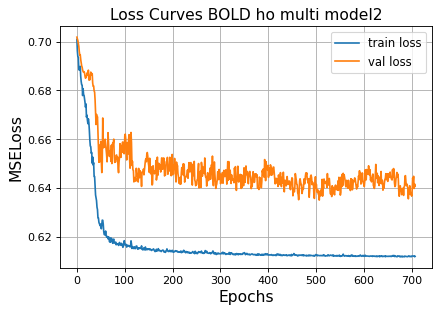

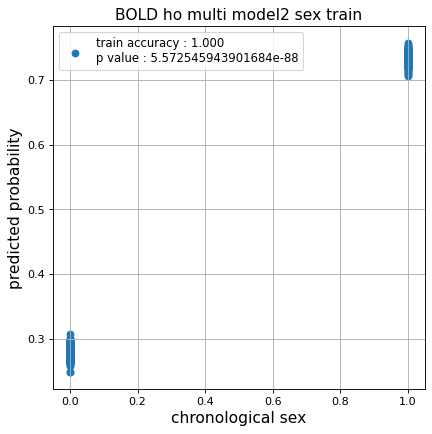

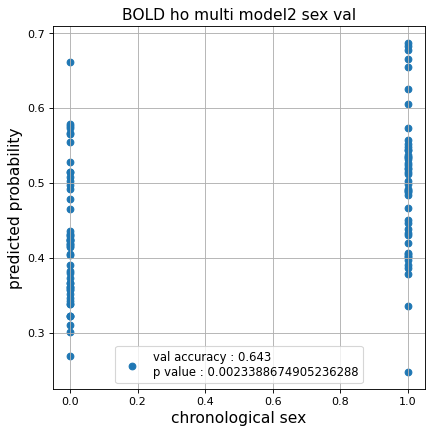

Kfold: 4 ::: epoch: 100, loss: 0.6166806587806115, val loss: 0.6766132712364197
Kfold: 4 ::: epoch: 200, loss: 0.6137994757065406, val loss: 0.6704295426607132
Kfold: 4 ::: epoch: 300, loss: 0.6133370078527011, val loss: 0.6455124467611313
Kfold: 4 ::: epoch: 400, loss: 0.6123720224087055, val loss: 0.6521956920623779
Kfold: 4 ::: epoch: 500, loss: 0.6122481822967529, val loss: 0.6434860378503799
Kfold: 4 ::: epoch: 600, loss: 0.6117333494699918, val loss: 0.6466645747423172
Kfold: 4 ::: epoch: 700, loss: 0.6112449581806476, val loss: 0.6532495468854904
early stopping
save_epochs:545
best val loss:0.6319481879472733


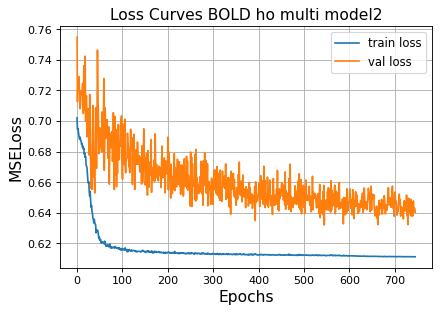

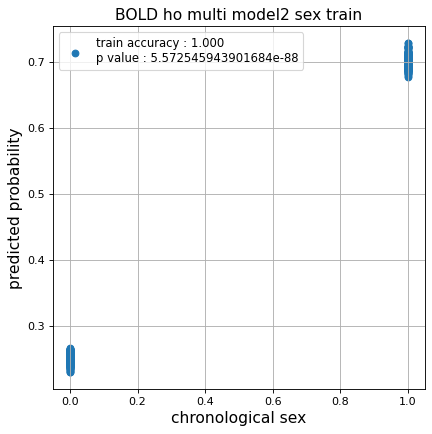

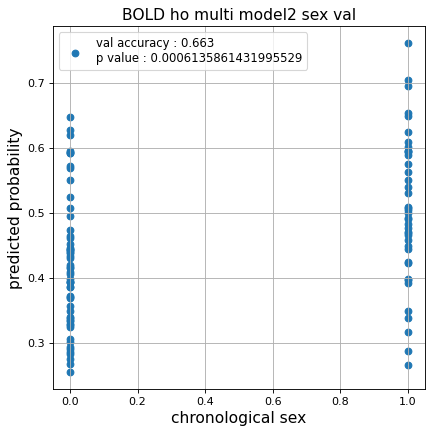

Kfold: 5 ::: epoch: 100, loss: 0.6167275584661044, val loss: 0.6525382846593857
Kfold: 5 ::: epoch: 200, loss: 0.6139781796015226, val loss: 0.6383056044578552
Kfold: 5 ::: epoch: 300, loss: 0.6133430875264682, val loss: 0.6398104876279831
Kfold: 5 ::: epoch: 400, loss: 0.6126107711058396, val loss: 0.6297379434108734
Kfold: 5 ::: epoch: 500, loss: 0.612236527296213, val loss: 0.6295149028301239
Kfold: 5 ::: epoch: 600, loss: 0.6118574188305781, val loss: 0.6260529309511185
Kfold: 5 ::: epoch: 700, loss: 0.6112635777546809, val loss: 0.6073256582021713
Kfold: 5 ::: epoch: 800, loss: 0.6110508946272043, val loss: 0.5941997617483139
Kfold: 5 ::: epoch: 900, loss: 0.6109896577321566, val loss: 0.5850692838430405
Kfold: 5 ::: epoch: 1000, loss: 0.6109612538264348, val loss: 0.5932324752211571
save_epochs:978
best val loss:0.57773357629776


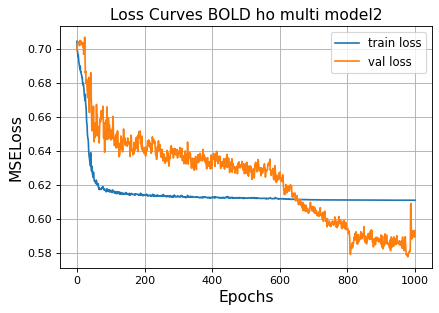

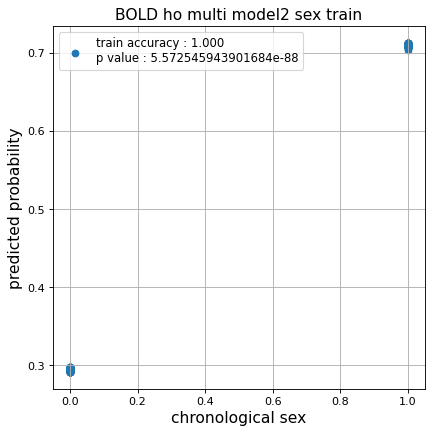

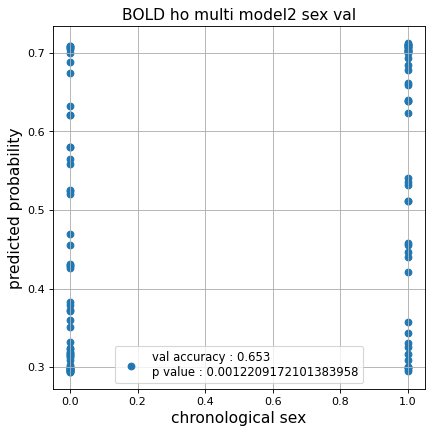

Nested Kfold ::: 3
Kfold: 1 ::: epoch: 100, loss: 0.6173667861865118, val loss: 0.7166559994220734
Kfold: 1 ::: epoch: 200, loss: 0.6140703008725092, val loss: 0.6932877451181412
Kfold: 1 ::: epoch: 300, loss: 0.6129266573832586, val loss: 0.678669199347496
Kfold: 1 ::: epoch: 400, loss: 0.6125866770744324, val loss: 0.6630615144968033
Kfold: 1 ::: epoch: 500, loss: 0.6121279413883502, val loss: 0.6569103896617889
Kfold: 1 ::: epoch: 600, loss: 0.6121190373714154, val loss: 0.6468964219093323
Kfold: 1 ::: epoch: 700, loss: 0.6120260678804837, val loss: 0.6482771784067154
early stopping
save_epochs:578
best val loss:0.6402441263198853


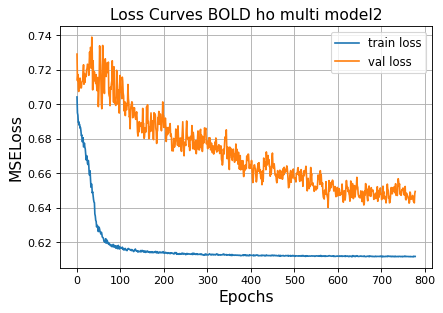

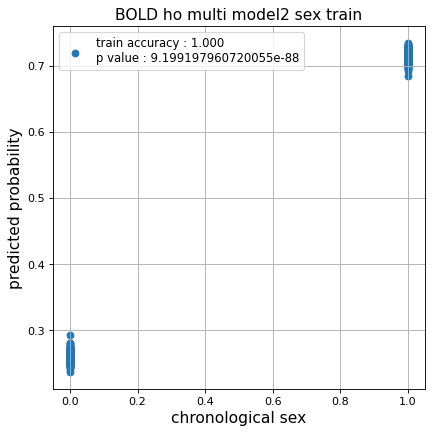

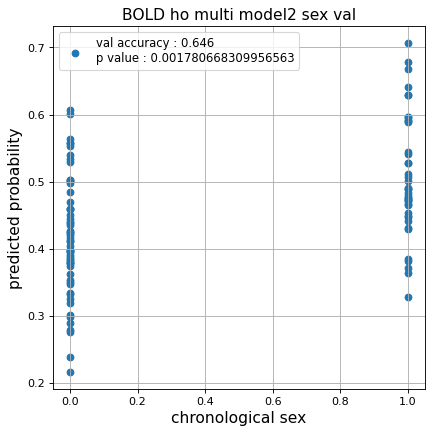

Kfold: 2 ::: epoch: 100, loss: 0.6159892128064082, val loss: 0.6131160408258438
Kfold: 2 ::: epoch: 200, loss: 0.6136128719036396, val loss: 0.6095689237117767
Kfold: 2 ::: epoch: 300, loss: 0.6134542043392475, val loss: 0.6037200540304184
Kfold: 2 ::: epoch: 400, loss: 0.6125195668293879, val loss: 0.6101565659046173
early stopping
save_epochs:286
best val loss:0.5971199870109558


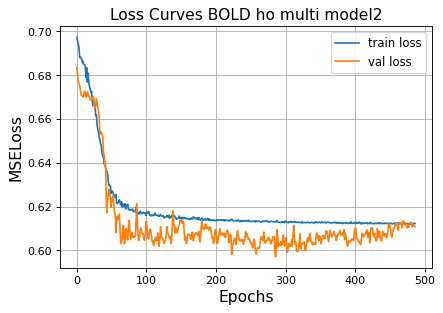

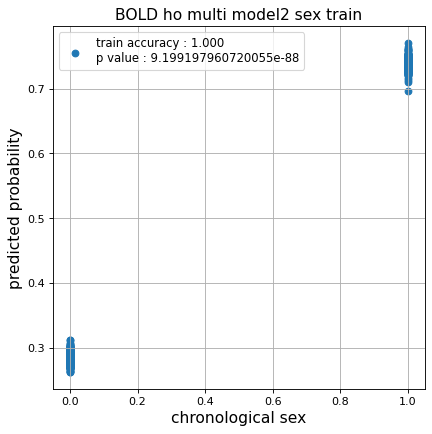

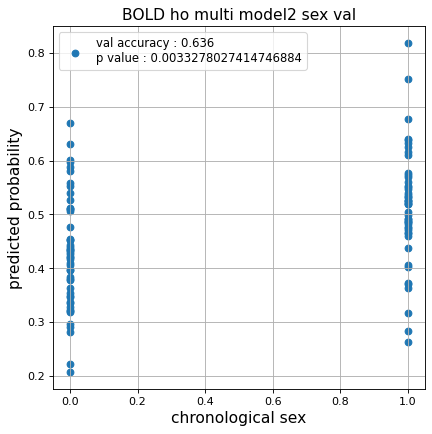

Kfold: 3 ::: epoch: 100, loss: 0.6160940344517047, val loss: 0.753875344991684
Kfold: 3 ::: epoch: 200, loss: 0.6140546936255235, val loss: 0.7253784984350204
Kfold: 3 ::: epoch: 300, loss: 0.613367919738476, val loss: 0.7131611555814743
Kfold: 3 ::: epoch: 400, loss: 0.6126277767694913, val loss: 0.7038406729698181
Kfold: 3 ::: epoch: 500, loss: 0.6127127638229957, val loss: 0.7025153785943985
Kfold: 3 ::: epoch: 600, loss: 0.6119177708258996, val loss: 0.6860080808401108
Kfold: 3 ::: epoch: 700, loss: 0.6119329700103173, val loss: 0.6842990815639496
Kfold: 3 ::: epoch: 800, loss: 0.6117882453478299, val loss: 0.6839989274740219
Kfold: 3 ::: epoch: 900, loss: 0.6116542953711289, val loss: 0.6835847795009613
early stopping
save_epochs:783
best val loss:0.676124781370163


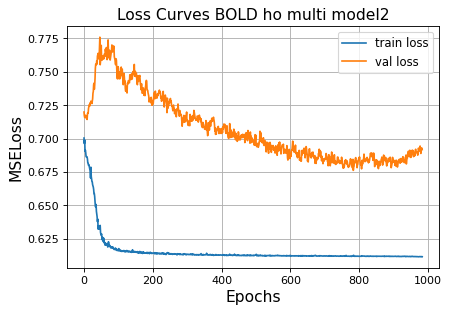

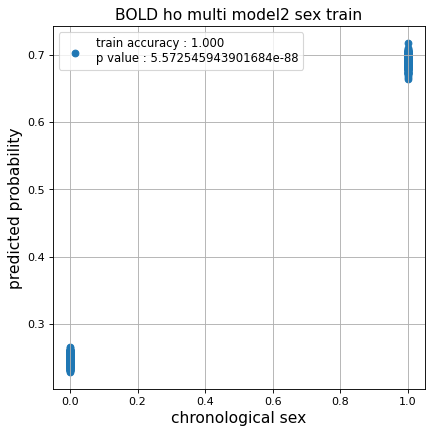

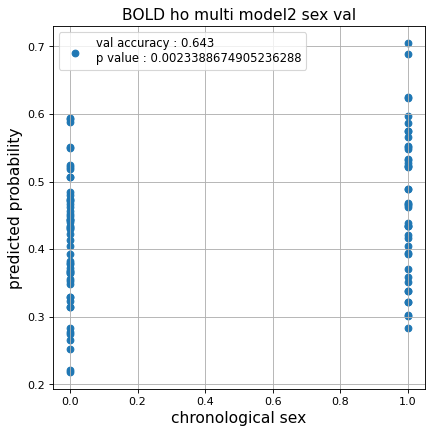

Kfold: 4 ::: epoch: 100, loss: 0.6154246146862323, val loss: 0.6920475363731384
Kfold: 4 ::: epoch: 200, loss: 0.6135930235569294, val loss: 0.6768667548894882
Kfold: 4 ::: epoch: 300, loss: 0.6126947127855741, val loss: 0.6827148348093033
Kfold: 4 ::: epoch: 400, loss: 0.612281845166133, val loss: 0.6603827625513077
Kfold: 4 ::: epoch: 500, loss: 0.6120456869785602, val loss: 0.6590228229761124
Kfold: 4 ::: epoch: 600, loss: 0.6119409616176898, val loss: 0.6518449038267136
Kfold: 4 ::: epoch: 700, loss: 0.6117374621904813, val loss: 0.6478073447942734
Kfold: 4 ::: epoch: 800, loss: 0.6117295760374802, val loss: 0.6452123075723648
Kfold: 4 ::: epoch: 900, loss: 0.6116393621151264, val loss: 0.6474308669567108
Kfold: 4 ::: epoch: 1000, loss: 0.6116271569178655, val loss: 0.632219985127449
save_epochs:957
best val loss:0.6303264647722244


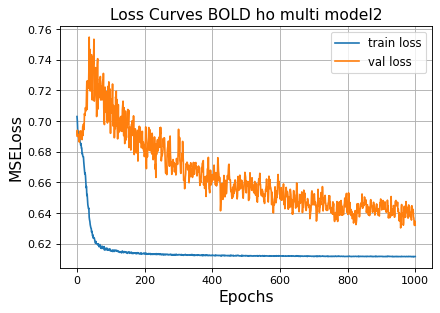

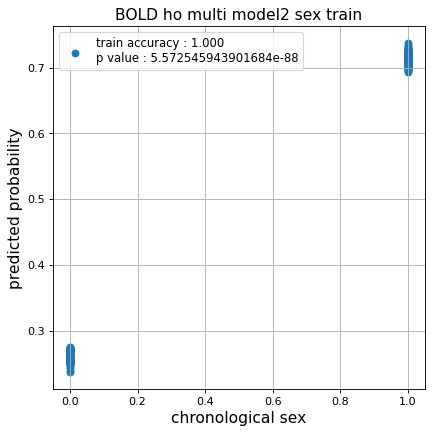

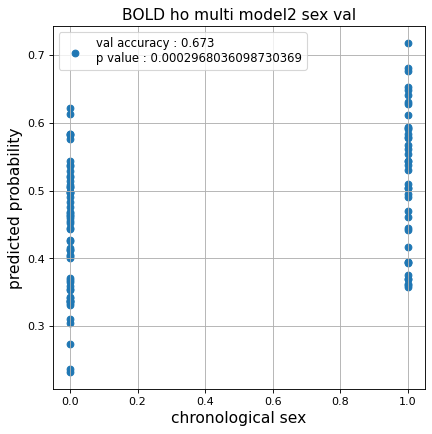

Kfold: 5 ::: epoch: 100, loss: 0.6169099716039804, val loss: 0.6068595349788666
Kfold: 5 ::: epoch: 200, loss: 0.6140170509998615, val loss: 0.5937686264514923
Kfold: 5 ::: epoch: 300, loss: 0.6132687330245972, val loss: 0.5865957289934158
Kfold: 5 ::: epoch: 400, loss: 0.6128945442346426, val loss: 0.5907817780971527
Kfold: 5 ::: epoch: 500, loss: 0.6125800655438349, val loss: 0.5870839506387711
Kfold: 5 ::: epoch: 600, loss: 0.6121531679080083, val loss: 0.5831083655357361
Kfold: 5 ::: epoch: 700, loss: 0.6117177789027874, val loss: 0.5751939415931702
Kfold: 5 ::: epoch: 800, loss: 0.611210259107443, val loss: 0.5631399974226952
Kfold: 5 ::: epoch: 900, loss: 0.6110921272864709, val loss: 0.558466799557209
Kfold: 5 ::: epoch: 1000, loss: 0.6109834771889907, val loss: 0.5643074810504913
save_epochs:977
best val loss:0.5497710406780243


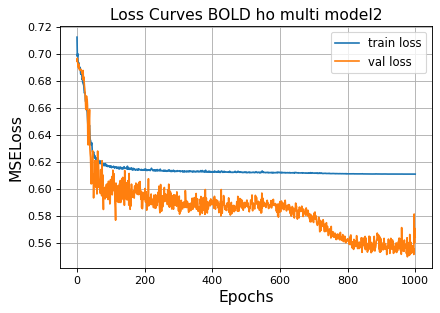

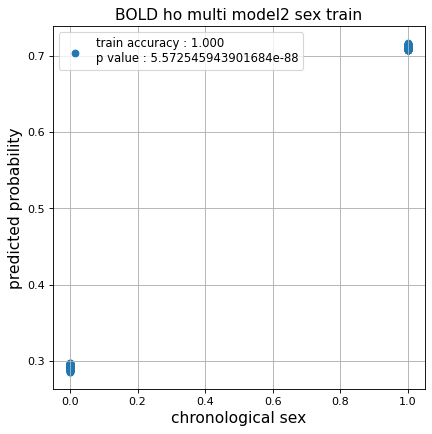

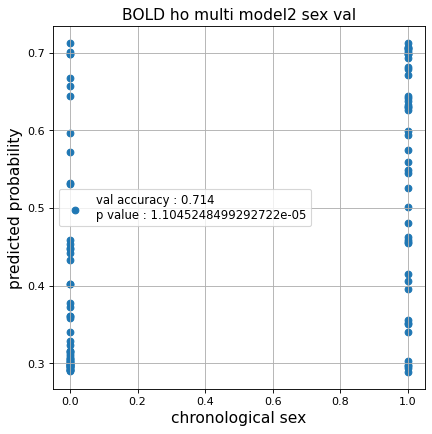

Nested Kfold ::: 4
Kfold: 1 ::: epoch: 100, loss: 0.6170623027361356, val loss: 0.6678753942251205
Kfold: 1 ::: epoch: 200, loss: 0.613922132895543, val loss: 0.6445642113685608
Kfold: 1 ::: epoch: 300, loss: 0.6132626671057481, val loss: 0.6307909786701202
Kfold: 1 ::: epoch: 400, loss: 0.6126937957910391, val loss: 0.6323549002408981
Kfold: 1 ::: epoch: 500, loss: 0.6123936543097863, val loss: 0.6197321712970734
Kfold: 1 ::: epoch: 600, loss: 0.6121355799528269, val loss: 0.624979093670845
Kfold: 1 ::: epoch: 700, loss: 0.6121083314602191, val loss: 0.623593345284462
Kfold: 1 ::: epoch: 800, loss: 0.6118770975332993, val loss: 0.6266133934259415
Kfold: 1 ::: epoch: 900, loss: 0.6119414338698754, val loss: 0.6218687444925308
Kfold: 1 ::: epoch: 1000, loss: 0.6116377848845261, val loss: 0.6208470165729523
save_epochs:973
best val loss:0.613382950425148


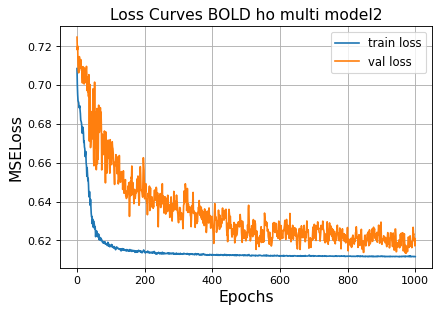

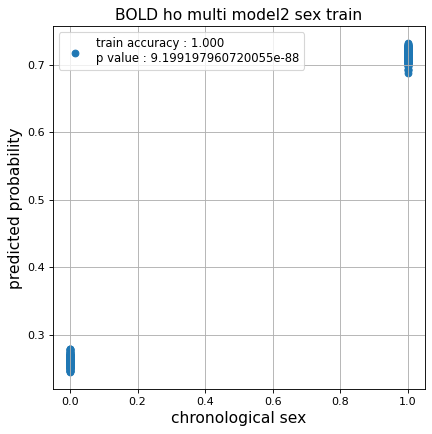

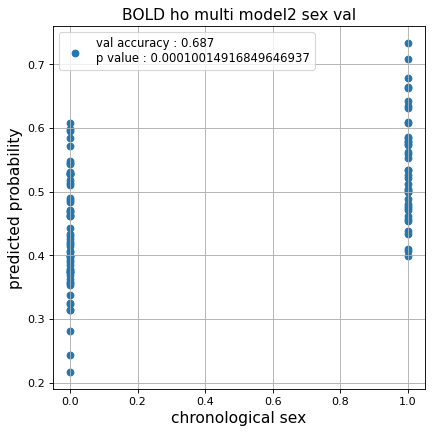

Kfold: 2 ::: epoch: 100, loss: 0.6172322218234723, val loss: 0.6212124228477478
Kfold: 2 ::: epoch: 200, loss: 0.6142133428500249, val loss: 0.6208291053771973
Kfold: 2 ::: epoch: 300, loss: 0.6133843522805434, val loss: 0.6187021285295486
Kfold: 2 ::: epoch: 400, loss: 0.6125783736889179, val loss: 0.6119036972522736
Kfold: 2 ::: epoch: 500, loss: 0.6123293179732102, val loss: 0.6110617965459824
Kfold: 2 ::: epoch: 600, loss: 0.611814232972952, val loss: 0.6118249148130417
Kfold: 2 ::: epoch: 700, loss: 0.6118608667300298, val loss: 0.6099110692739487
early stopping
save_epochs:532
best val loss:0.6046760827302933


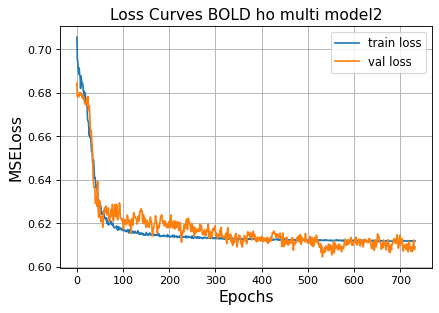

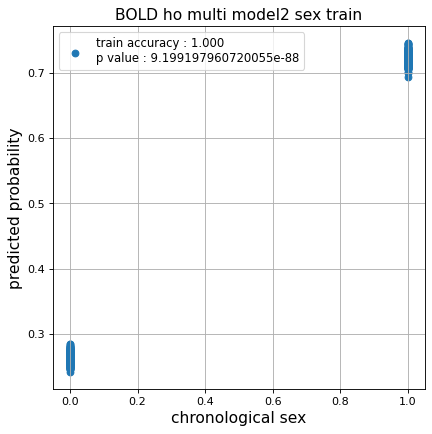

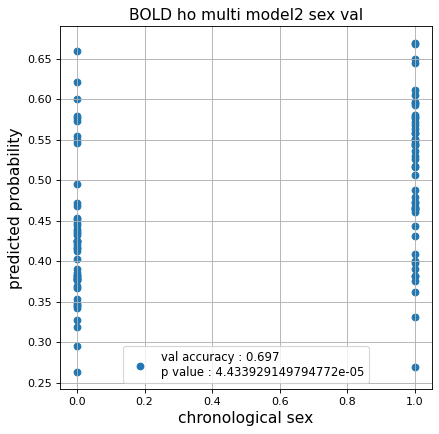

Kfold: 3 ::: epoch: 100, loss: 0.6160462131867042, val loss: 0.6383897289633751
Kfold: 3 ::: epoch: 200, loss: 0.6143212043322049, val loss: 0.6409288346767426
Kfold: 3 ::: epoch: 300, loss: 0.6133129367461572, val loss: 0.6312130391597748
Kfold: 3 ::: epoch: 400, loss: 0.6129565926698538, val loss: 0.6196659430861473
Kfold: 3 ::: epoch: 500, loss: 0.6126016057454623, val loss: 0.6163033843040466
Kfold: 3 ::: epoch: 600, loss: 0.6121149842555706, val loss: 0.6243375390768051
Kfold: 3 ::: epoch: 700, loss: 0.6118708711404067, val loss: 0.618682861328125
Kfold: 3 ::: epoch: 800, loss: 0.611226132282844, val loss: 0.6259645745158195
early stopping
save_epochs:653
best val loss:0.60891193151474


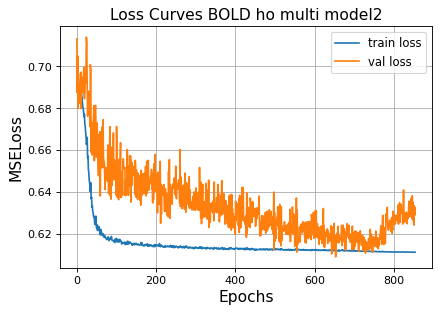

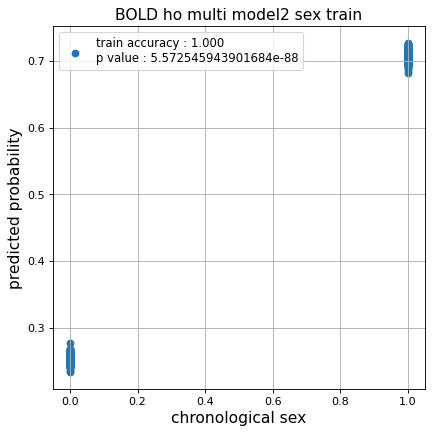

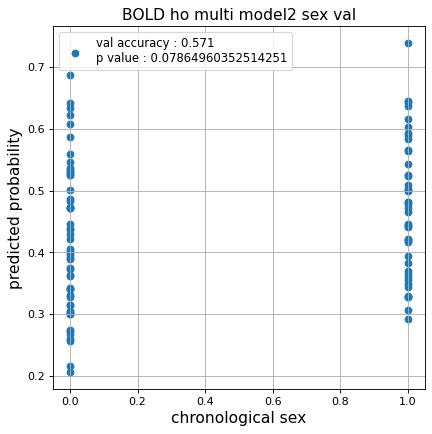

Kfold: 4 ::: epoch: 100, loss: 0.6159733900657067, val loss: 0.6545325368642807
Kfold: 4 ::: epoch: 200, loss: 0.6140752022082989, val loss: 0.6363648027181625
Kfold: 4 ::: epoch: 300, loss: 0.6131583177126371, val loss: 0.6282303184270859
Kfold: 4 ::: epoch: 400, loss: 0.6128122256352351, val loss: 0.6228892356157303
Kfold: 4 ::: epoch: 500, loss: 0.6122009800030634, val loss: 0.6175708770751953
Kfold: 4 ::: epoch: 600, loss: 0.6121330490479102, val loss: 0.6198542267084122
Kfold: 4 ::: epoch: 700, loss: 0.6117993914164029, val loss: 0.619962066411972
Kfold: 4 ::: epoch: 800, loss: 0.6117290900303767, val loss: 0.6169428378343582
Kfold: 4 ::: epoch: 900, loss: 0.611354396893428, val loss: 0.5976438224315643
Kfold: 4 ::: epoch: 1000, loss: 0.6110927049930279, val loss: 0.5818897485733032
save_epochs:971
best val loss:0.5727546066045761


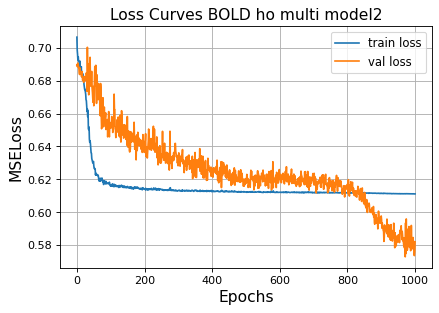

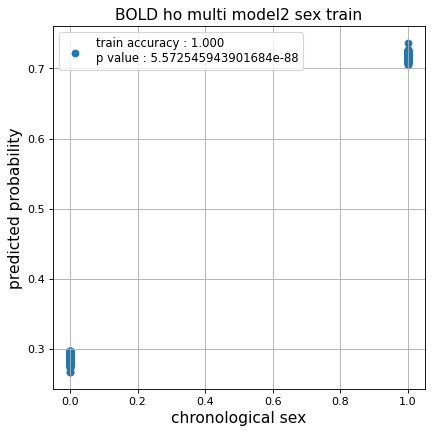

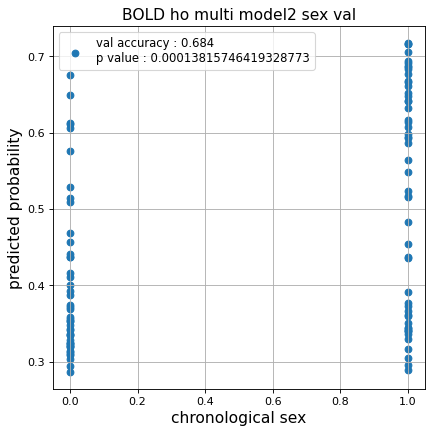

Kfold: 5 ::: epoch: 100, loss: 0.6173216471305261, val loss: 0.6137419492006302
Kfold: 5 ::: epoch: 200, loss: 0.6144273693744953, val loss: 0.6174829006195068
Kfold: 5 ::: epoch: 300, loss: 0.6137331678317144, val loss: 0.6186158508062363
Kfold: 5 ::: epoch: 400, loss: 0.6129275973026569, val loss: 0.6096450537443161
Kfold: 5 ::: epoch: 500, loss: 0.6124762342526362, val loss: 0.6022694855928421
Kfold: 5 ::: epoch: 600, loss: 0.612218017761524, val loss: 0.6012278199195862
Kfold: 5 ::: epoch: 700, loss: 0.6121601599913377, val loss: 0.5969203859567642
Kfold: 5 ::: epoch: 800, loss: 0.6116889623495249, val loss: 0.5875378102064133
Kfold: 5 ::: epoch: 900, loss: 0.6112287090374873, val loss: 0.5665372237563133
Kfold: 5 ::: epoch: 1000, loss: 0.6110566533528842, val loss: 0.5623320043087006
save_epochs:981
best val loss:0.5580800473690033


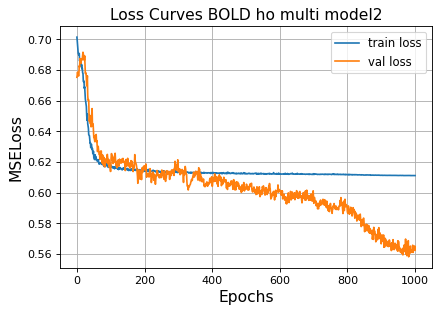

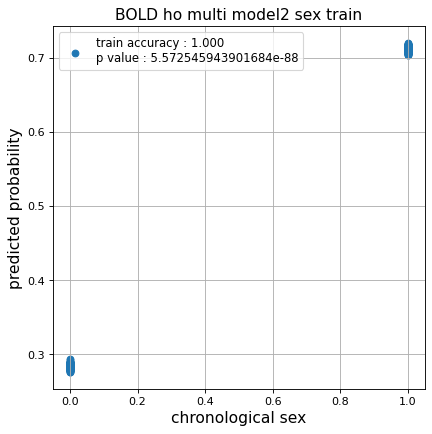

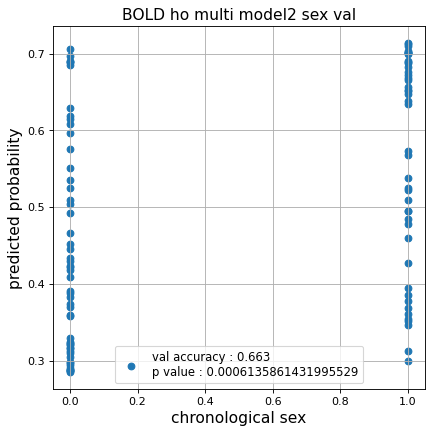

Nested Kfold ::: 5
Kfold: 1 ::: epoch: 100, loss: 0.6162989322955792, val loss: 0.7060227990150452
Kfold: 1 ::: epoch: 200, loss: 0.6142073823855474, val loss: 0.6713975965976715
Kfold: 1 ::: epoch: 300, loss: 0.6131559702066275, val loss: 0.6720383614301682
Kfold: 1 ::: epoch: 400, loss: 0.6124770457927997, val loss: 0.6479146927595139
Kfold: 1 ::: epoch: 500, loss: 0.612230277978457, val loss: 0.6367167979478836
Kfold: 1 ::: epoch: 600, loss: 0.6120596619752737, val loss: 0.6341344565153122
Kfold: 1 ::: epoch: 700, loss: 0.6120028633337754, val loss: 0.6374580711126328
Kfold: 1 ::: epoch: 800, loss: 0.6119816807600168, val loss: 0.6329168081283569
Kfold: 1 ::: epoch: 900, loss: 0.6116931255047138, val loss: 0.6261557787656784
Kfold: 1 ::: epoch: 1000, loss: 0.6116592288017273, val loss: 0.6318993419408798
save_epochs:974
best val loss:0.6212558895349503


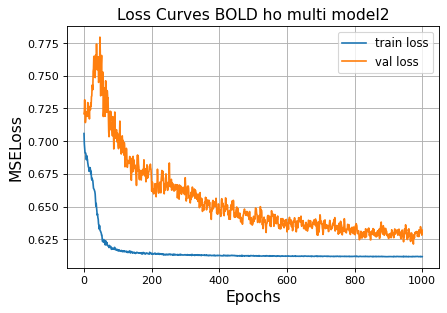

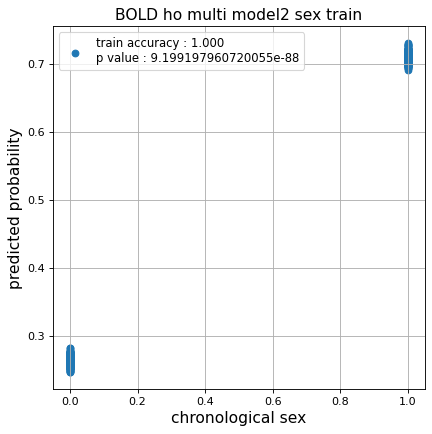

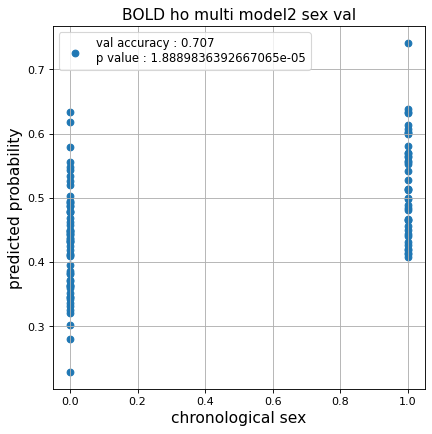

Kfold: 2 ::: epoch: 100, loss: 0.6183803448310266, val loss: 0.6074576377868652
Kfold: 2 ::: epoch: 200, loss: 0.6140432816285354, val loss: 0.6020508632063866
Kfold: 2 ::: epoch: 300, loss: 0.6133267100040729, val loss: 0.5970828086137772
Kfold: 2 ::: epoch: 400, loss: 0.6127593838251554, val loss: 0.5924532264471054
Kfold: 2 ::: epoch: 500, loss: 0.6122758571918194, val loss: 0.593610867857933
Kfold: 2 ::: epoch: 600, loss: 0.6120920318823594, val loss: 0.5920852422714233
Kfold: 2 ::: epoch: 700, loss: 0.612205106478471, val loss: 0.590563029050827
Kfold: 2 ::: epoch: 800, loss: 0.6117410338841952, val loss: 0.5908778309822083
Kfold: 2 ::: epoch: 900, loss: 0.6114728450775146, val loss: 0.5757601484656334
Kfold: 2 ::: epoch: 1000, loss: 0.6111373763818008, val loss: 0.561585508286953
save_epochs:998
best val loss:0.5600418895483017


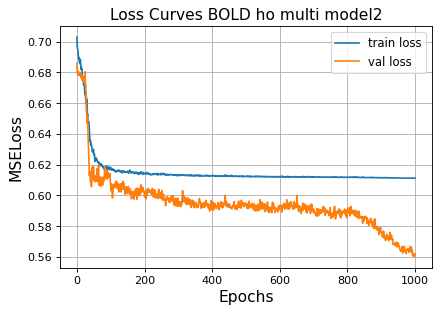

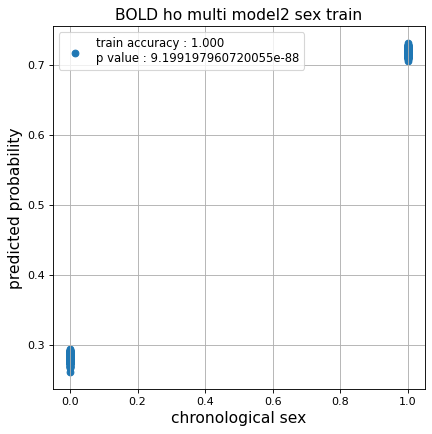

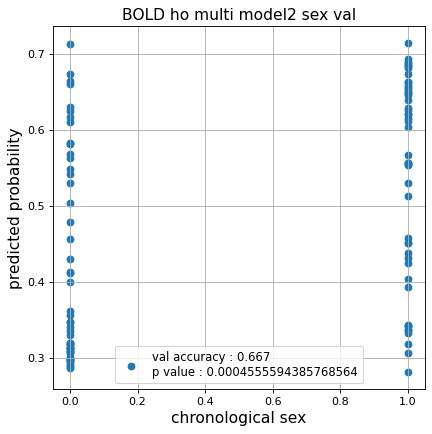

Kfold: 3 ::: epoch: 100, loss: 0.6158541853611286, val loss: 0.6690189689397812
Kfold: 3 ::: epoch: 200, loss: 0.6143785806802603, val loss: 0.6573410928249359
Kfold: 3 ::: epoch: 300, loss: 0.613809177508721, val loss: 0.6212321817874908
Kfold: 3 ::: epoch: 400, loss: 0.6127212047576904, val loss: 0.62164306640625
Kfold: 3 ::: epoch: 500, loss: 0.6123517522445092, val loss: 0.6269794851541519
Kfold: 3 ::: epoch: 600, loss: 0.6121695408454308, val loss: 0.6107852756977081
Kfold: 3 ::: epoch: 700, loss: 0.6119264180843647, val loss: 0.6158366203308105
Kfold: 3 ::: epoch: 800, loss: 0.6116533325268672, val loss: 0.6147038042545319
Kfold: 3 ::: epoch: 900, loss: 0.61137933914478, val loss: 0.6213105320930481
Kfold: 3 ::: epoch: 1000, loss: 0.6110513256146357, val loss: 0.6311164051294327
save_epochs:838
best val loss:0.6005315035581589


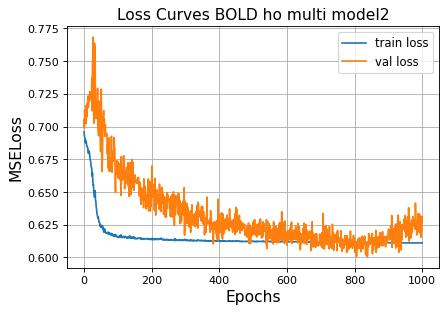

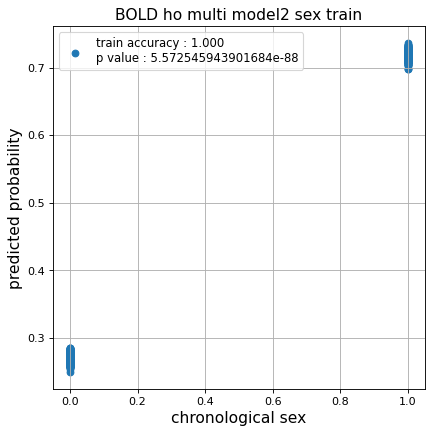

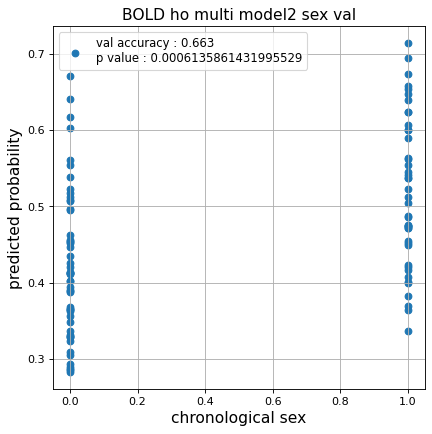

Kfold: 4 ::: epoch: 100, loss: 0.6155668267836938, val loss: 0.6867971420288086
Kfold: 4 ::: epoch: 200, loss: 0.6137211918830872, val loss: 0.6832998842000961
Kfold: 4 ::: epoch: 300, loss: 0.6127084860434899, val loss: 0.6747300922870636
Kfold: 4 ::: epoch: 400, loss: 0.6122667881158682, val loss: 0.6694607585668564
Kfold: 4 ::: epoch: 500, loss: 0.6119338778349069, val loss: 0.6650567799806595
Kfold: 4 ::: epoch: 600, loss: 0.6119930377373328, val loss: 0.6600801348686218
Kfold: 4 ::: epoch: 700, loss: 0.6118222750150241, val loss: 0.664784848690033
Kfold: 4 ::: epoch: 800, loss: 0.6116513518186716, val loss: 0.6636974662542343
early stopping
save_epochs:695
best val loss:0.6497218310832977


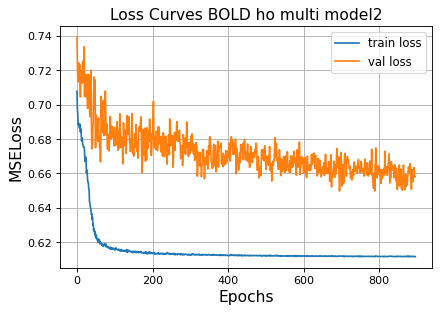

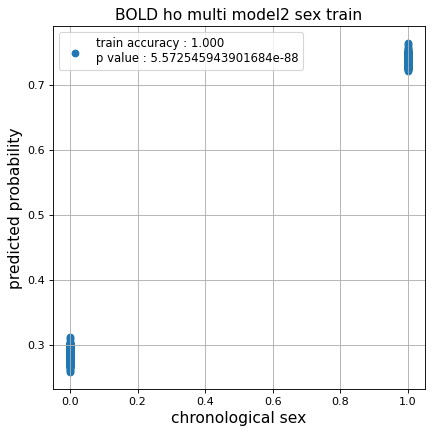

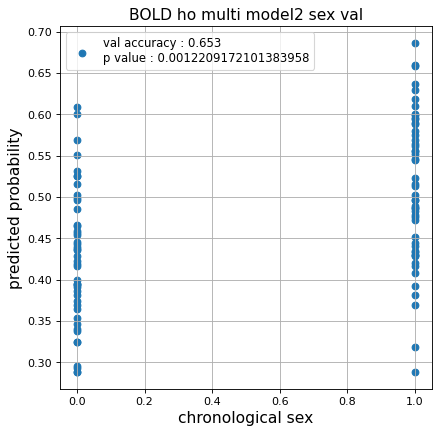

Kfold: 5 ::: epoch: 100, loss: 0.6166155521686261, val loss: 0.6057628244161606
Kfold: 5 ::: epoch: 200, loss: 0.6145915480760428, val loss: 0.5931268706917763
Kfold: 5 ::: epoch: 300, loss: 0.6133786118947543, val loss: 0.5714213699102402
Kfold: 5 ::: epoch: 400, loss: 0.6126141181358924, val loss: 0.5748969092965126
Kfold: 5 ::: epoch: 500, loss: 0.6123862587488614, val loss: 0.5676812455058098
Kfold: 5 ::: epoch: 600, loss: 0.611968246790079, val loss: 0.5662935450673103
Kfold: 5 ::: epoch: 700, loss: 0.6118186803964468, val loss: 0.5552110522985458
Kfold: 5 ::: epoch: 800, loss: 0.6114190037433918, val loss: 0.555916853249073
Kfold: 5 ::: epoch: 900, loss: 0.6111411314744216, val loss: 0.5400424748659134
Kfold: 5 ::: epoch: 1000, loss: 0.611034517104809, val loss: 0.5324389338493347
save_epochs:983
best val loss:0.52939023822546


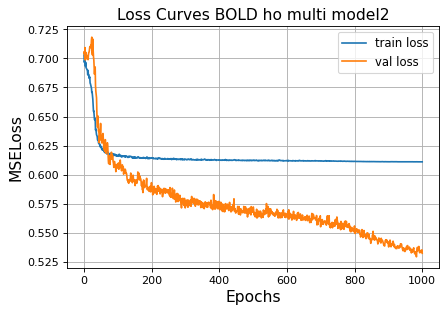

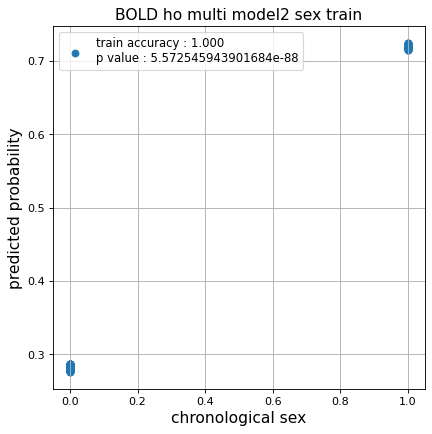

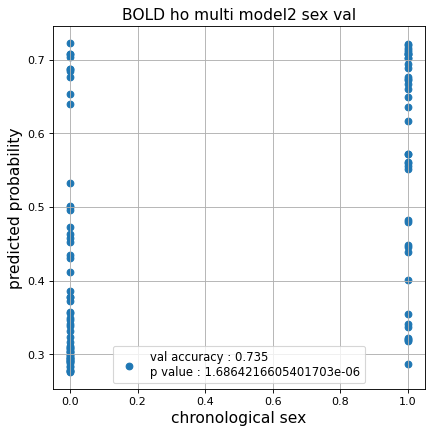

CPU times: user 1h 42min 54s, sys: 8min 49s, total: 1h 51min 44s
Wall time: 1h 51min 48s


In [ ]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_ho_2  = []
test_pred_ho_corrected_2  = []
test_label_ho_2 = []
test_idx_ho_2   = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_ho)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_corrected,test_label = train_model(data_ho,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 1000,
                                                           d_model    = 128,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 128,
                                                           nhead      = 32,
                                                           hidden_dim_transformer = 2,
                                                           pos_drop    = 0.1,
                                                           trans_drop = 0.1,
                                                           fc_drop = 0.1,
                                                           title = 'ROI ho multi model2'
                                                          )
    
    test_pred_ho_2.append(test_pred)
    test_pred_ho_corrected_2.append(test_pred_corrected)
    test_label_ho_2.append(test_label)
    test_idx_ho_2.append(test_idx)

### データ保存

In [ ]:
test_pred_ho_1 = np.array(test_pred_ho_1, dtype=object)
test_pred_ho_corrected_1 = np.array(test_pred_ho_corrected_1, dtype=object)

test_pred_ho_2 = np.array(test_pred_ho_2, dtype=object)
test_pred_ho_corrected_2 = np.array(test_pred_ho_corrected_2, dtype=object)

In [ ]:
np.savez('../02_data_analysis/temp/ho_sex_1',
         test_pred_ho_1,
         test_pred_ho_corrected_1,
         test_label_ho_1,
         test_idx_ho_1)
np.savez('../02_data_analysis/temp/ho_sex_2',
         test_pred_ho_2,
         test_pred_ho_corrected_2,
         test_label_ho_2,
         test_idx_ho_2)

### Data定義(dynamic FC)

In [ ]:
%%time
df_dynamic_ho = pd.read_csv('../02_data_analysis/dynamic_FC/dynamic_ho.csv')
data_dynamic_ho = make_data(df_dynamic_ho)
print(data_dynamic_ho.shape)

(615, 123, 5995)
CPU times: user 2min 48s, sys: 3.89 s, total: 2min 52s
Wall time: 2min 53s


### Dynamic FC 1

Nested Kfold ::: 1
Kfold: 1 ::: epoch: 100, loss: 0.615319719681373, val loss: 0.6516067385673523
Kfold: 1 ::: epoch: 200, loss: 0.6129055894338168, val loss: 0.6460205614566803
Kfold: 1 ::: epoch: 300, loss: 0.6122632576869085, val loss: 0.6406101733446121
Kfold: 1 ::: epoch: 400, loss: 0.6121337597186749, val loss: 0.6329847425222397
Kfold: 1 ::: epoch: 500, loss: 0.6115475021875821, val loss: 0.6553974002599716
early stopping
save_epochs:394
best val loss:0.6305960714817047


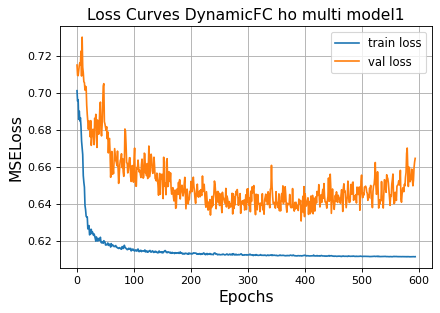

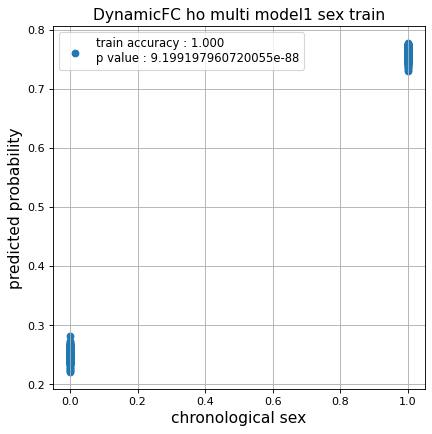

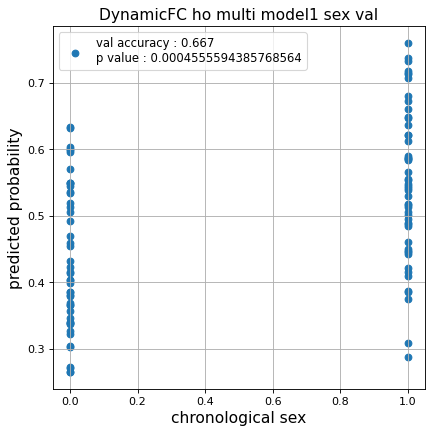

Kfold: 2 ::: epoch: 100, loss: 0.6147639476335965, val loss: 0.6423391699790955
Kfold: 2 ::: epoch: 200, loss: 0.6130742659935584, val loss: 0.6251836121082306
Kfold: 2 ::: epoch: 300, loss: 0.6123807292718154, val loss: 0.5941947251558304
Kfold: 2 ::: epoch: 400, loss: 0.6117037213765658, val loss: 0.5773260593414307
Kfold: 2 ::: epoch: 500, loss: 0.6113296747207642, val loss: 0.5457756817340851
Kfold: 2 ::: epoch: 600, loss: 0.6112360679186307, val loss: 0.5368439480662346
Kfold: 2 ::: epoch: 700, loss: 0.6112097593454214, val loss: 0.5293185263872147
save_epochs:646
best val loss:0.5264494642615318


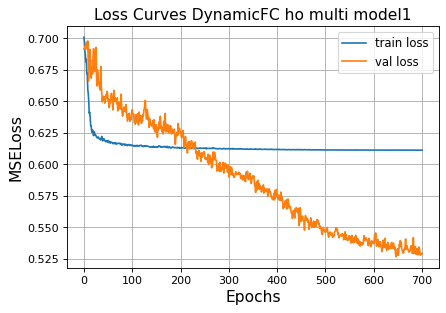

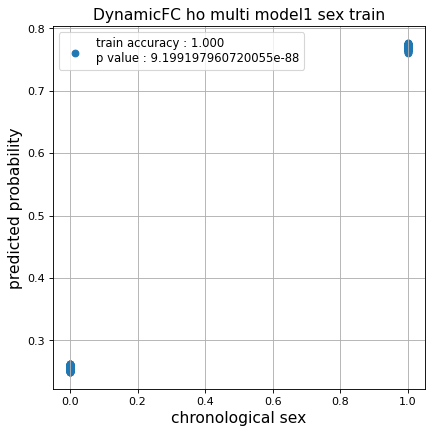

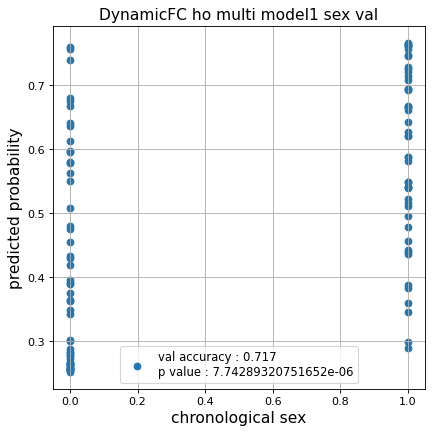

Kfold: 3 ::: epoch: 100, loss: 0.6147151130896348, val loss: 0.7259693741798401
Kfold: 3 ::: epoch: 200, loss: 0.6135589159451998, val loss: 0.706617534160614
Kfold: 3 ::: epoch: 300, loss: 0.6125047619526203, val loss: 0.6871126145124435
Kfold: 3 ::: epoch: 400, loss: 0.6121091750951914, val loss: 0.670004814863205
Kfold: 3 ::: epoch: 500, loss: 0.6115638017654419, val loss: 0.6503950506448746
Kfold: 3 ::: epoch: 600, loss: 0.6113581657409668, val loss: 0.6543428748846054
Kfold: 3 ::: epoch: 700, loss: 0.6112455221322867, val loss: 0.6859021484851837
save_epochs:592
best val loss:0.639066755771637


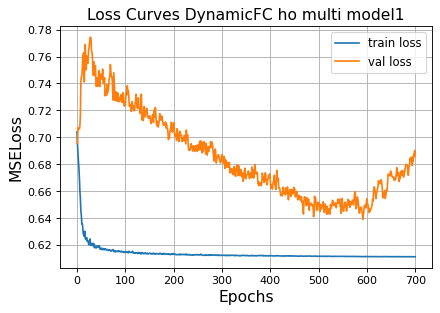

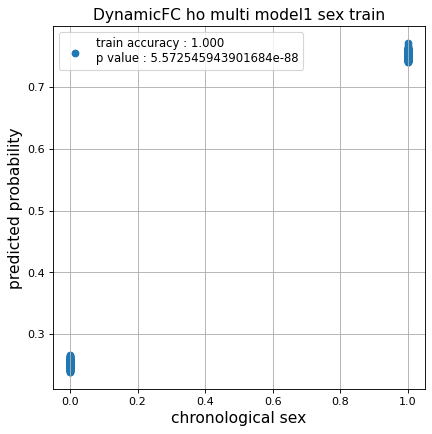

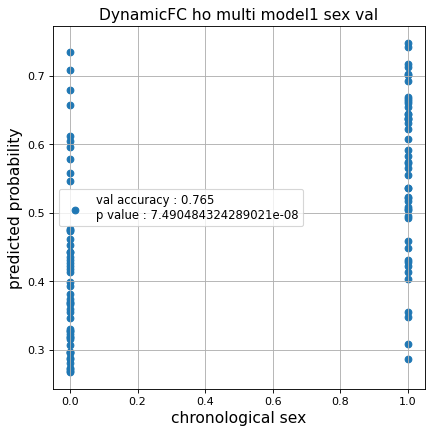

Kfold: 4 ::: epoch: 100, loss: 0.6140926342744094, val loss: 0.6385566592216492
Kfold: 4 ::: epoch: 200, loss: 0.613050259076632, val loss: 0.6305727809667587
Kfold: 4 ::: epoch: 300, loss: 0.6122133502593408, val loss: 0.6394727528095245
Kfold: 4 ::: epoch: 400, loss: 0.6119123651431158, val loss: 0.6434890478849411
early stopping
save_epochs:227
best val loss:0.6122478544712067


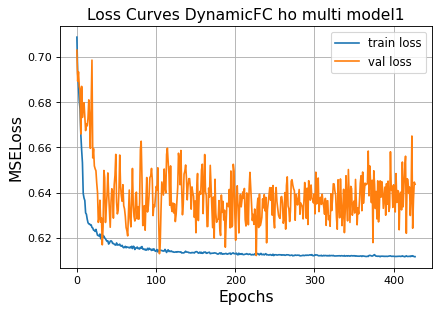

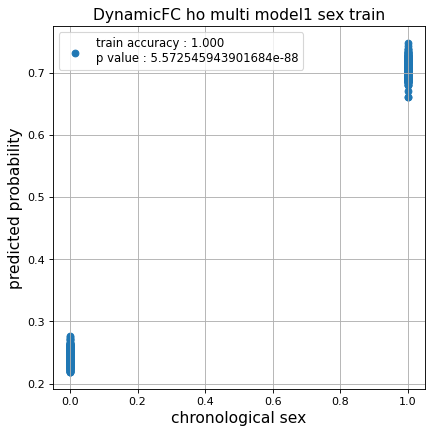

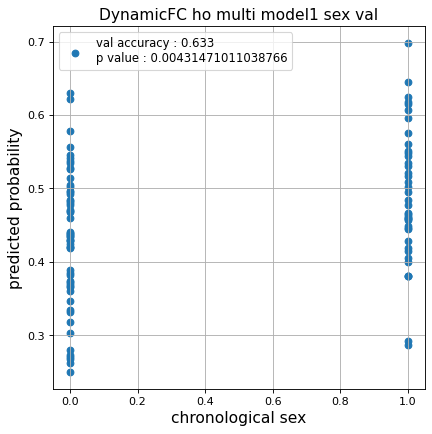

Kfold: 5 ::: epoch: 100, loss: 0.6142255938970126, val loss: 0.5984871685504913
Kfold: 5 ::: epoch: 200, loss: 0.6124139932485727, val loss: 0.6043485999107361
Kfold: 5 ::: epoch: 300, loss: 0.6121340439869807, val loss: 0.6007539629936218
Kfold: 5 ::: epoch: 400, loss: 0.6116958673183734, val loss: 0.5988758504390717
early stopping
save_epochs:285
best val loss:0.5922687351703644


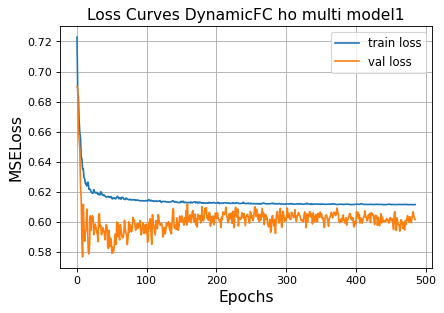

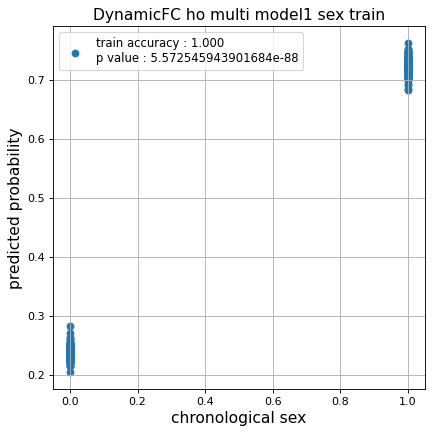

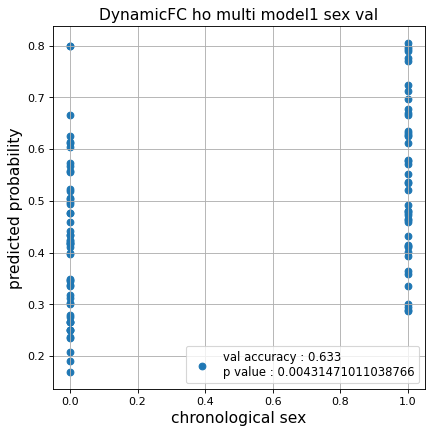

Nested Kfold ::: 2
Kfold: 1 ::: epoch: 100, loss: 0.6153669678247892, val loss: 0.6892900317907333
Kfold: 1 ::: epoch: 200, loss: 0.6131063424623929, val loss: 0.6653434038162231
Kfold: 1 ::: epoch: 300, loss: 0.61223599085441, val loss: 0.6568605899810791
Kfold: 1 ::: epoch: 400, loss: 0.6120526194572449, val loss: 0.6579307615756989
Kfold: 1 ::: epoch: 500, loss: 0.6115102813794062, val loss: 0.637880340218544
Kfold: 1 ::: epoch: 600, loss: 0.6112583508858314, val loss: 0.6514564901590347
Kfold: 1 ::: epoch: 700, loss: 0.6111736664405236, val loss: 0.6379877477884293
save_epochs:655
best val loss:0.6231189519166946


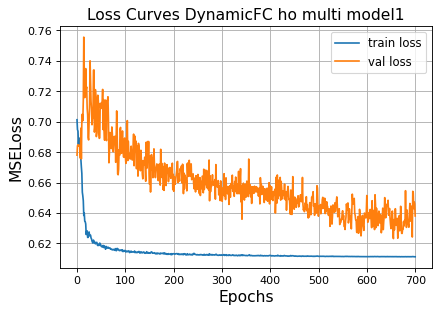

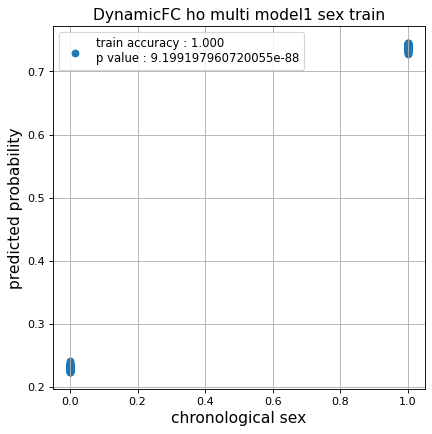

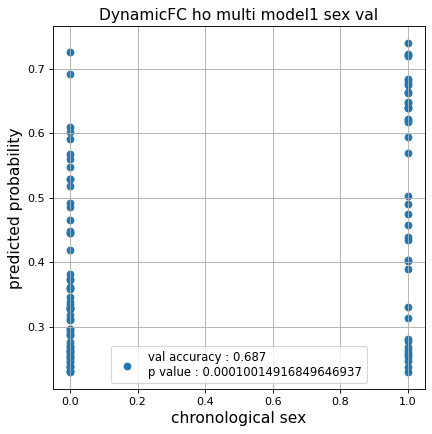

Kfold: 2 ::: epoch: 100, loss: 0.6155904898276696, val loss: 0.6060140579938889
Kfold: 2 ::: epoch: 200, loss: 0.6128136882415185, val loss: 0.5989794880151749
Kfold: 2 ::: epoch: 300, loss: 0.6122696307989267, val loss: 0.6007657051086426
Kfold: 2 ::: epoch: 400, loss: 0.6120705650402949, val loss: 0.5946355313062668
Kfold: 2 ::: epoch: 500, loss: 0.611657032599816, val loss: 0.5858532190322876
Kfold: 2 ::: epoch: 600, loss: 0.6113697290420532, val loss: 0.5771799385547638
Kfold: 2 ::: epoch: 700, loss: 0.6112770346494821, val loss: 0.5876448452472687
save_epochs:611
best val loss:0.5570743829011917


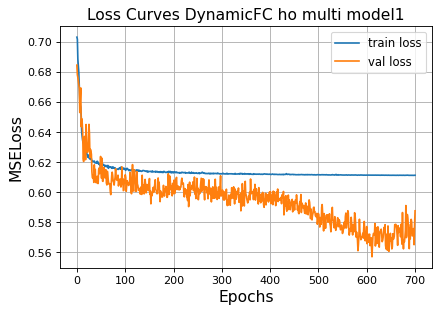

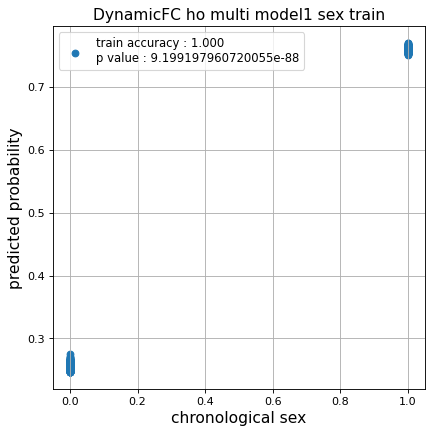

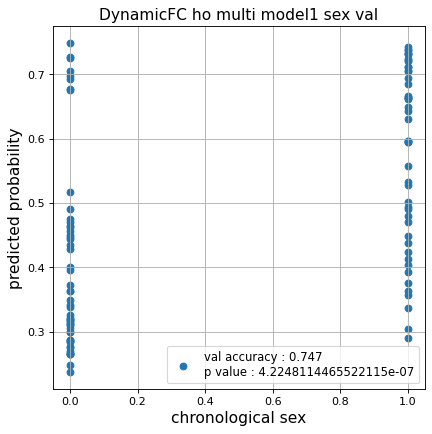

Kfold: 3 ::: epoch: 100, loss: 0.6145773163208594, val loss: 0.6672890782356262
Kfold: 3 ::: epoch: 200, loss: 0.6129707739903376, val loss: 0.6734569668769836
Kfold: 3 ::: epoch: 300, loss: 0.6122700113516587, val loss: 0.6916673630475998
Kfold: 3 ::: epoch: 400, loss: 0.6117310065489548, val loss: 0.7038855403661728
early stopping
save_epochs:236
best val loss:0.6746729761362076


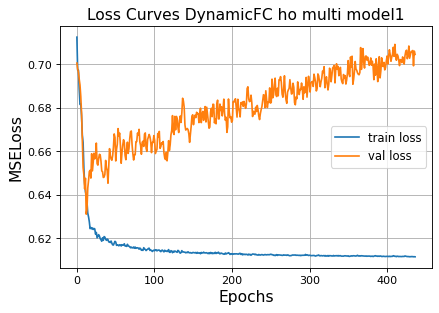

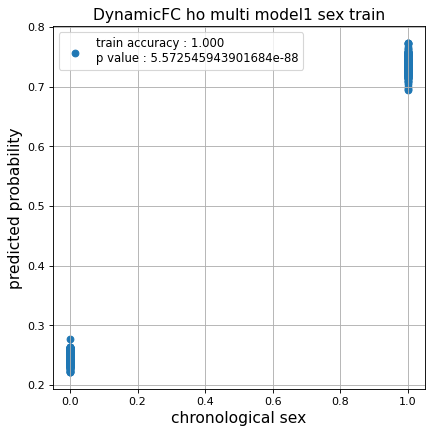

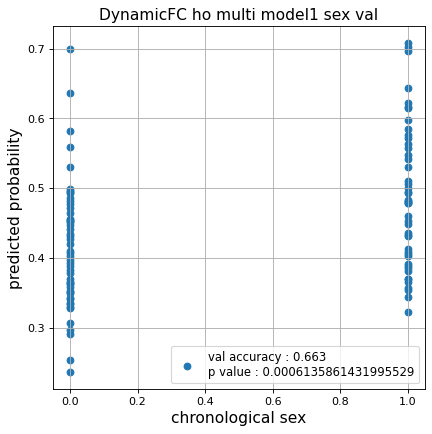

Kfold: 4 ::: epoch: 100, loss: 0.6147474600718572, val loss: 0.6953842639923096
Kfold: 4 ::: epoch: 200, loss: 0.6125964935009296, val loss: 0.6701722294092178
Kfold: 4 ::: epoch: 300, loss: 0.6121343374252319, val loss: 0.6682496070861816
Kfold: 4 ::: epoch: 400, loss: 0.6118462773469778, val loss: 0.6817823946475983
early stopping
save_epochs:237
best val loss:0.6556742489337921


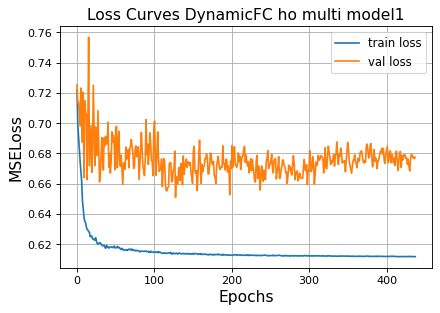

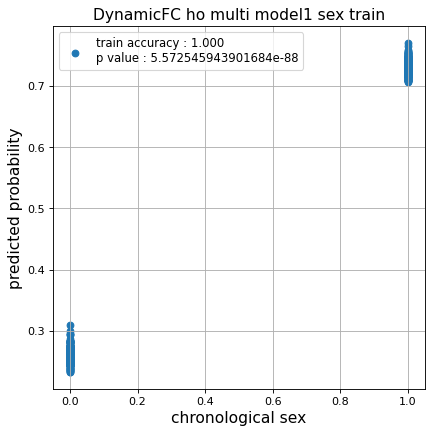

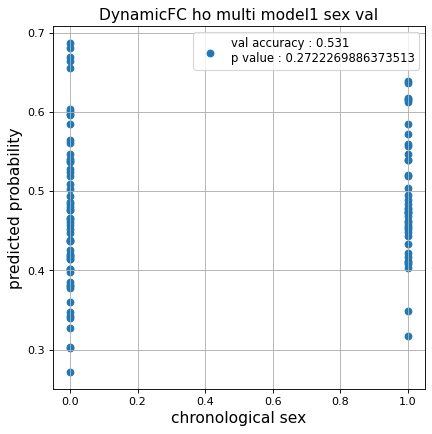

Kfold: 5 ::: epoch: 100, loss: 0.6146023135918838, val loss: 0.699946328997612
Kfold: 5 ::: epoch: 200, loss: 0.6130837614719684, val loss: 0.697393149137497
Kfold: 5 ::: epoch: 300, loss: 0.612134942641625, val loss: 0.6934686303138733
Kfold: 5 ::: epoch: 400, loss: 0.6117722162833581, val loss: 0.6769576966762543
Kfold: 5 ::: epoch: 500, loss: 0.6116905808448792, val loss: 0.6807861328125
Kfold: 5 ::: epoch: 600, loss: 0.6115429126299344, val loss: 0.6740225851535797
Kfold: 5 ::: epoch: 700, loss: 0.6116361938990079, val loss: 0.6828543543815613
save_epochs:596
best val loss:0.6671129018068314


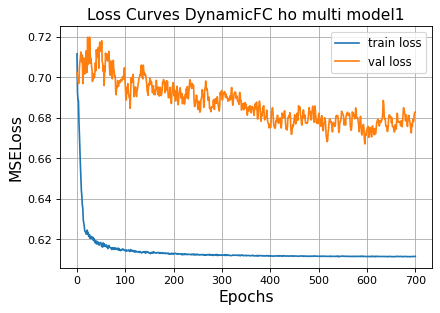

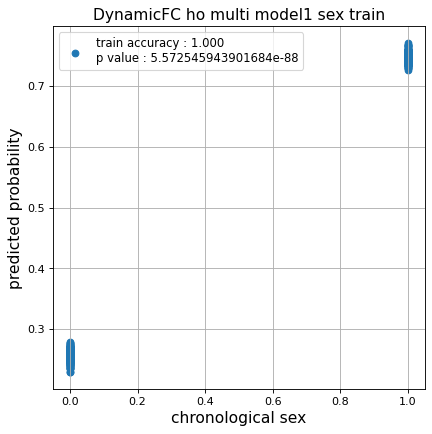

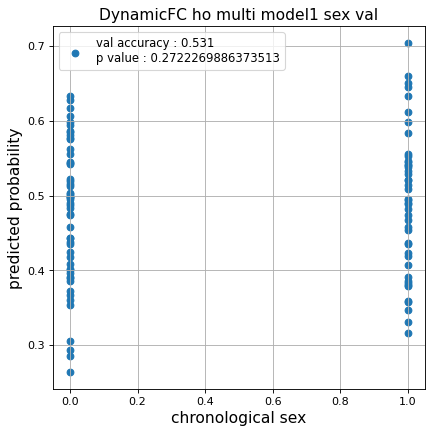

Nested Kfold ::: 3
Kfold: 1 ::: epoch: 100, loss: 0.6152632786677434, val loss: 0.6618136316537857
Kfold: 1 ::: epoch: 200, loss: 0.6130773700200595, val loss: 0.645569309592247
Kfold: 1 ::: epoch: 300, loss: 0.6122918266516465, val loss: 0.6485925167798996
Kfold: 1 ::: epoch: 400, loss: 0.611963111620683, val loss: 0.6420758366584778
Kfold: 1 ::: epoch: 500, loss: 0.6115291898067181, val loss: 0.6325982511043549
Kfold: 1 ::: epoch: 600, loss: 0.6113312381964463, val loss: 0.6462717801332474
Kfold: 1 ::: epoch: 700, loss: 0.611180291726039, val loss: 0.6307488828897476
save_epochs:668
best val loss:0.624808058142662


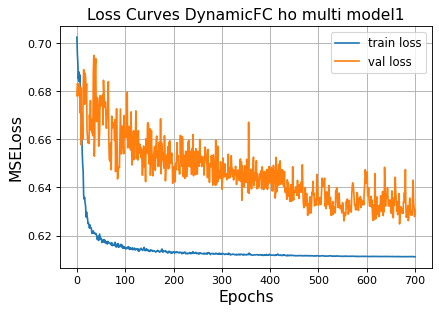

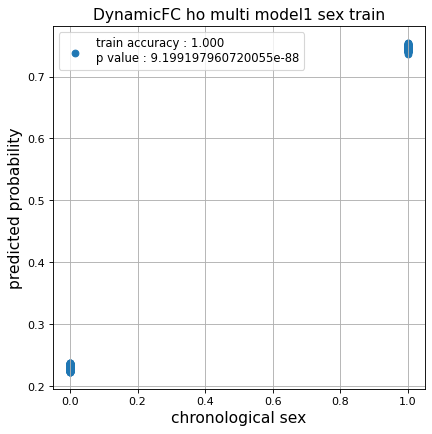

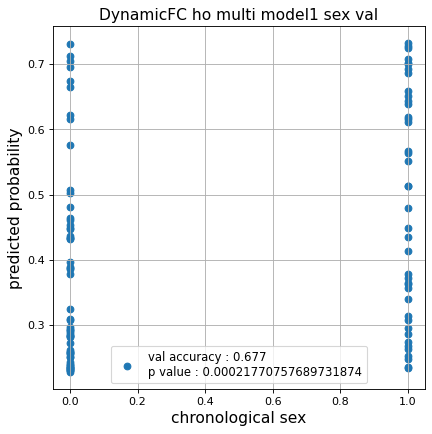

Kfold: 2 ::: epoch: 100, loss: 0.6157437700491685, val loss: 0.6329241394996643
Kfold: 2 ::: epoch: 200, loss: 0.6127406129470239, val loss: 0.6243741065263748
Kfold: 2 ::: epoch: 300, loss: 0.6124637035223154, val loss: 0.6236592382192612
Kfold: 2 ::: epoch: 400, loss: 0.6120290618676406, val loss: 0.6238718628883362
early stopping
save_epochs:295
best val loss:0.6161042302846909


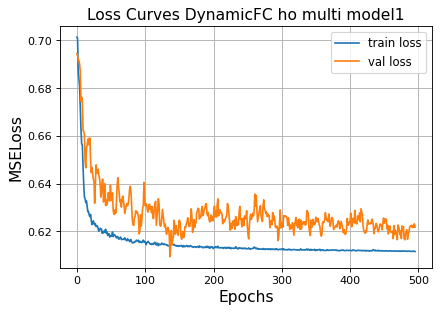

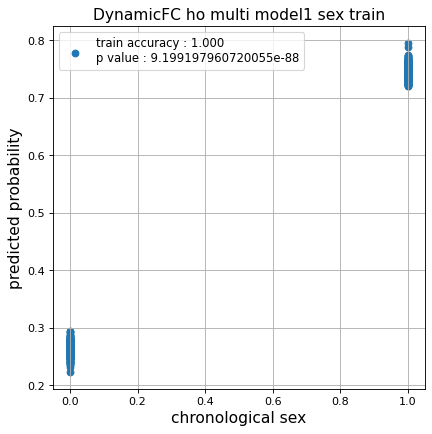

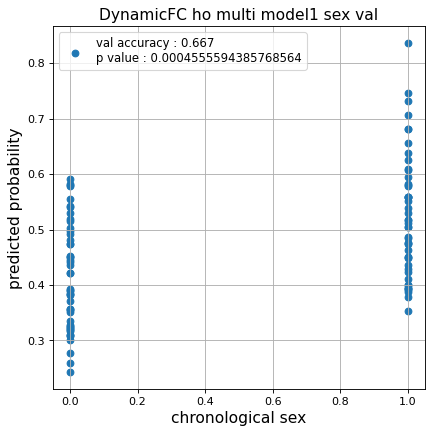

Kfold: 3 ::: epoch: 100, loss: 0.614462659909175, val loss: 0.7065156996250153
Kfold: 3 ::: epoch: 200, loss: 0.6129701229242178, val loss: 0.6950052231550217
Kfold: 3 ::: epoch: 300, loss: 0.6121645799049964, val loss: 0.6933682709932327
Kfold: 3 ::: epoch: 400, loss: 0.6118073371740488, val loss: 0.6878302097320557
Kfold: 3 ::: epoch: 500, loss: 0.6115963504864619, val loss: 0.7124965041875839
early stopping
save_epochs:325
best val loss:0.6843047142028809


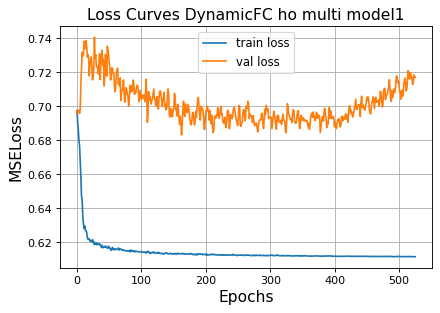

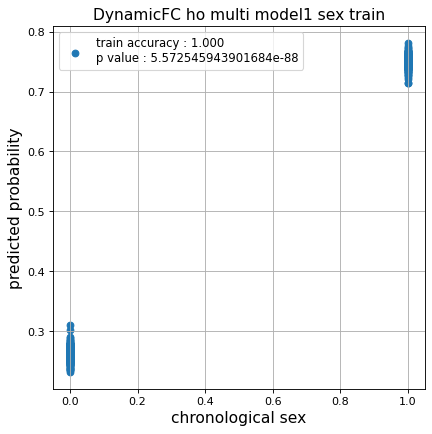

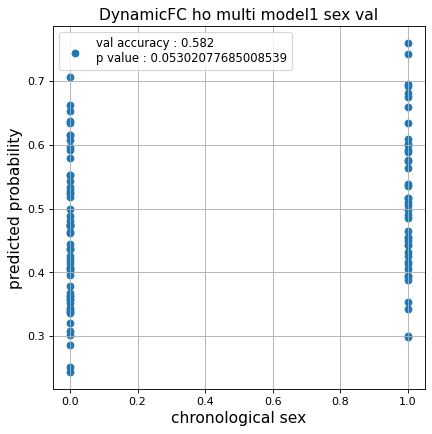

Kfold: 4 ::: epoch: 100, loss: 0.6148609748253455, val loss: 0.7219966948032379
Kfold: 4 ::: epoch: 200, loss: 0.6128766353313739, val loss: 0.7274709045886993
Kfold: 4 ::: epoch: 300, loss: 0.6122505756524893, val loss: 0.7071773260831833
Kfold: 4 ::: epoch: 400, loss: 0.6119015354376572, val loss: 0.7054975926876068
Kfold: 4 ::: epoch: 500, loss: 0.611670196056366, val loss: 0.7153527736663818
Kfold: 4 ::: epoch: 600, loss: 0.6115054396482614, val loss: 0.6948663294315338
Kfold: 4 ::: epoch: 700, loss: 0.6113773263417758, val loss: 0.6896372139453888
save_epochs:618
best val loss:0.6721236556768417


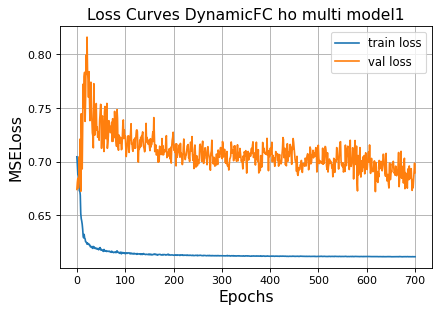

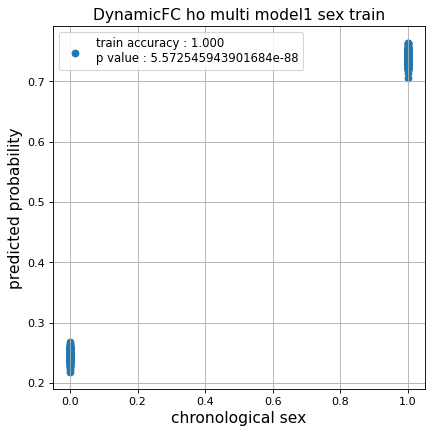

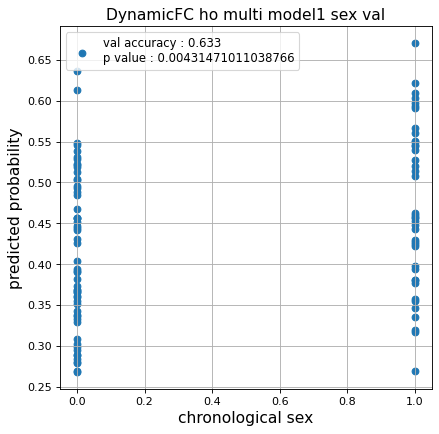

Kfold: 5 ::: epoch: 100, loss: 0.6144244258220379, val loss: 0.6440016031265259
Kfold: 5 ::: epoch: 200, loss: 0.6127529373535743, val loss: 0.6428700238466263
Kfold: 5 ::: epoch: 300, loss: 0.61221509713393, val loss: 0.6358988732099533
Kfold: 5 ::: epoch: 400, loss: 0.6117512583732605, val loss: 0.6332860589027405
Kfold: 5 ::: epoch: 500, loss: 0.6114568985425509, val loss: 0.6315055787563324
Kfold: 5 ::: epoch: 600, loss: 0.6113857260117164, val loss: 0.6187296062707901
Kfold: 5 ::: epoch: 700, loss: 0.6111697554588318, val loss: 0.6325781494379044
save_epochs:599
best val loss:0.6176086217164993


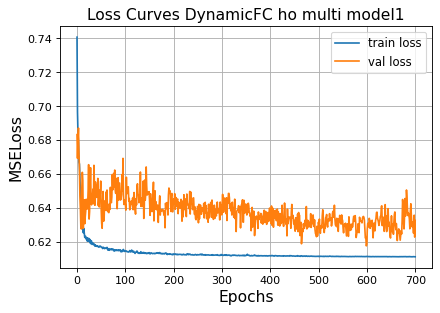

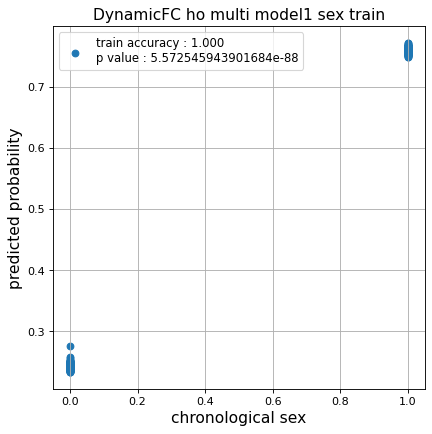

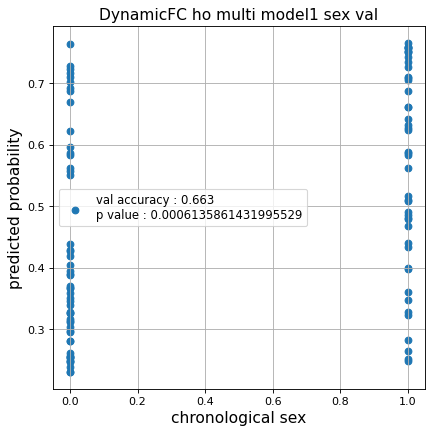

Nested Kfold ::: 4
Kfold: 1 ::: epoch: 100, loss: 0.6155440578093896, val loss: 0.6893383860588074
Kfold: 1 ::: epoch: 200, loss: 0.6129487340266888, val loss: 0.6692591458559036
Kfold: 1 ::: epoch: 300, loss: 0.61224764585495, val loss: 0.6599204391241074
Kfold: 1 ::: epoch: 400, loss: 0.6118926130808316, val loss: 0.6539052575826645
Kfold: 1 ::: epoch: 500, loss: 0.6116465926170349, val loss: 0.64747454226017
Kfold: 1 ::: epoch: 600, loss: 0.6113462402270391, val loss: 0.6518415063619614
Kfold: 1 ::: epoch: 700, loss: 0.611242583164802, val loss: 0.6160903722047806
save_epochs:699
best val loss:0.6107600927352905


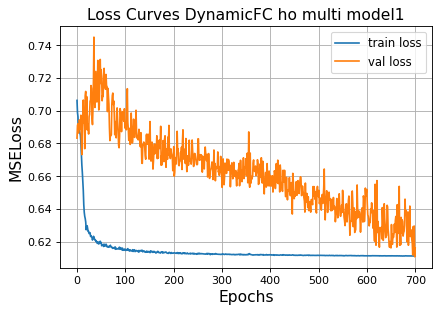

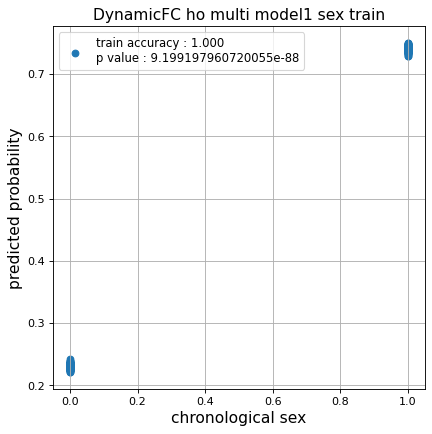

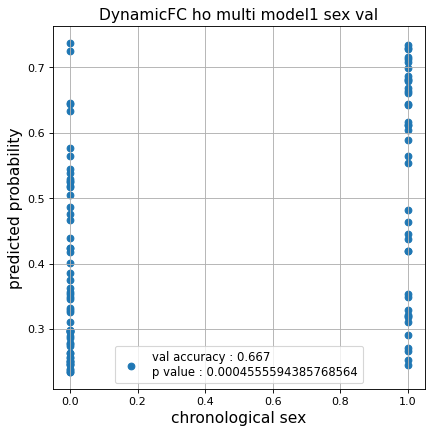

Kfold: 2 ::: epoch: 100, loss: 0.6153989709340609, val loss: 0.6359046250581741
Kfold: 2 ::: epoch: 200, loss: 0.6132554090940036, val loss: 0.6278278976678848
Kfold: 2 ::: epoch: 300, loss: 0.6123830584379343, val loss: 0.6169905364513397
Kfold: 2 ::: epoch: 400, loss: 0.612012505531311, val loss: 0.608056977391243
Kfold: 2 ::: epoch: 500, loss: 0.6116607097479013, val loss: 0.5971761345863342
Kfold: 2 ::: epoch: 600, loss: 0.611333613212292, val loss: 0.5905503630638123
Kfold: 2 ::: epoch: 700, loss: 0.611224353313446, val loss: 0.5819857567548752
save_epochs:659
best val loss:0.5783495306968689


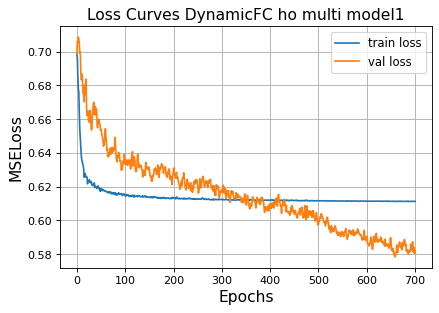

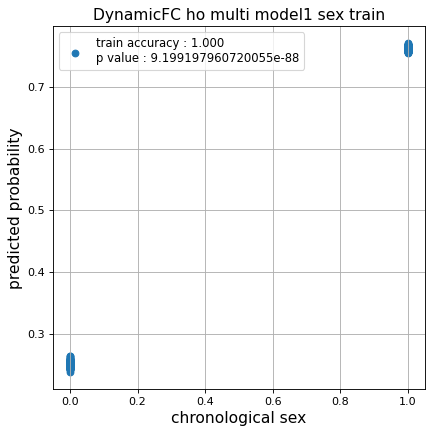

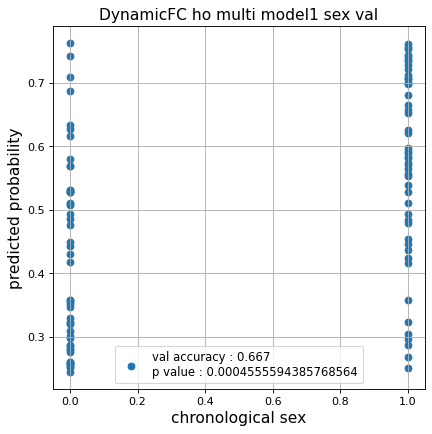

Kfold: 3 ::: epoch: 100, loss: 0.614223416034992, val loss: 0.5804311409592628
Kfold: 3 ::: epoch: 200, loss: 0.6129433375138503, val loss: 0.5744923651218414
Kfold: 3 ::: epoch: 300, loss: 0.6122716802817124, val loss: 0.564507007598877
Kfold: 3 ::: epoch: 400, loss: 0.6117297686063327, val loss: 0.5686438679695129
Kfold: 3 ::: epoch: 500, loss: 0.6115239400130051, val loss: 0.5482248589396477
Kfold: 3 ::: epoch: 600, loss: 0.6112569570541382, val loss: 0.5533083528280258
Kfold: 3 ::: epoch: 700, loss: 0.6112416524153489, val loss: 0.5493387281894684
save_epochs:578
best val loss:0.5398292690515518


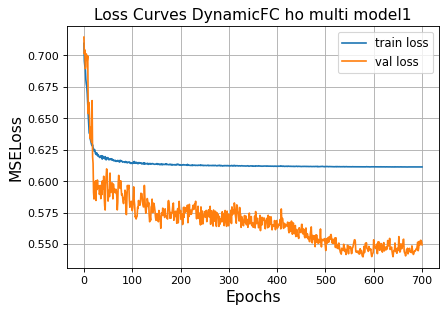

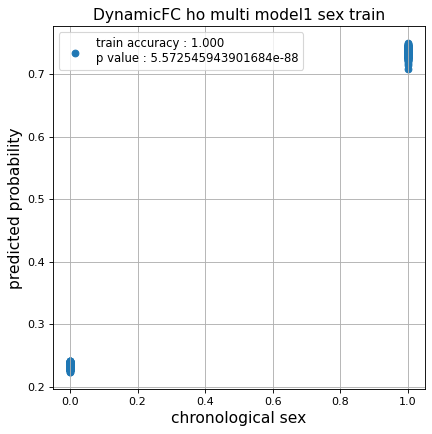

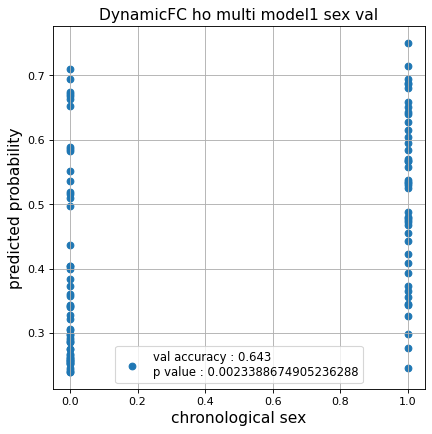

Kfold: 4 ::: epoch: 100, loss: 0.6153915065985459, val loss: 0.7198835611343384
Kfold: 4 ::: epoch: 200, loss: 0.6133380715663617, val loss: 0.6945565491914749
Kfold: 4 ::: epoch: 300, loss: 0.6122727485803457, val loss: 0.6989935487508774
Kfold: 4 ::: epoch: 400, loss: 0.6119024753570557, val loss: 0.6822228282690048
Kfold: 4 ::: epoch: 500, loss: 0.6117676542355464, val loss: 0.6788893938064575
Kfold: 4 ::: epoch: 600, loss: 0.6116187664178702, val loss: 0.6711158007383347
Kfold: 4 ::: epoch: 700, loss: 0.6115357921673701, val loss: 0.6654182821512222
save_epochs:689
best val loss:0.6586464941501617


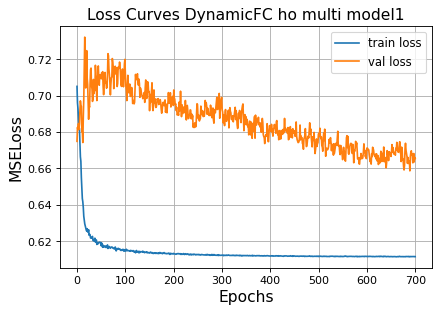

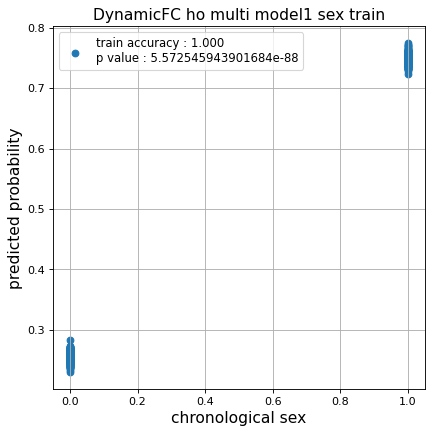

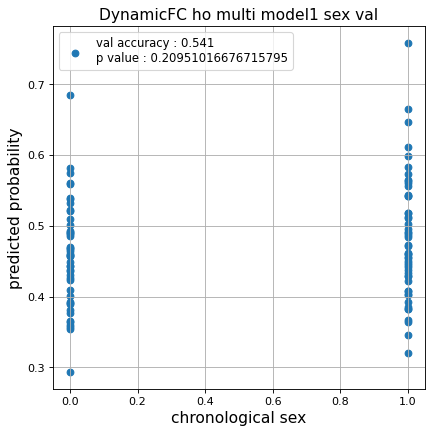

Kfold: 5 ::: epoch: 100, loss: 0.6143597043477572, val loss: 0.5509645417332649
Kfold: 5 ::: epoch: 200, loss: 0.6131074932905344, val loss: 0.5592515990138054
Kfold: 5 ::: epoch: 300, loss: 0.6119987964630127, val loss: 0.5666260197758675
Kfold: 5 ::: epoch: 400, loss: 0.6117220337574298, val loss: 0.5726706385612488
early stopping
save_epochs:229
best val loss:0.5490803718566895


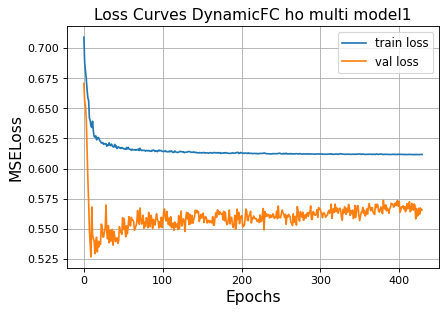

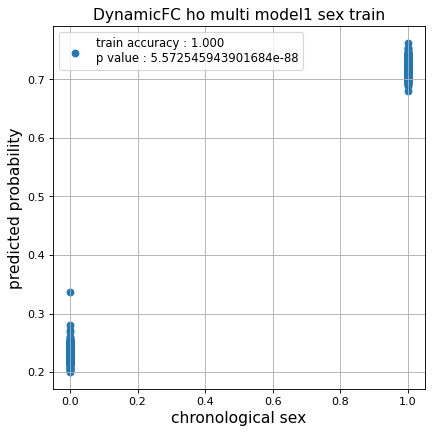

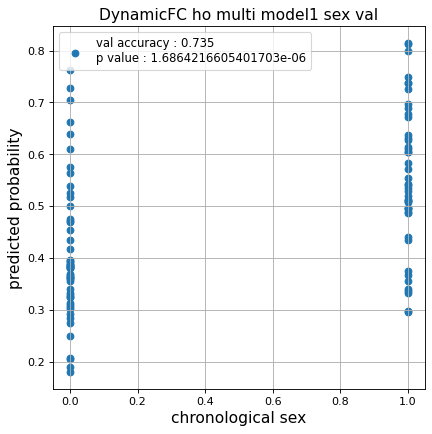

Nested Kfold ::: 5
Kfold: 1 ::: epoch: 100, loss: 0.6155705222716699, val loss: 0.6862348020076752
Kfold: 1 ::: epoch: 200, loss: 0.6129981187673715, val loss: 0.684133991599083
Kfold: 1 ::: epoch: 300, loss: 0.6123666442357577, val loss: 0.6760091185569763
Kfold: 1 ::: epoch: 400, loss: 0.6118619258587177, val loss: 0.678529366850853
Kfold: 1 ::: epoch: 500, loss: 0.6116482065274165, val loss: 0.6790763288736343
Kfold: 1 ::: epoch: 600, loss: 0.6113682435109065, val loss: 0.7044647336006165
early stopping
save_epochs:472
best val loss:0.665984719991684


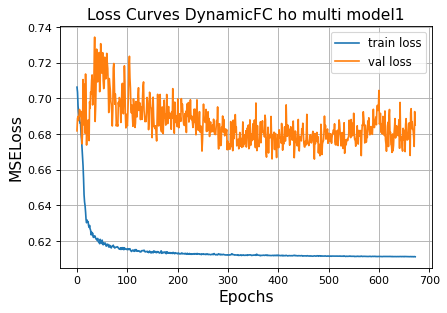

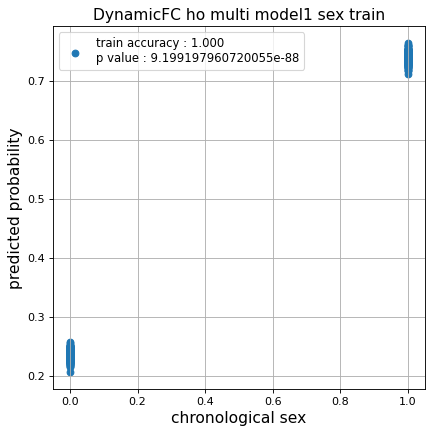

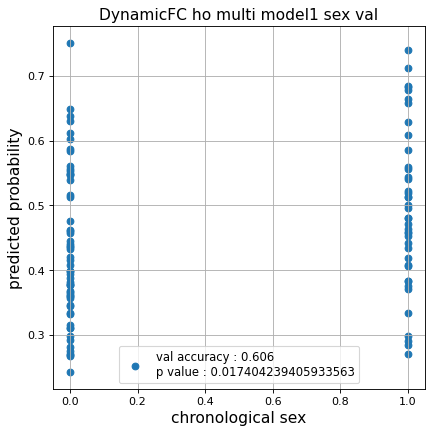

Kfold: 2 ::: epoch: 100, loss: 0.6158677339553833, val loss: 0.6028317362070084
Kfold: 2 ::: epoch: 200, loss: 0.6131442189216614, val loss: 0.5985579639673233
Kfold: 2 ::: epoch: 300, loss: 0.612041372519273, val loss: 0.5998553335666656
Kfold: 2 ::: epoch: 400, loss: 0.6118619579535264, val loss: 0.5979654043912888
Kfold: 2 ::: epoch: 500, loss: 0.6114593194081233, val loss: 0.5834727585315704
Kfold: 2 ::: epoch: 600, loss: 0.6112489379369296, val loss: 0.5789375305175781
Kfold: 2 ::: epoch: 700, loss: 0.611221024623284, val loss: 0.5772050023078918
save_epochs:654
best val loss:0.5722780749201775


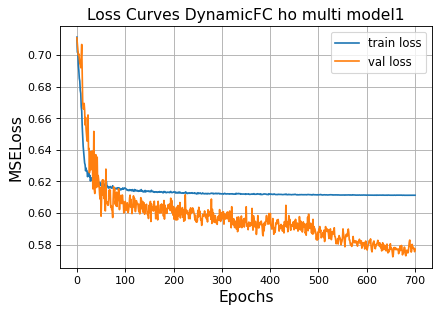

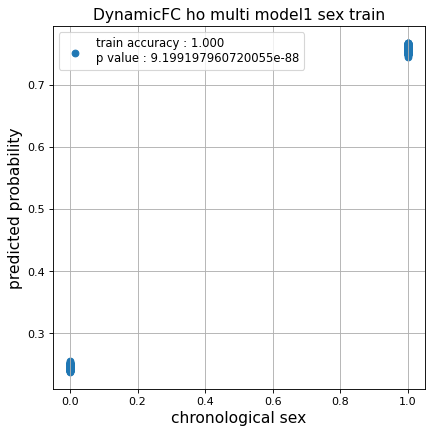

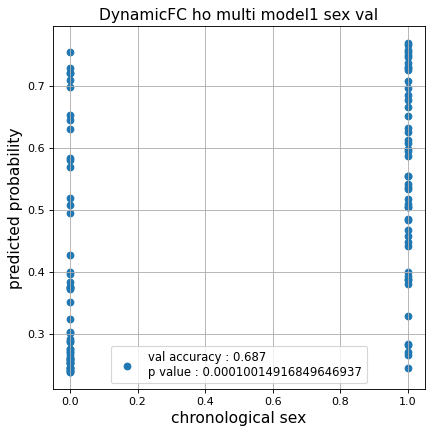

Kfold: 3 ::: epoch: 100, loss: 0.6146745727612422, val loss: 0.6718011647462845
Kfold: 3 ::: epoch: 200, loss: 0.6126358142265906, val loss: 0.6441455632448196
Kfold: 3 ::: epoch: 300, loss: 0.6120891433495742, val loss: 0.6224509030580521
Kfold: 3 ::: epoch: 400, loss: 0.6117418912740854, val loss: 0.6236379444599152
Kfold: 3 ::: epoch: 500, loss: 0.6114848577059232, val loss: 0.5979989990592003
Kfold: 3 ::: epoch: 600, loss: 0.6113002391961905, val loss: 0.5994641482830048
Kfold: 3 ::: epoch: 700, loss: 0.6111862980402433, val loss: 0.5893019810318947
save_epochs:667
best val loss:0.5741342157125473


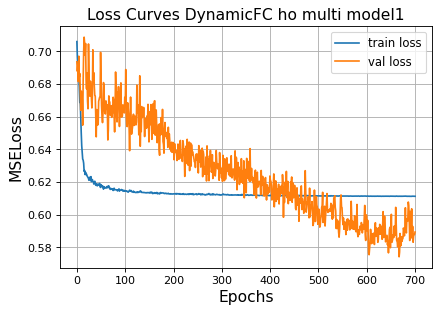

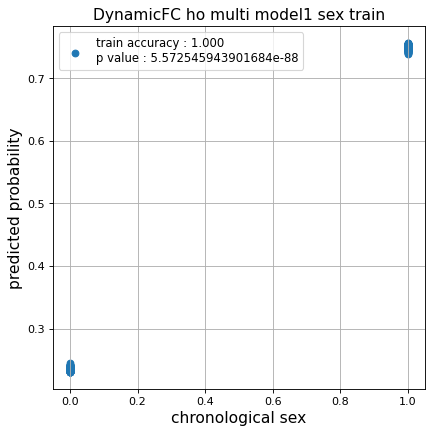

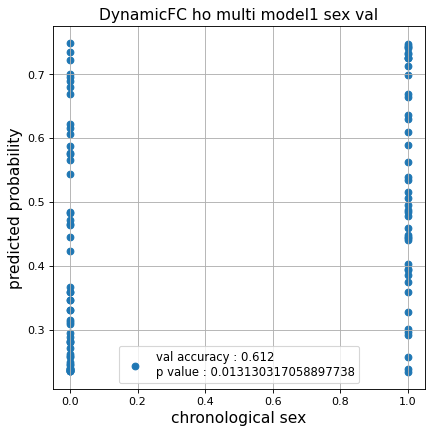

Kfold: 4 ::: epoch: 100, loss: 0.6147659741915189, val loss: 0.6853998303413391
Kfold: 4 ::: epoch: 200, loss: 0.6128216569240277, val loss: 0.70474873483181
Kfold: 4 ::: epoch: 300, loss: 0.612312729542072, val loss: 0.7011876255273819
Kfold: 4 ::: epoch: 400, loss: 0.6117525009008554, val loss: 0.7124880105257034
early stopping
save_epochs:215
best val loss:0.6779346913099289


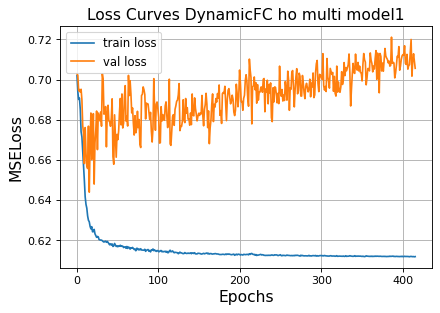

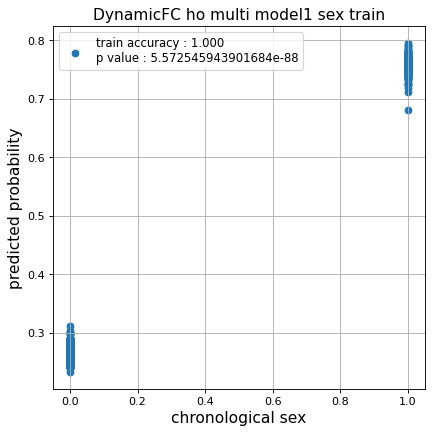

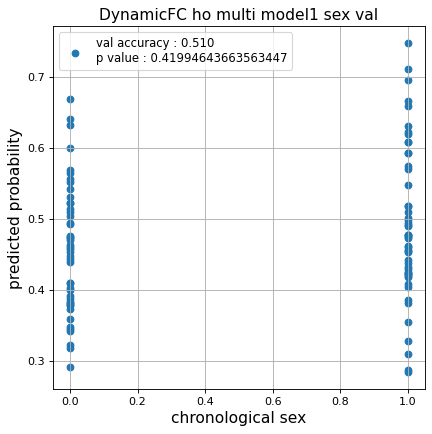

Kfold: 5 ::: epoch: 100, loss: 0.614736951314486, val loss: 0.6584679037332535
Kfold: 5 ::: epoch: 200, loss: 0.6130757790345412, val loss: 0.6512023508548737
Kfold: 5 ::: epoch: 300, loss: 0.6122255967213557, val loss: 0.6539966911077499
Kfold: 5 ::: epoch: 400, loss: 0.6119284859070411, val loss: 0.647569864988327
Kfold: 5 ::: epoch: 500, loss: 0.6117958564024705, val loss: 0.6491875797510147
Kfold: 5 ::: epoch: 600, loss: 0.6115283094919645, val loss: 0.6509558111429214
early stopping
save_epochs:461
best val loss:0.6417785137891769


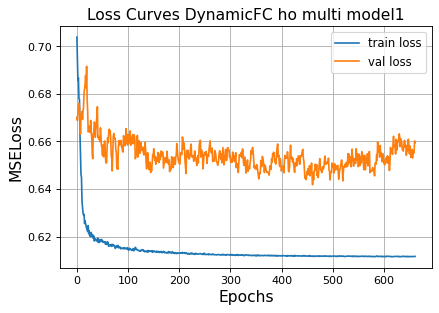

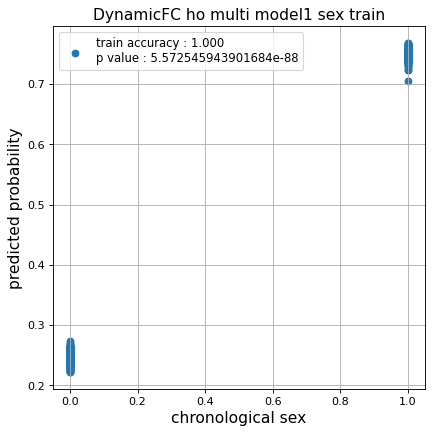

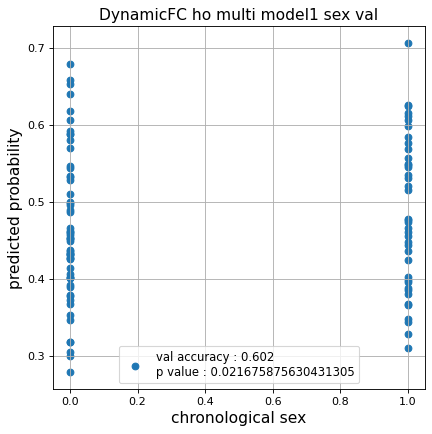

CPU times: user 23h 12min 41s, sys: 1min 33s, total: 23h 14min 14s
Wall time: 3h 23min 24s


In [ ]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_ho_dynamic_1  = []
test_pred_ho_dynamic_corrected_1  = []
test_label_ho_dynamic_1 = []
test_idx_ho_dynamic_1   = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_ho)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_corrected,test_label = train_model(data_dynamic_ho,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 700,
                                                           d_model    = 64,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 256,
                                                           nhead      = 2,#4
                                                           hidden_dim_transformer = 1,#2
                                                           pos_drop   = 0.3,
                                                           trans_drop = 0.5,
                                                           fc_drop = 0.3,
                                                           title = 'DynamicFC ho multi model1'
                                                          )
    
    test_pred_ho_dynamic_1.append(test_pred)
    test_pred_ho_dynamic_corrected_1.append(test_pred_corrected)
    test_label_ho_dynamic_1.append(test_label)
    test_idx_ho_dynamic_1.append(test_idx)

### Dynamic FC 2

Nested Kfold ::: 1
Kfold: 1 ::: epoch: 100, loss: 0.6153062857114352, val loss: 0.652790442109108
Kfold: 1 ::: epoch: 200, loss: 0.6130299384777362, val loss: 0.6456522047519684
Kfold: 1 ::: epoch: 300, loss: 0.6121859550476074, val loss: 0.6439229995012283
Kfold: 1 ::: epoch: 400, loss: 0.6120684559528644, val loss: 0.6338711977005005
early stopping
save_epochs:235
best val loss:0.6319141685962677


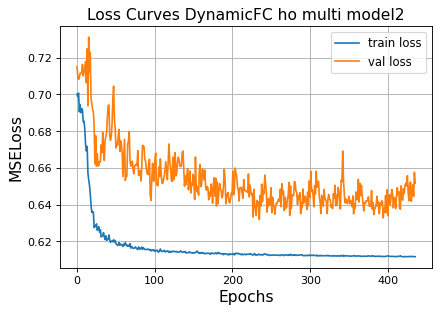

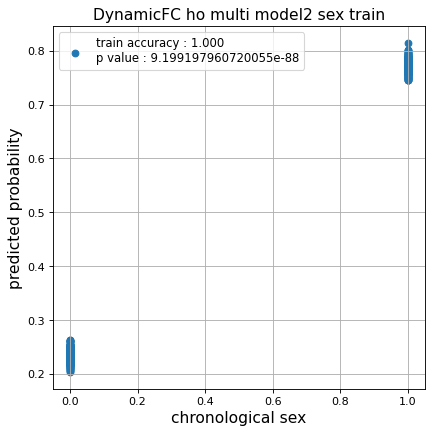

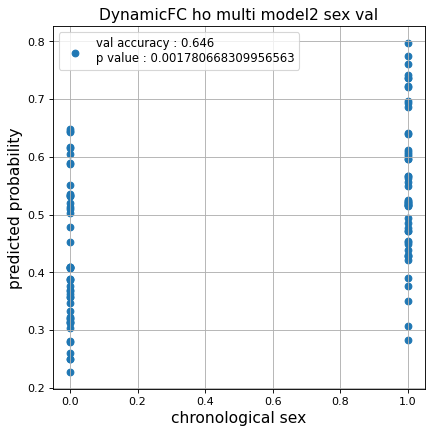

Kfold: 2 ::: epoch: 100, loss: 0.6155572075110215, val loss: 0.5884924009442329
Kfold: 2 ::: epoch: 200, loss: 0.6129841116758493, val loss: 0.5827124938368797
Kfold: 2 ::: epoch: 300, loss: 0.6126872805448679, val loss: 0.5688229128718376
Kfold: 2 ::: epoch: 400, loss: 0.6119811947529132, val loss: 0.5542272478342056
Kfold: 2 ::: epoch: 500, loss: 0.6114145884147058, val loss: 0.5447310954332352
Kfold: 2 ::: epoch: 600, loss: 0.6112673603571378, val loss: 0.5448033437132835
Kfold: 2 ::: epoch: 700, loss: 0.6112124369694636, val loss: 0.5492527931928635
save_epochs:666
best val loss:0.5271488502621651


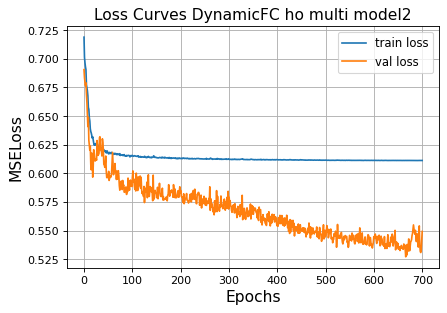

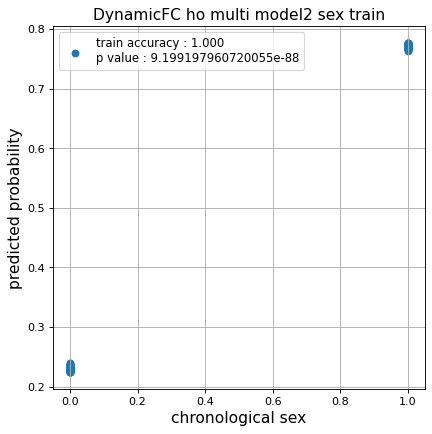

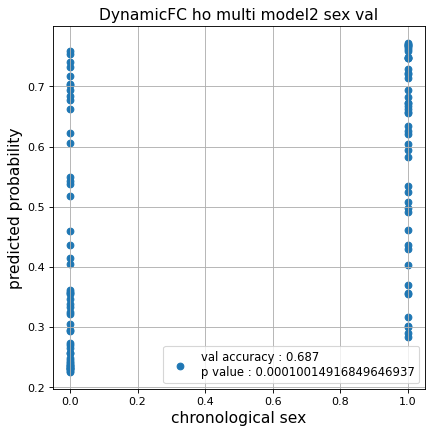

Kfold: 3 ::: epoch: 100, loss: 0.6149996610788199, val loss: 0.6723919361829758
Kfold: 3 ::: epoch: 200, loss: 0.6130993733039269, val loss: 0.6937295794487
Kfold: 3 ::: epoch: 300, loss: 0.6124230256447425, val loss: 0.6726346462965012
Kfold: 3 ::: epoch: 400, loss: 0.6117916428125821, val loss: 0.6593230217695236
Kfold: 3 ::: epoch: 500, loss: 0.6115869421225327, val loss: 0.6501196175813675
Kfold: 3 ::: epoch: 600, loss: 0.6113197620098407, val loss: 0.6314993649721146
Kfold: 3 ::: epoch: 700, loss: 0.6111921392954313, val loss: 0.6029123812913895
save_epochs:694
best val loss:0.6011593043804169


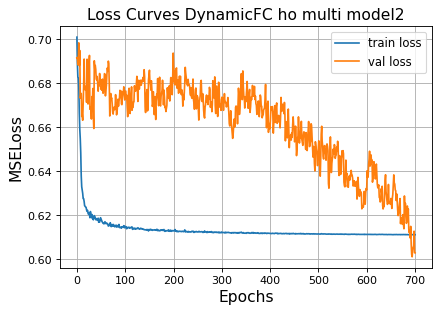

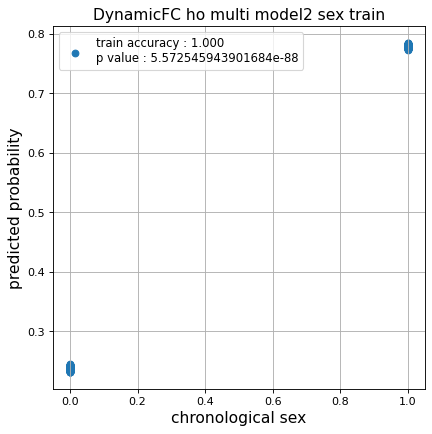

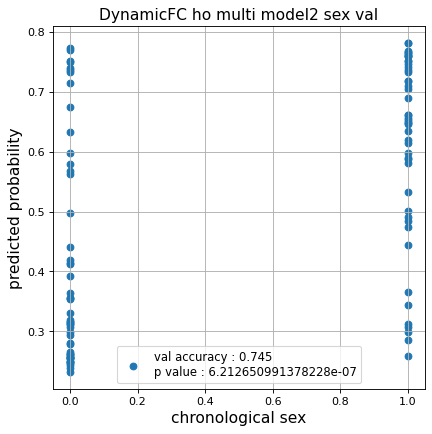

Kfold: 4 ::: epoch: 100, loss: 0.6149603174282954, val loss: 0.5915433019399643
Kfold: 4 ::: epoch: 200, loss: 0.6131218534249526, val loss: 0.5999226272106171
Kfold: 4 ::: epoch: 300, loss: 0.612263221007127, val loss: 0.6152953803539276
Kfold: 4 ::: epoch: 400, loss: 0.6118093270521897, val loss: 0.6082107126712799
early stopping
save_epochs:284
best val loss:0.584416002035141


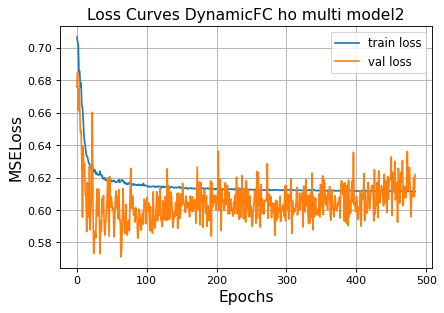

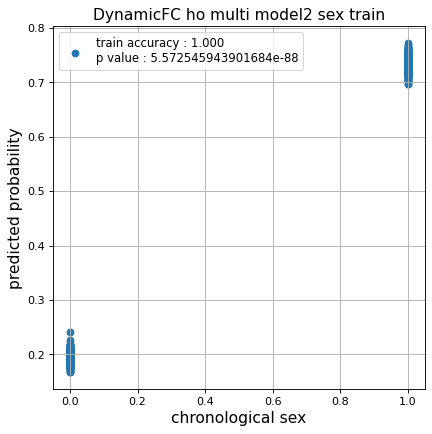

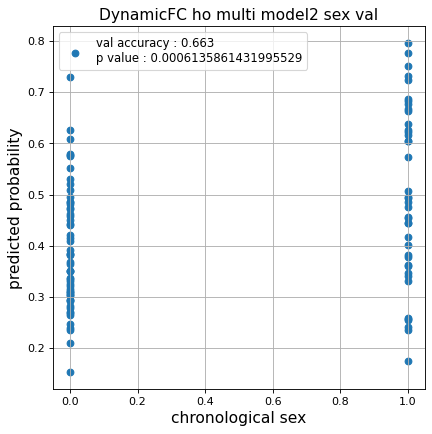

Kfold: 5 ::: epoch: 100, loss: 0.6147784407322223, val loss: 0.6363320350646973
Kfold: 5 ::: epoch: 200, loss: 0.6130954118875357, val loss: 0.6295094341039658
Kfold: 5 ::: epoch: 300, loss: 0.6122684753858126, val loss: 0.6339353322982788
Kfold: 5 ::: epoch: 400, loss: 0.6118687712229215, val loss: 0.616811990737915
Kfold: 5 ::: epoch: 500, loss: 0.6116543274659377, val loss: 0.6083282828330994
Kfold: 5 ::: epoch: 600, loss: 0.6114375637127802, val loss: 0.5995939522981644
Kfold: 5 ::: epoch: 700, loss: 0.611358486689054, val loss: 0.6099482029676437
save_epochs:529
best val loss:0.5935545116662979


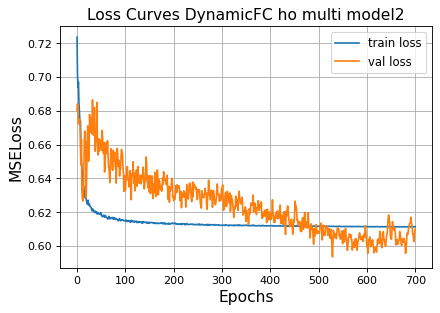

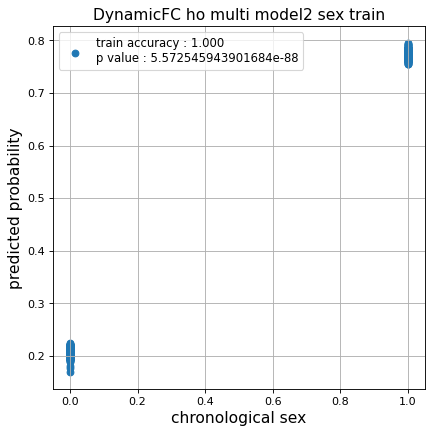

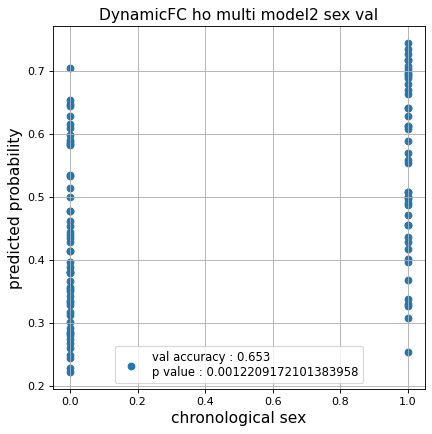

Nested Kfold ::: 2
Kfold: 1 ::: epoch: 100, loss: 0.6156073350172776, val loss: 0.6862418949604034
Kfold: 1 ::: epoch: 200, loss: 0.6131579509148231, val loss: 0.6652930378913879
Kfold: 1 ::: epoch: 300, loss: 0.6121609440216651, val loss: 0.6564828902482986
Kfold: 1 ::: epoch: 400, loss: 0.6119108887819144, val loss: 0.6502523869276047
Kfold: 1 ::: epoch: 500, loss: 0.6114119428854722, val loss: 0.6341768354177475
Kfold: 1 ::: epoch: 600, loss: 0.6112185120582581, val loss: 0.6557419300079346
Kfold: 1 ::: epoch: 700, loss: 0.611161103615394, val loss: 0.640932485461235
save_epochs:524
best val loss:0.6245273649692535


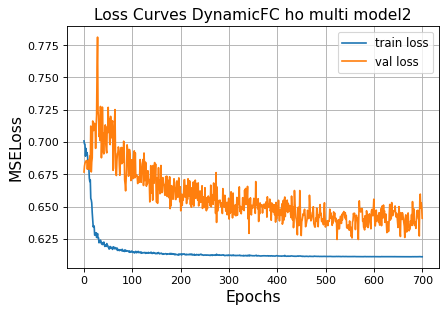

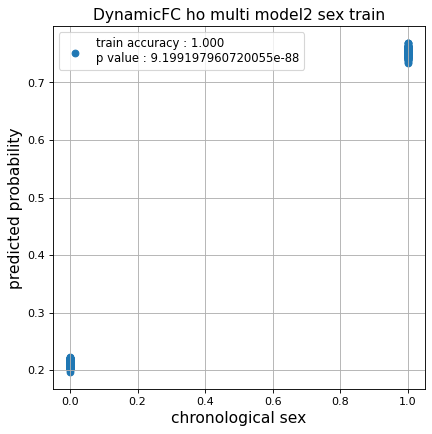

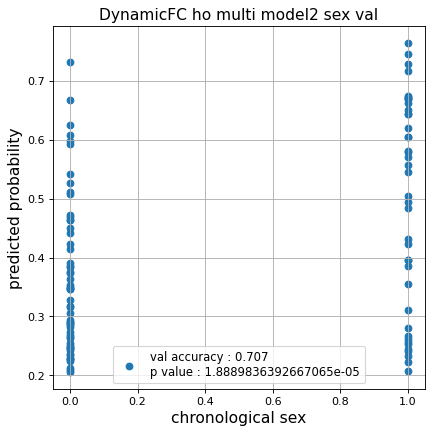

Kfold: 2 ::: epoch: 100, loss: 0.615730528648083, val loss: 0.5780770629644394
Kfold: 2 ::: epoch: 200, loss: 0.6128990696026728, val loss: 0.5739901214838028
Kfold: 2 ::: epoch: 300, loss: 0.6122199021852933, val loss: 0.5676033943891525
Kfold: 2 ::: epoch: 400, loss: 0.6119087567696204, val loss: 0.5592463910579681
Kfold: 2 ::: epoch: 500, loss: 0.6114431115297171, val loss: 0.5564204975962639
Kfold: 2 ::: epoch: 600, loss: 0.6112748476175162, val loss: 0.560789056122303
Kfold: 2 ::: epoch: 700, loss: 0.6112292042145362, val loss: 0.5770754963159561
save_epochs:646
best val loss:0.5407933965325356


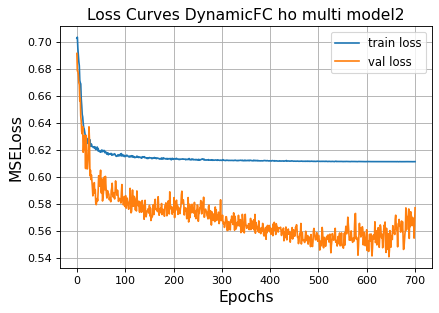

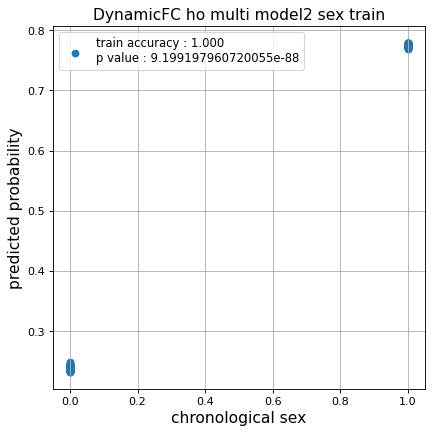

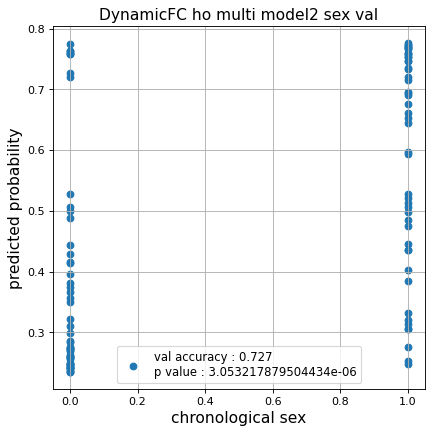

Kfold: 3 ::: epoch: 100, loss: 0.6148678981340848, val loss: 0.6768194735050201
Kfold: 3 ::: epoch: 200, loss: 0.6128539947363046, val loss: 0.6792077124118805
Kfold: 3 ::: epoch: 300, loss: 0.6121732088235708, val loss: 0.7065906226634979
Kfold: 3 ::: epoch: 400, loss: 0.6117106859500592, val loss: 0.7249254584312439
early stopping
save_epochs:236
best val loss:0.6778392195701599


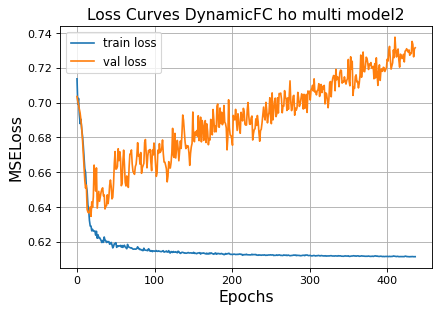

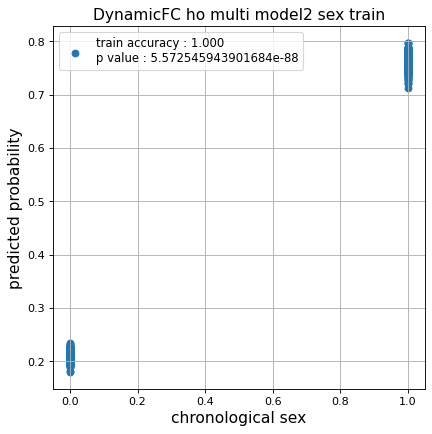

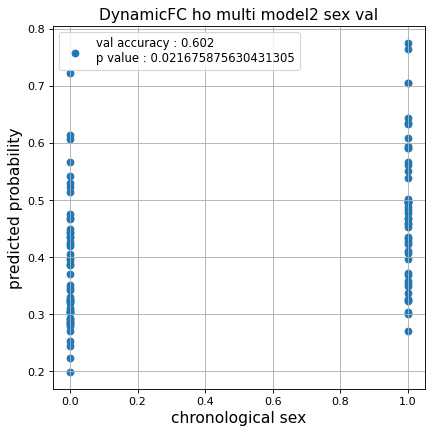

Kfold: 4 ::: epoch: 100, loss: 0.614876206104572, val loss: 0.6709027141332626
Kfold: 4 ::: epoch: 200, loss: 0.6129828416384183, val loss: 0.666754350066185
Kfold: 4 ::: epoch: 300, loss: 0.6123251364781306, val loss: 0.6387154906988144
Kfold: 4 ::: epoch: 400, loss: 0.6118369423426114, val loss: 0.6424228399991989
Kfold: 4 ::: epoch: 500, loss: 0.6115184472157404, val loss: 0.6409154534339905
Kfold: 4 ::: epoch: 600, loss: 0.6114485905720637, val loss: 0.6459563970565796
Kfold: 4 ::: epoch: 700, loss: 0.6114179400297312, val loss: 0.6389152854681015
save_epochs:685
best val loss:0.6065755933523178


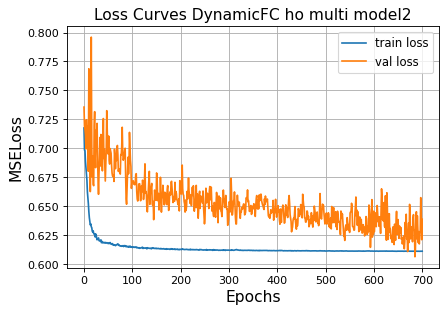

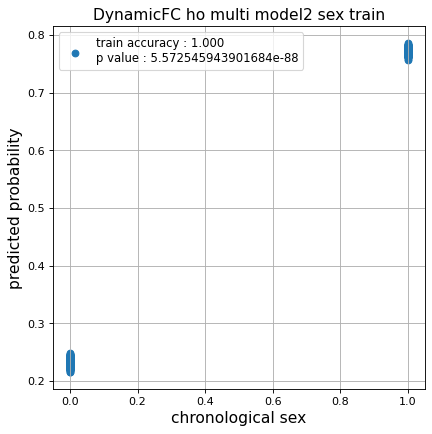

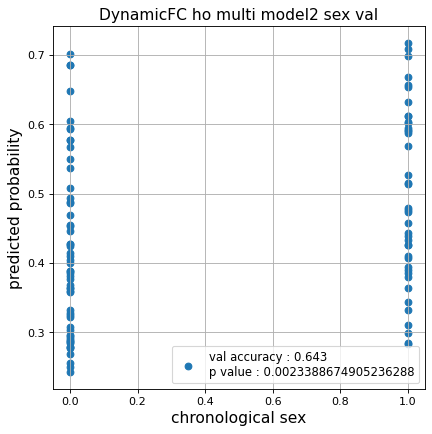

Kfold: 5 ::: epoch: 100, loss: 0.6149352422127357, val loss: 0.6418398469686508
Kfold: 5 ::: epoch: 200, loss: 0.6129510769477258, val loss: 0.6182496398687363
Kfold: 5 ::: epoch: 300, loss: 0.6121950378784766, val loss: 0.6128261238336563
Kfold: 5 ::: epoch: 400, loss: 0.6119405856499305, val loss: 0.603844091296196
Kfold: 5 ::: epoch: 500, loss: 0.6117176551085252, val loss: 0.6059104651212692
Kfold: 5 ::: epoch: 600, loss: 0.6113776518748357, val loss: 0.6021486222743988
Kfold: 5 ::: epoch: 700, loss: 0.6111829280853271, val loss: 0.6270318776369095
save_epochs:573
best val loss:0.5867574065923691


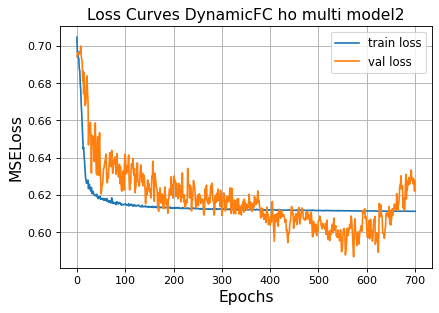

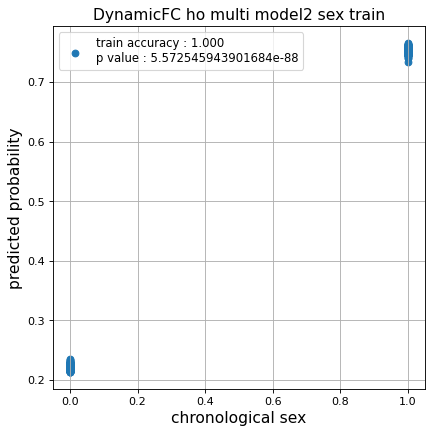

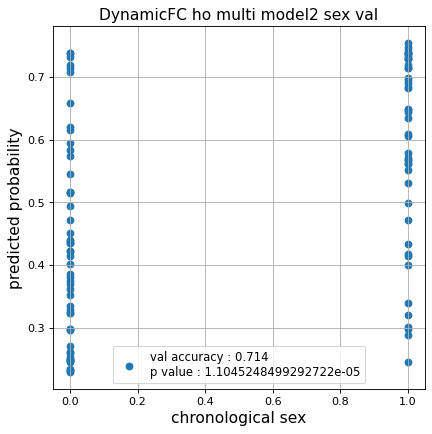

Nested Kfold ::: 3
Kfold: 1 ::: epoch: 100, loss: 0.615424646781041, val loss: 0.6538956761360168
Kfold: 1 ::: epoch: 200, loss: 0.6133384979688205, val loss: 0.6429006308317184
Kfold: 1 ::: epoch: 300, loss: 0.6123376809633695, val loss: 0.6406129449605942
Kfold: 1 ::: epoch: 400, loss: 0.6119508376488318, val loss: 0.6282882839441299
Kfold: 1 ::: epoch: 500, loss: 0.6114707680848929, val loss: 0.6275245100259781
Kfold: 1 ::: epoch: 600, loss: 0.611267245732821, val loss: 0.6524039506912231
early stopping
save_epochs:446
best val loss:0.6228059232234955


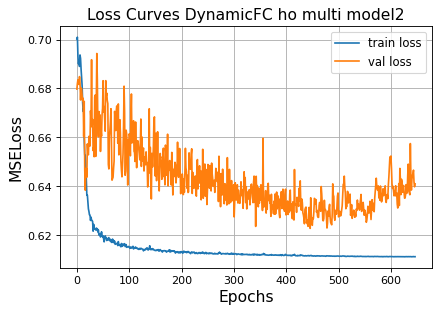

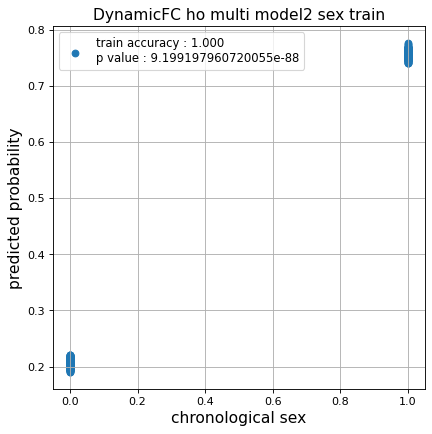

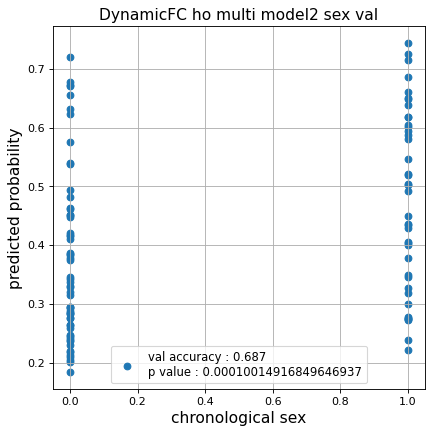

Kfold: 2 ::: epoch: 100, loss: 0.6152994541021494, val loss: 0.6270321607589722
Kfold: 2 ::: epoch: 200, loss: 0.6135705663607671, val loss: 0.6170535832643509
Kfold: 2 ::: epoch: 300, loss: 0.6125163160837613, val loss: 0.6085633933544159
Kfold: 2 ::: epoch: 400, loss: 0.6121430442883418, val loss: 0.5920941233634949
Kfold: 2 ::: epoch: 500, loss: 0.611620829655574, val loss: 0.568914458155632
Kfold: 2 ::: epoch: 600, loss: 0.6113528838524451, val loss: 0.5495320037007332
Kfold: 2 ::: epoch: 700, loss: 0.6111978338314936, val loss: 0.5449467748403549
save_epochs:676
best val loss:0.5360174104571342


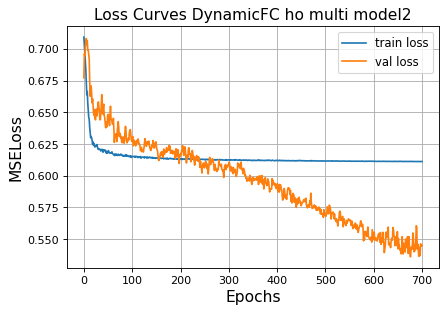

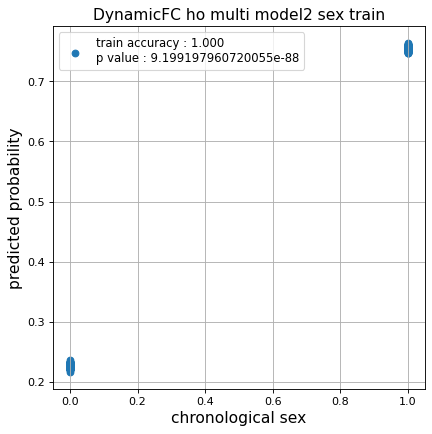

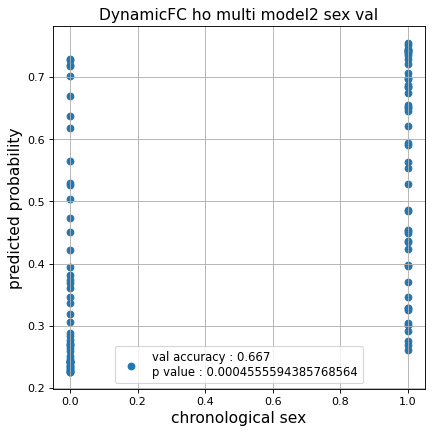

Kfold: 3 ::: epoch: 100, loss: 0.614853194126716, val loss: 0.7695101648569107
Kfold: 3 ::: epoch: 200, loss: 0.6132676555560186, val loss: 0.7601360529661179
Kfold: 3 ::: epoch: 300, loss: 0.612392952808967, val loss: 0.749370738863945
Kfold: 3 ::: epoch: 400, loss: 0.6119233644925631, val loss: 0.7600446194410324
early stopping
save_epochs:274
best val loss:0.7340135127305984


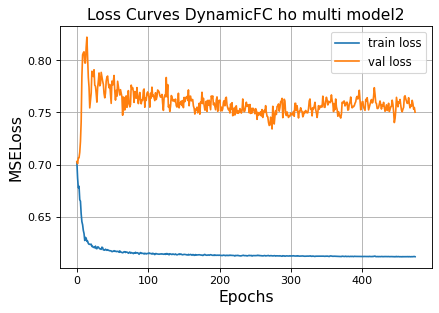

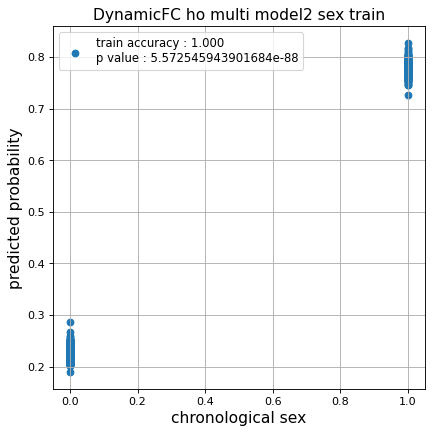

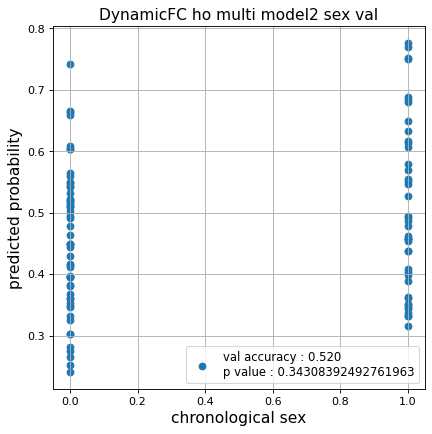

Kfold: 4 ::: epoch: 100, loss: 0.6140008614613459, val loss: 0.7123163938522339
Kfold: 4 ::: epoch: 200, loss: 0.6126390007825998, val loss: 0.6826736927032471
Kfold: 4 ::: epoch: 300, loss: 0.6120654390408442, val loss: 0.710559293627739
Kfold: 4 ::: epoch: 400, loss: 0.6116866927880508, val loss: 0.7371784001588821
early stopping
save_epochs:208
best val loss:0.6796687841415405


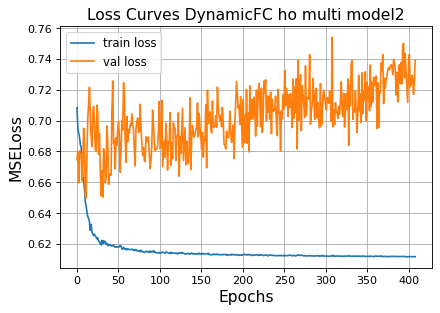

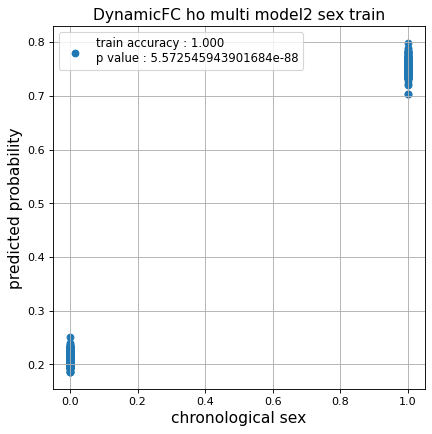

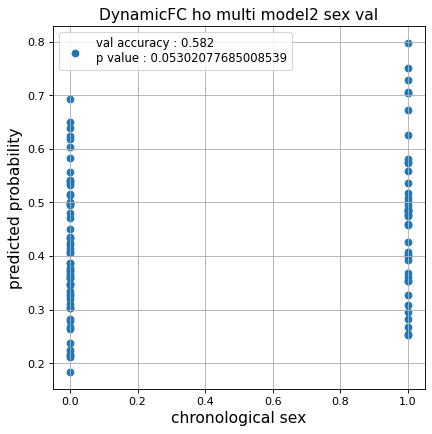

Kfold: 5 ::: epoch: 100, loss: 0.6142340485866253, val loss: 0.6261038482189178
Kfold: 5 ::: epoch: 200, loss: 0.6131092722599323, val loss: 0.6354379057884216
Kfold: 5 ::: epoch: 300, loss: 0.6121248373618493, val loss: 0.6216920167207718
Kfold: 5 ::: epoch: 400, loss: 0.6116268313848056, val loss: 0.6190581619739532
Kfold: 5 ::: epoch: 500, loss: 0.6113726038199204, val loss: 0.6079700440168381
Kfold: 5 ::: epoch: 600, loss: 0.6112059675730191, val loss: 0.5999366044998169
Kfold: 5 ::: epoch: 700, loss: 0.6111939686995286, val loss: 0.5962055176496506
save_epochs:659
best val loss:0.5820533037185669


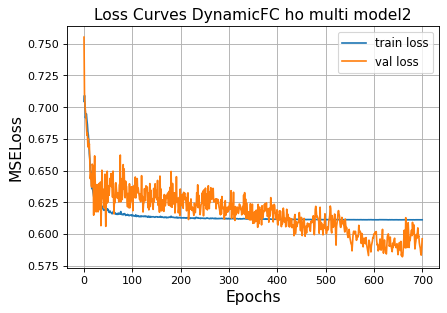

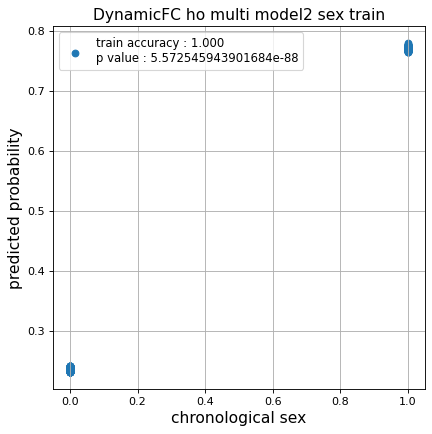

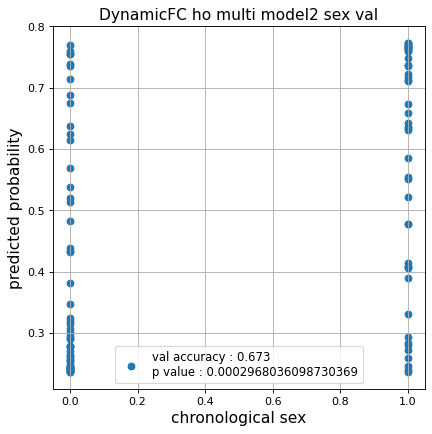

Nested Kfold ::: 4
Kfold: 1 ::: epoch: 100, loss: 0.6158942534373357, val loss: 0.6750242561101913
Kfold: 1 ::: epoch: 200, loss: 0.6131701194323026, val loss: 0.6647878587245941
Kfold: 1 ::: epoch: 300, loss: 0.6122287649374741, val loss: 0.6505838930606842
Kfold: 1 ::: epoch: 400, loss: 0.6119907865157495, val loss: 0.63337242603302
Kfold: 1 ::: epoch: 500, loss: 0.6115046143531799, val loss: 0.6326090097427368
Kfold: 1 ::: epoch: 600, loss: 0.6112747146533086, val loss: 0.6633128970861435
Kfold: 1 ::: epoch: 700, loss: 0.6111988471104548, val loss: 0.6099067181348801
save_epochs:695
best val loss:0.6044131815433502


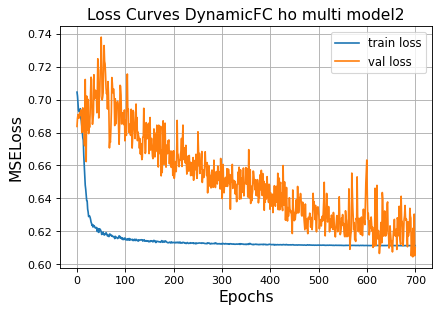

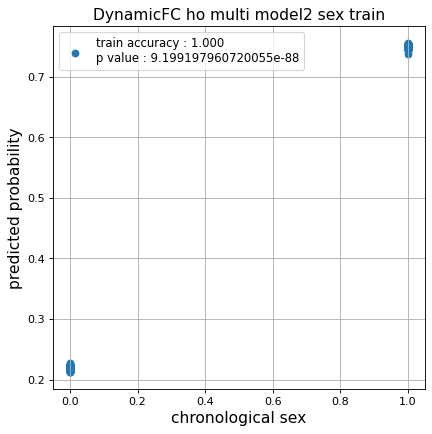

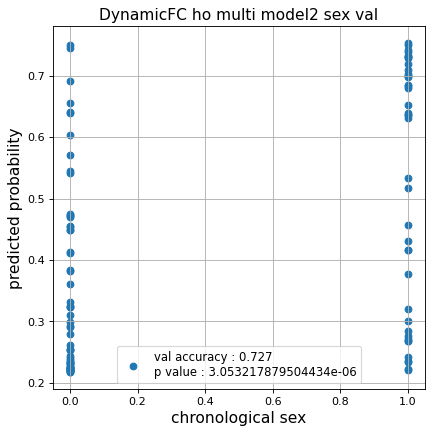

Kfold: 2 ::: epoch: 100, loss: 0.6157464889379648, val loss: 0.6223668307065964
Kfold: 2 ::: epoch: 200, loss: 0.6131952680074252, val loss: 0.609178751707077
Kfold: 2 ::: epoch: 300, loss: 0.6124332822286166, val loss: 0.6011311709880829
Kfold: 2 ::: epoch: 400, loss: 0.6119383435982925, val loss: 0.5879151523113251
Kfold: 2 ::: epoch: 500, loss: 0.6115194650796744, val loss: 0.5768736600875854
Kfold: 2 ::: epoch: 600, loss: 0.6112680756128751, val loss: 0.57816581428051
Kfold: 2 ::: epoch: 700, loss: 0.6112016760385953, val loss: 0.5734543353319168
save_epochs:660
best val loss:0.5664339512586594


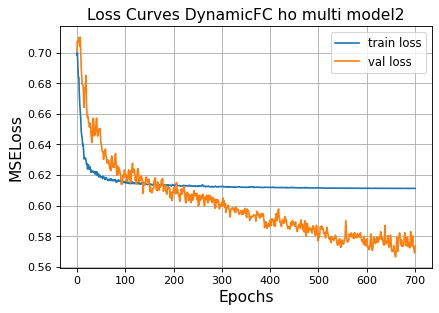

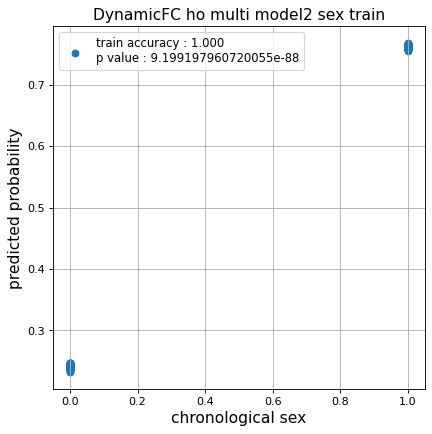

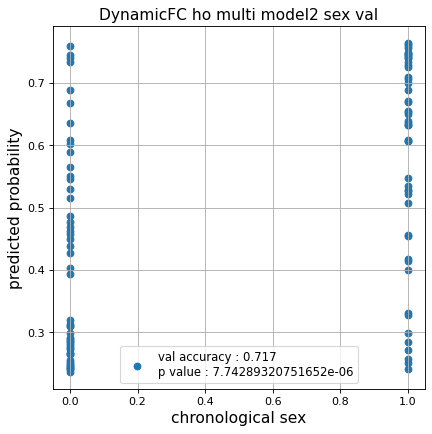

Kfold: 3 ::: epoch: 100, loss: 0.6146287872241094, val loss: 0.5633682161569595
Kfold: 3 ::: epoch: 200, loss: 0.6130635279875535, val loss: 0.5561013370752335
Kfold: 3 ::: epoch: 300, loss: 0.6123853279994085, val loss: 0.5523599535226822
Kfold: 3 ::: epoch: 400, loss: 0.6117642430158762, val loss: 0.5531319677829742
Kfold: 3 ::: epoch: 500, loss: 0.6113744102991544, val loss: 0.5426195710897446
Kfold: 3 ::: epoch: 600, loss: 0.6111977833967942, val loss: 0.5513943880796432
Kfold: 3 ::: epoch: 700, loss: 0.6111951149426974, val loss: 0.5626069083809853
save_epochs:501
best val loss:0.5389841943979263


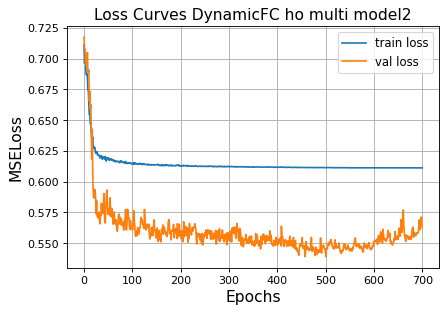

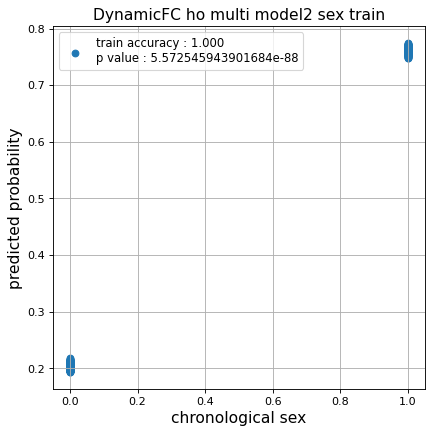

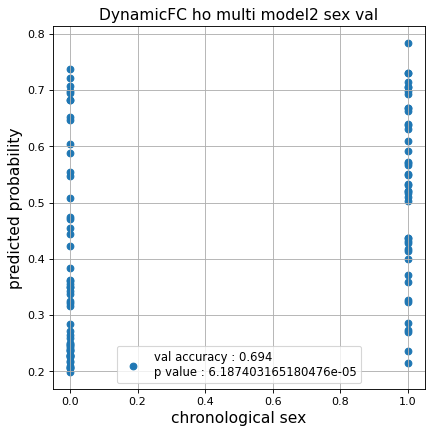

Kfold: 4 ::: epoch: 300, loss: 0.6123844889494089, val loss: 0.6986361742019653
Kfold: 4 ::: epoch: 400, loss: 0.6120779881110558, val loss: 0.6816405653953552
Kfold: 4 ::: epoch: 500, loss: 0.6118452915778527, val loss: 0.6734167635440826
Kfold: 4 ::: epoch: 600, loss: 0.611659613939432, val loss: 0.661715105175972
Kfold: 4 ::: epoch: 700, loss: 0.6115510051067059, val loss: 0.6535965800285339
save_epochs:696
best val loss:0.6443621069192886


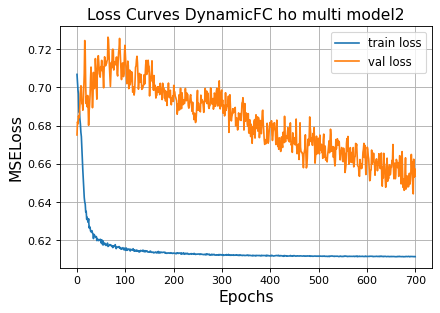

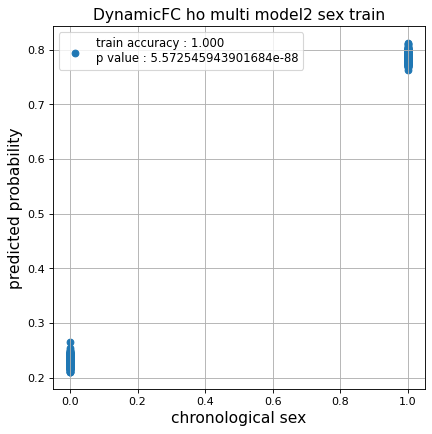

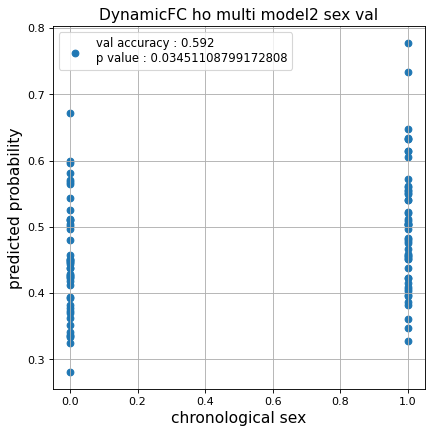

Kfold: 5 ::: epoch: 100, loss: 0.6145468721022973, val loss: 0.5466244667768478
Kfold: 5 ::: epoch: 200, loss: 0.613163792170011, val loss: 0.5484781116247177
Kfold: 5 ::: epoch: 300, loss: 0.6119937529930701, val loss: 0.5530405193567276
Kfold: 5 ::: epoch: 400, loss: 0.6117671132087708, val loss: 0.5592982023954391
early stopping
save_epochs:229
best val loss:0.5406490862369537


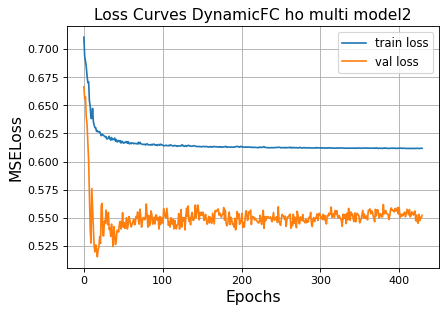

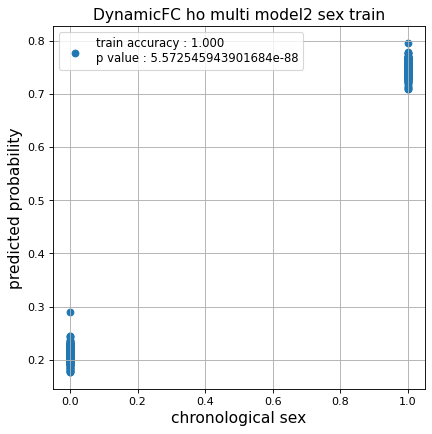

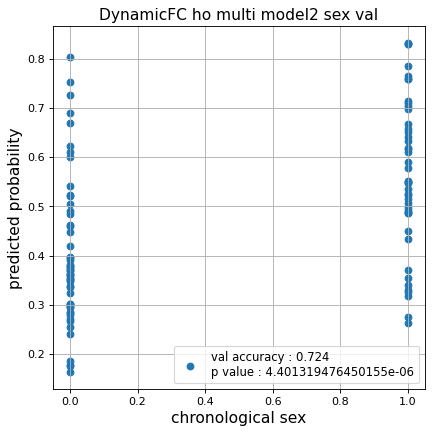

Nested Kfold ::: 5
Kfold: 1 ::: epoch: 100, loss: 0.6156871502216046, val loss: 0.6794979125261307
Kfold: 1 ::: epoch: 200, loss: 0.6130329416348383, val loss: 0.6874042451381683
Kfold: 1 ::: epoch: 300, loss: 0.6122768658858079, val loss: 0.680641770362854
Kfold: 1 ::: epoch: 400, loss: 0.6117706298828125, val loss: 0.6851701140403748
Kfold: 1 ::: epoch: 500, loss: 0.6114585124529325, val loss: 0.6916826367378235
early stopping
save_epochs:388
best val loss:0.6727193295955658


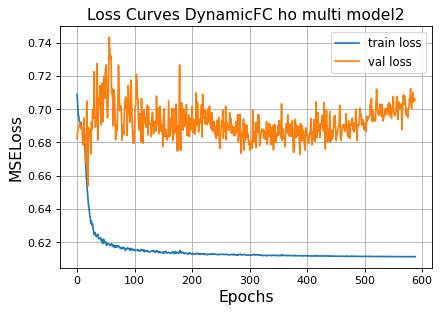

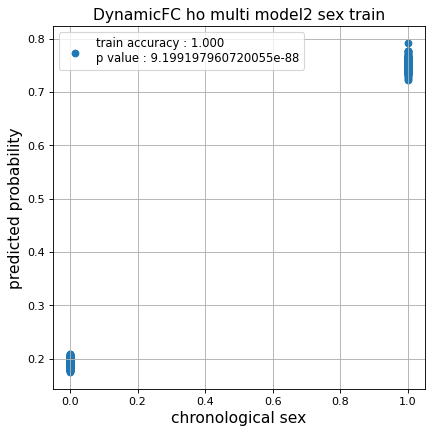

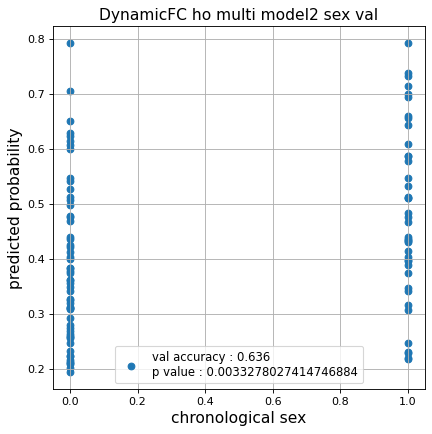

Kfold: 2 ::: epoch: 300, loss: 0.6119569860971891, val loss: 0.6032719612121582
Kfold: 2 ::: epoch: 400, loss: 0.6115887761116028, val loss: 0.5970261096954346
Kfold: 2 ::: epoch: 500, loss: 0.6114053084300115, val loss: 0.5852435529232025
Kfold: 2 ::: epoch: 600, loss: 0.6112069350022536, val loss: 0.5775724202394485
Kfold: 2 ::: epoch: 700, loss: 0.6111792967869685, val loss: 0.5697627514600754
save_epochs:654
best val loss:0.5620628595352173


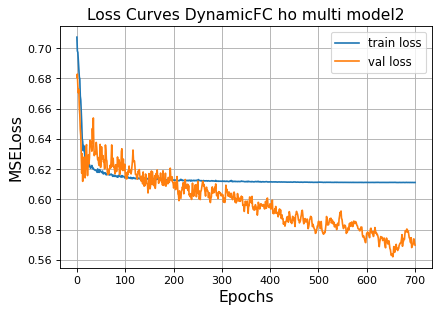

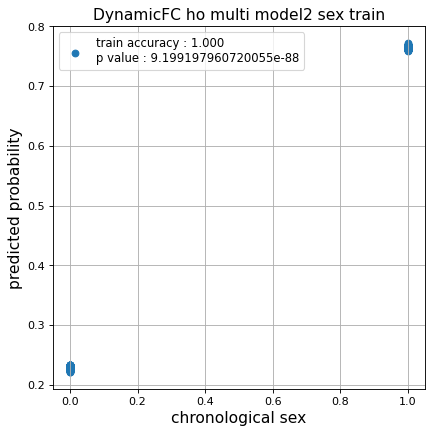

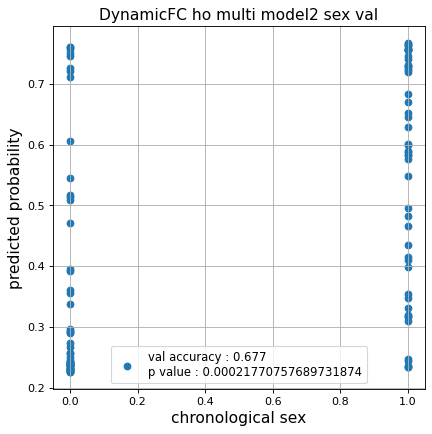

Kfold: 3 ::: epoch: 100, loss: 0.6148430842619675, val loss: 0.6124303638935089
Kfold: 3 ::: epoch: 200, loss: 0.6130872643910922, val loss: 0.5939119160175323
Kfold: 3 ::: epoch: 300, loss: 0.6121990726544306, val loss: 0.5894620716571808
Kfold: 3 ::: epoch: 400, loss: 0.6116925111183753, val loss: 0.5930554643273354
Kfold: 3 ::: epoch: 500, loss: 0.611497333416572, val loss: 0.5912059098482132
Kfold: 3 ::: epoch: 600, loss: 0.6112499970656174, val loss: 0.5799232199788094
Kfold: 3 ::: epoch: 700, loss: 0.6112144543574407, val loss: 0.5466430485248566
save_epochs:690
best val loss:0.5436780601739883


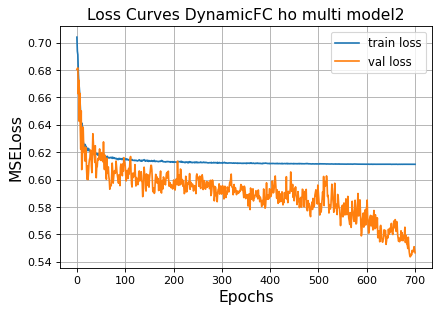

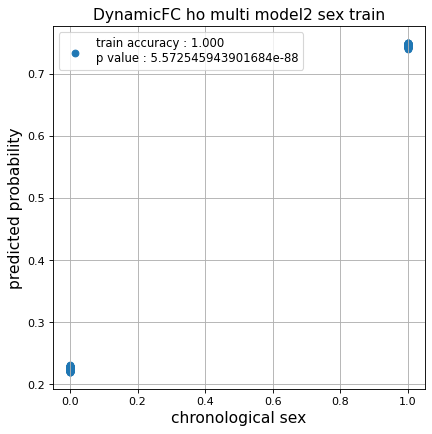

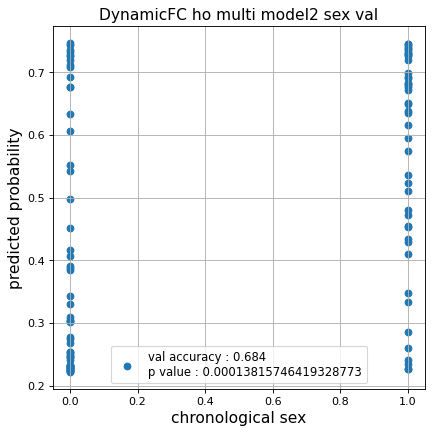

Kfold: 4 ::: epoch: 100, loss: 0.6151609191527734, val loss: 0.7442498654127121
Kfold: 4 ::: epoch: 200, loss: 0.6132471882379972, val loss: 0.7444262653589249
Kfold: 4 ::: epoch: 300, loss: 0.612394433755141, val loss: 0.7250126749277115
Kfold: 4 ::: epoch: 400, loss: 0.6119148226884695, val loss: 0.694198340177536
Kfold: 4 ::: epoch: 500, loss: 0.6116488530085638, val loss: 0.6779110878705978
Kfold: 4 ::: epoch: 600, loss: 0.6115068243100092, val loss: 0.6490701586008072
Kfold: 4 ::: epoch: 700, loss: 0.6113512195073642, val loss: 0.6293548196554184
save_epochs:695
best val loss:0.6100471764802933


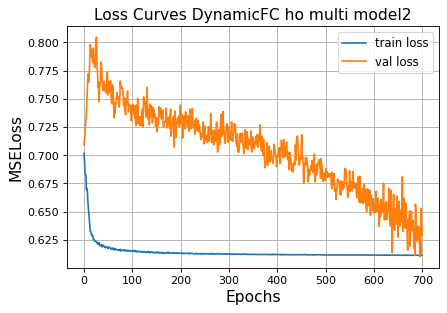

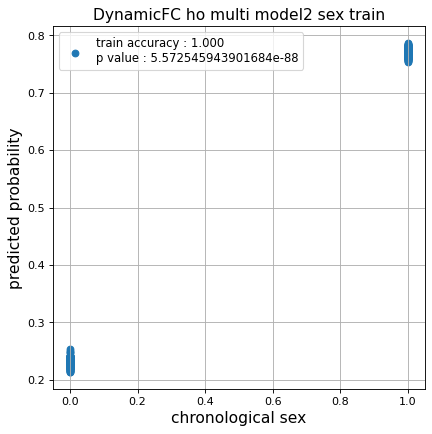

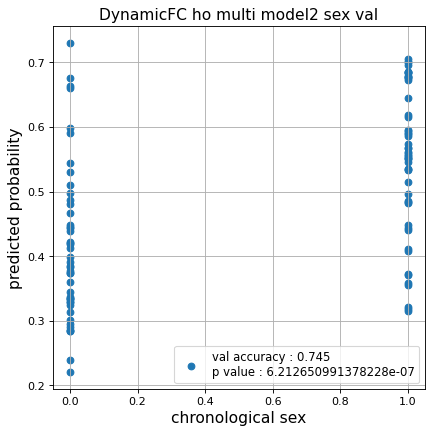

Kfold: 5 ::: epoch: 100, loss: 0.6158852714758652, val loss: 0.6345613896846771
Kfold: 5 ::: epoch: 200, loss: 0.6132258360202496, val loss: 0.6514248698949814
Kfold: 5 ::: epoch: 300, loss: 0.6124952252094562, val loss: 0.6544530540704727
Kfold: 5 ::: epoch: 400, loss: 0.6119964902217572, val loss: 0.6606551259756088
early stopping
save_epochs:254
best val loss:0.6435189843177795


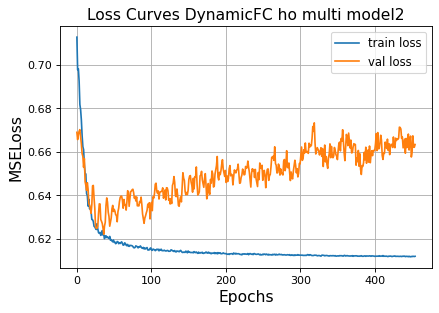

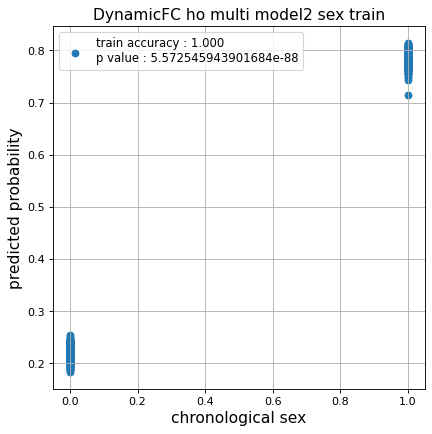

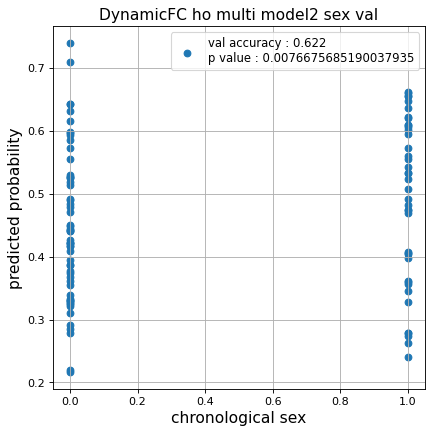

CPU times: user 23h 27min 21s, sys: 1min 35s, total: 23h 28min 56s
Wall time: 3h 25min 59s


In [ ]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_ho_dynamic_2  = []
test_pred_ho_dynamic_corrected_2  = []
test_label_ho_dynamic_2 = []
test_idx_ho_dynamic_2   = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_ho)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_corrected,test_label = train_model(data_dynamic_ho,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 700,
                                                           d_model    = 64,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 256,
                                                           nhead      = 2,#4
                                                           hidden_dim_transformer = 1,#2
                                                           pos_drop    = 0.5,
                                                           trans_drop = 0.5,
                                                           fc_drop = 0.3,
                                                           title = 'DynamicFC ho multi model2'
                                                          )
    
    test_pred_ho_dynamic_2.append(test_pred)
    test_pred_ho_dynamic_corrected_2.append(test_pred_corrected)
    test_label_ho_dynamic_2.append(test_label)
    test_idx_ho_dynamic_2.append(test_idx)

### データ保存

In [35]:
test_pred_ho_dynamic_1 = np.array(test_pred_ho_dynamic_1, dtype=object)
test_pred_ho_dynamic_corrected_1 = np.array(test_pred_ho_dynamic_corrected_1, dtype=object)

test_pred_ho_dynamic_2 = np.array(test_pred_ho_dynamic_2, dtype=object)
test_pred_ho_dynamic_corrected_2 = np.array(test_pred_ho_dynamic_corrected_2, dtype=object)

In [36]:
np.savez('../02_data_analysis/temp/dynamic_ho_sex_1',
         test_pred_ho_dynamic_1,
         test_pred_ho_dynamic_corrected_1,
         test_label_ho_dynamic_1,
         test_idx_ho_dynamic_1)
np.savez('../02_data_analysis/temp/dynamic_ho_sex_2',
         test_pred_ho_dynamic_2,
         test_pred_ho_dynamic_corrected_2,
         test_label_ho_dynamic_2,
         test_idx_ho_dynamic_2)